## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_3"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


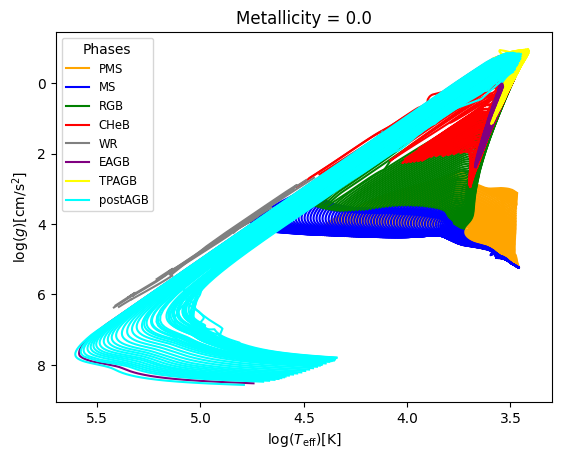

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [6]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
633331,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
633332,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
633333,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
633334,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


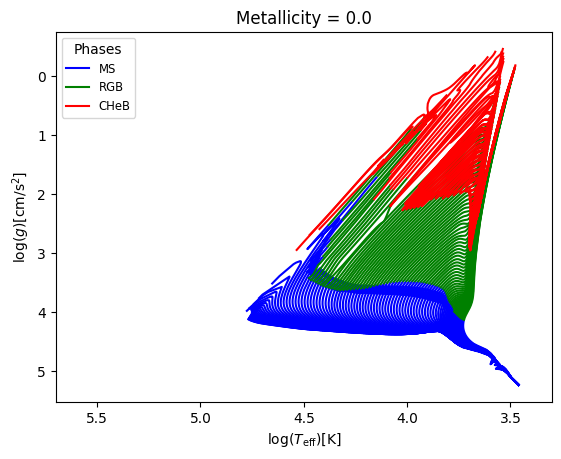

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 633336 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,6.50,4.126429,4.449033,0.0,-0.25,2.859137,0.222566
1,6.50,4.130406,4.448602,0.0,-0.25,2.900395,0.225872
2,6.50,4.134480,4.448201,0.0,-0.25,2.941695,0.229166
3,6.50,4.138527,4.447853,0.0,-0.25,2.982876,0.232424
4,6.55,4.113582,4.450139,0.0,-0.25,2.734122,0.212411
...,...,...,...,...,...,...,...
323154,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
323155,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
323156,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
323157,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


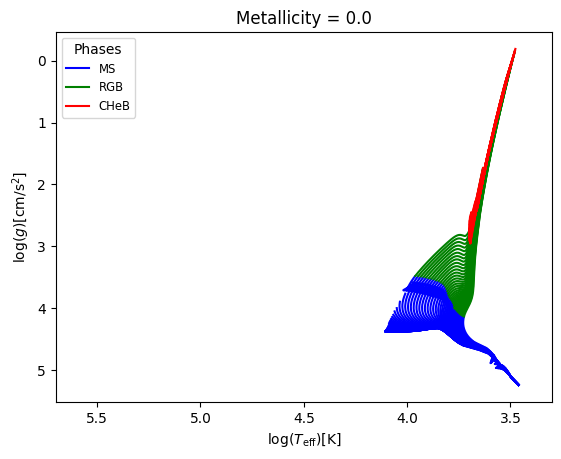

In [9]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 3)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 6.2 - 10.3, Mean : 9.1042, Median : 9.2

log_Teff  : Range : 3.34 - 5.2138, Mean : 3.8022, Median : 3.7554

log_g  : Range : -1.08 - 7.9405, Mean : 3.6564, Median : 4.1712

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 3.0, Mean : 1.3172, Median : 1.1821

log_R  : Range : -1.86 - 2.7813, Mean : 0.4084, Median : 0.2349



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378801600728572
Median value in train data for the log_Teff parameter: 3.9785167259304357
Mean value in train data for the log_Teff parameter: 4.030844032350255

Range in train data for the log_g parameter : -1.0828963170617296 - 7.94051322120885
Median value in train data for the log_g parameter: 3.8548813635672934
Mean value in train data for the log_g parameter: 3.5148592812017254

Range in train data for the log_R parameter : -1.861069007171269 - 3.1297545143214007
Median value in train data for the log_R parameter: 0.6972414370384683
Mean value in train data for the log_R parameter: 0.7295870328373154

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 5.3786324312409
Median value in test data for the log_Teff parameter: 3.9787021647398024
Mean value in test data for the log_Teff parameter: 4.031227940172486

Range in test data for the log_g para

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7525869454440295
  RMSE :  0.17726553633150696
  MAE :  0.1512429094316218
  MedAE :  0.1501564010734846
  CORR :  0.8676395492844978
  MAX_ER :  0.7100396529534985
  Percentiles : 
    75th percentile :  0.2078441829437523
    90th percentile :  0.2568509027846794
    95th percentile :  0.3041800114373588
    99th percentile :  0.4360286052048241

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.7763888621327213
  RMSE :  0.15001280510523474
  MAE :  0.11994056606302116
  MedAE :  0.10599202832400856
  CORR :  0.8820132943444753
  MAX_ER :  0.6264309990220776
  Percentiles : 
    75th percentile :  0.16702694971503496
    90th percentile :  0.22475883939799512
    95th percentile :  0.29004000755903503
    99th percent

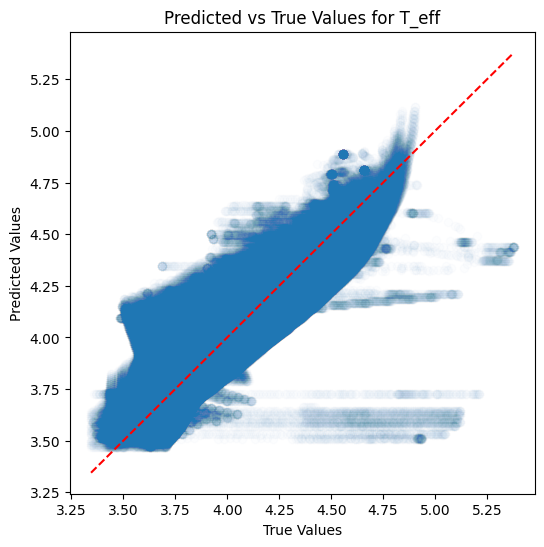

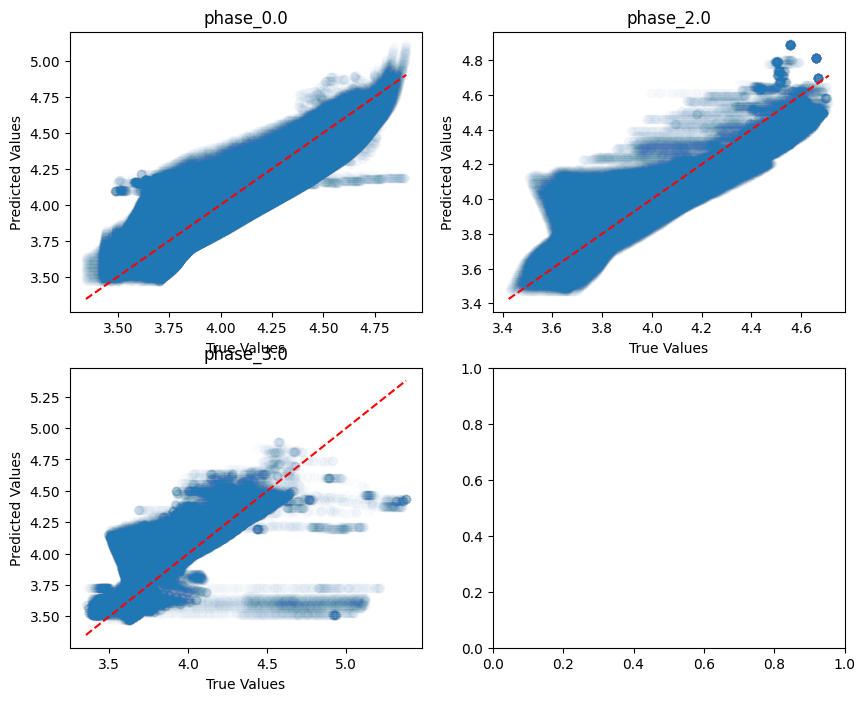

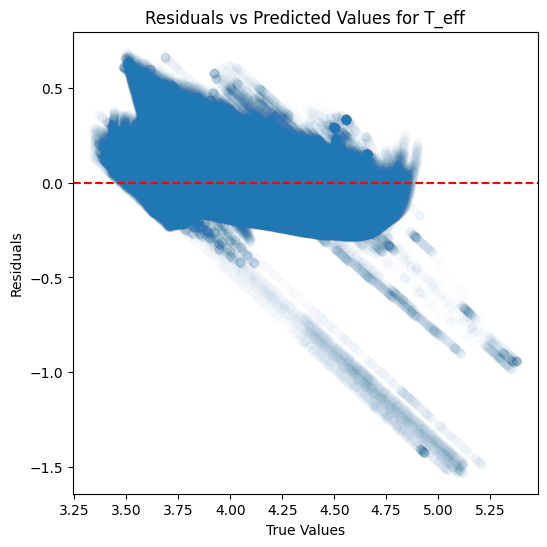

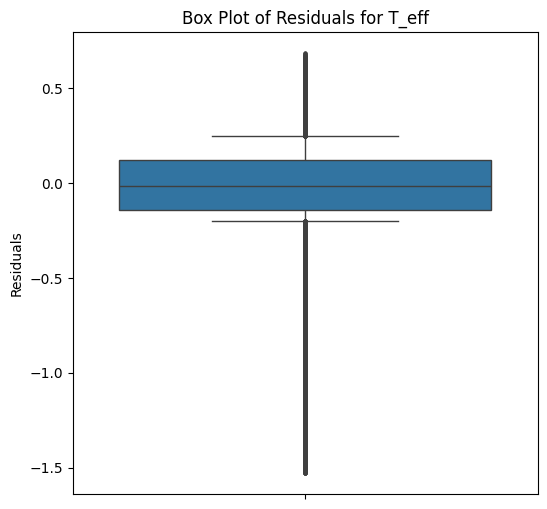

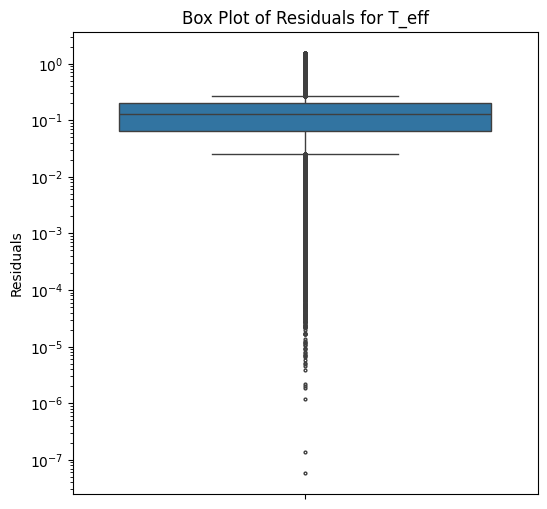

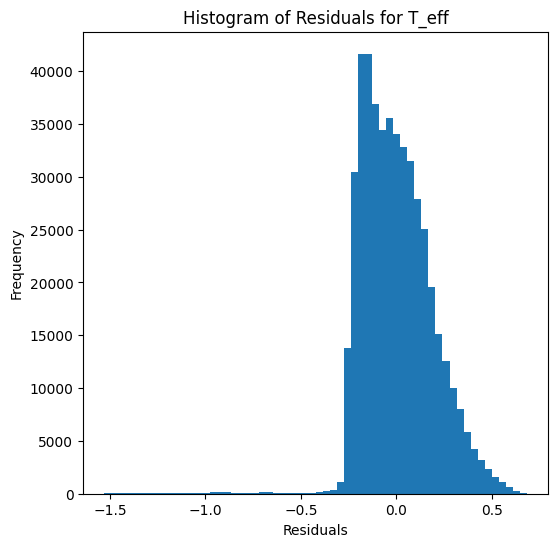

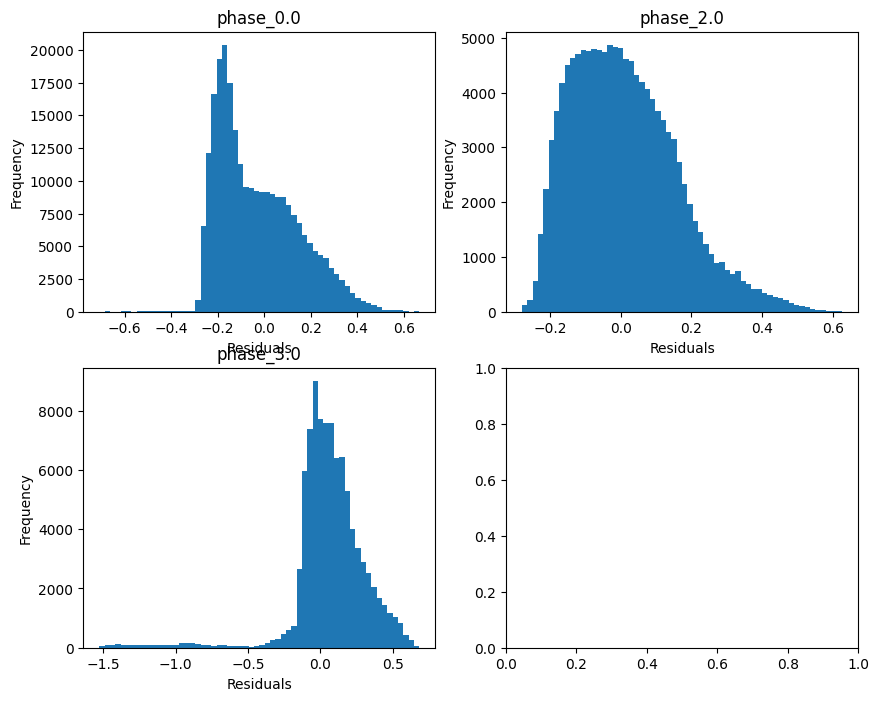

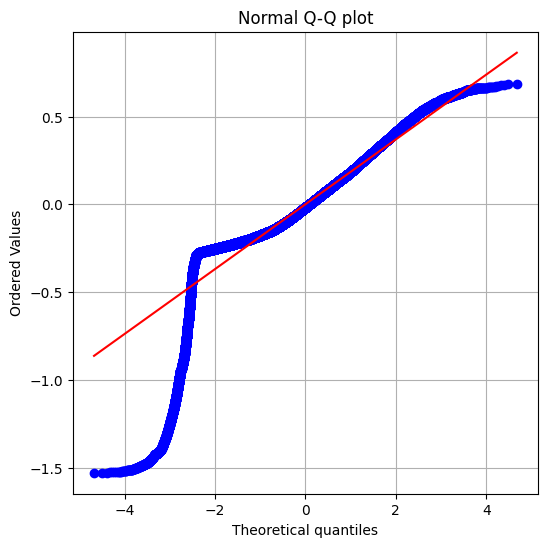

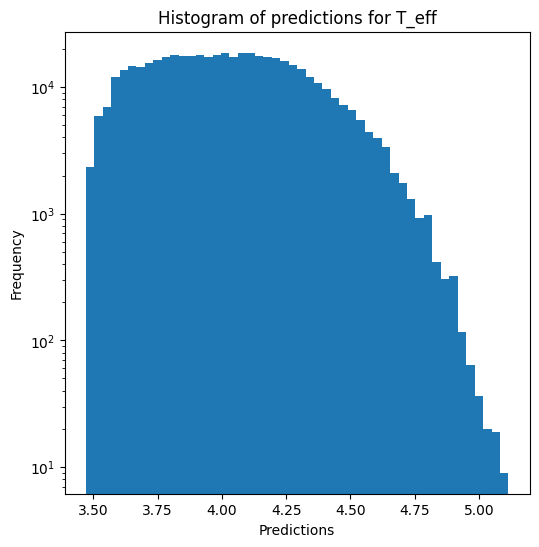

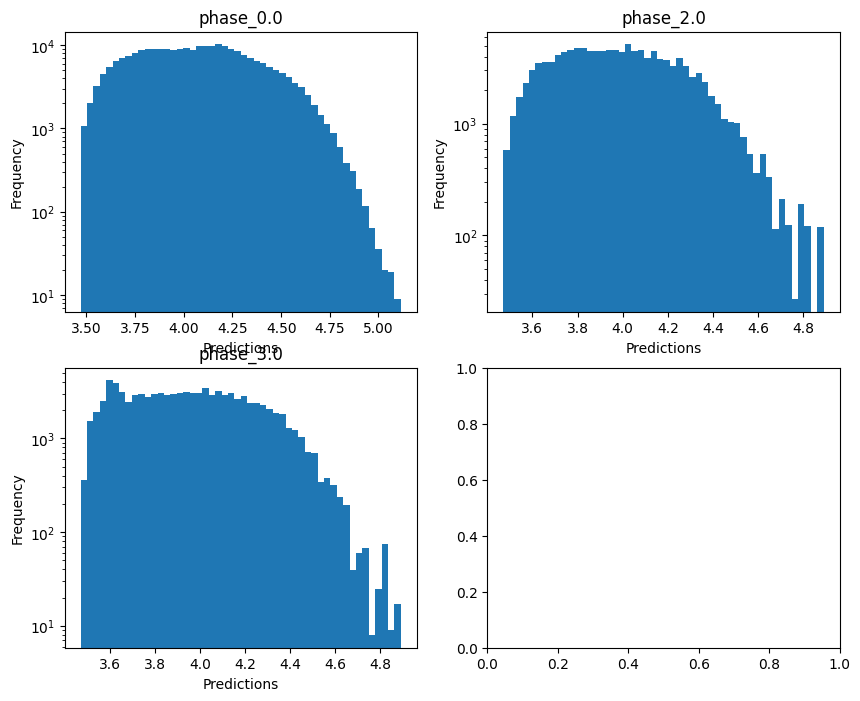

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  -0.03303132903978234
  RMSE :  1.0056497361305454
  MAE :  0.8671813858833899
  MedAE :  0.7952432692452285
  CORR :  0.304124141797948
  MAX_ER :  3.8263448560684514
  Percentiles : 
    75th percentile :  1.1068567465661046
    90th percentile :  1.588082571749576
    95th percentile :  1.840352672518736
    99th percentile :  2.2492300428729686

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.21968522030440796
  RMSE :  1.0603298724345998
  MAE :  0.8013757700136023
  MedAE :  0.5799507681749865
  CORR :  0.4699275422549549
  MAX_ER :  3.4277725288590934
  Percentiles : 
    75th percentile :  1.1954928868162638
    90th percentile :  1.8926459080803768
    95th percentile :  2.261415459185903
    99th percentile :  2.711362969787838

log_g results for the phase cate

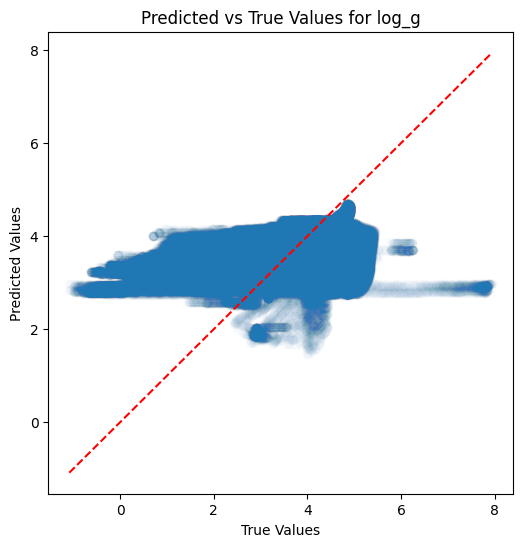

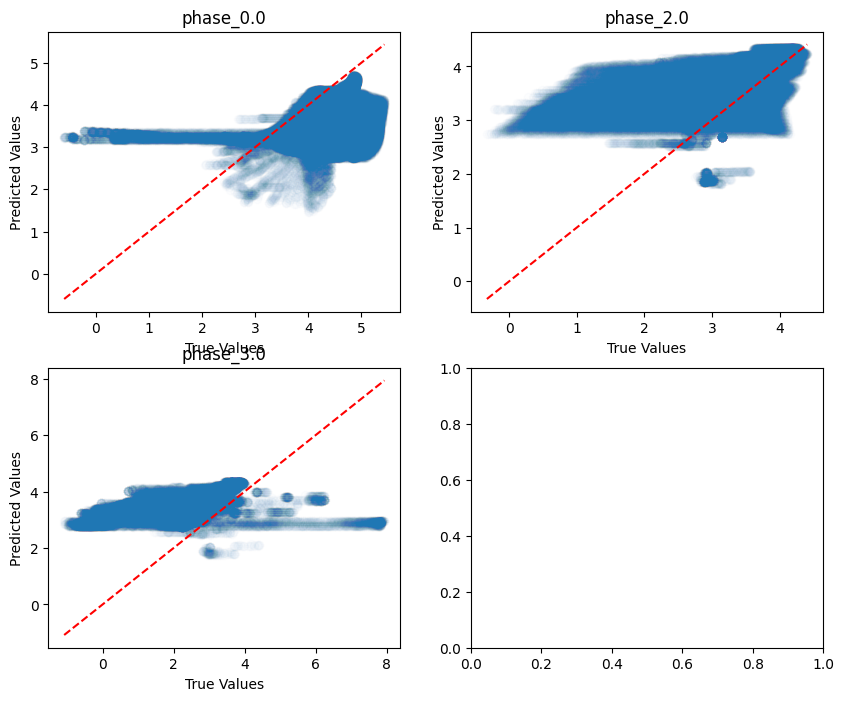

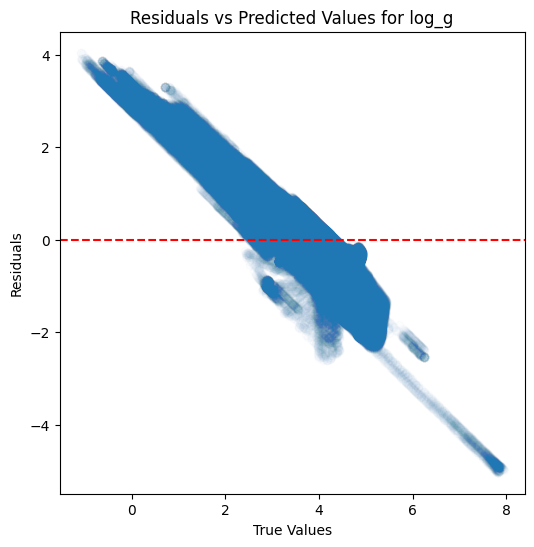

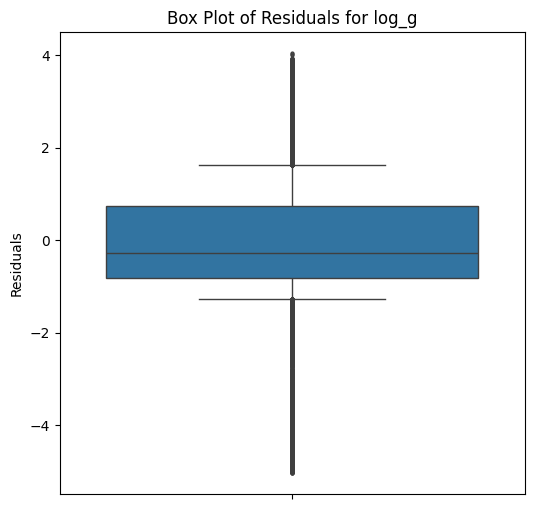

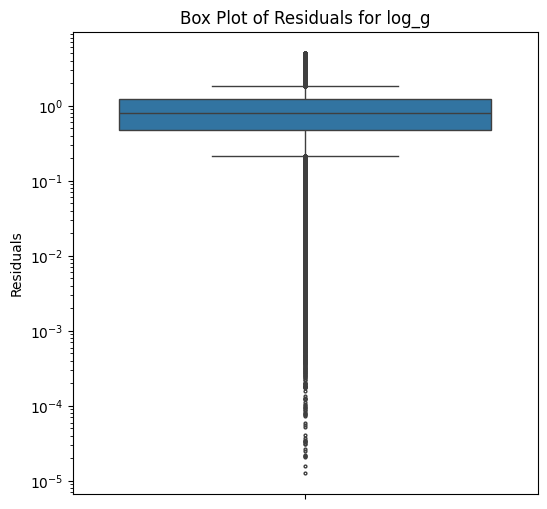

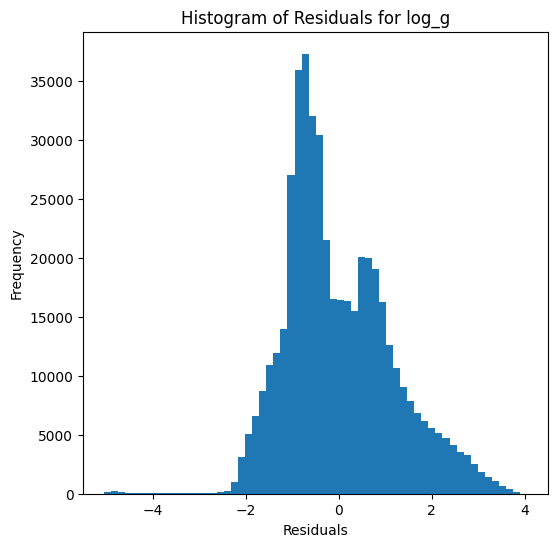

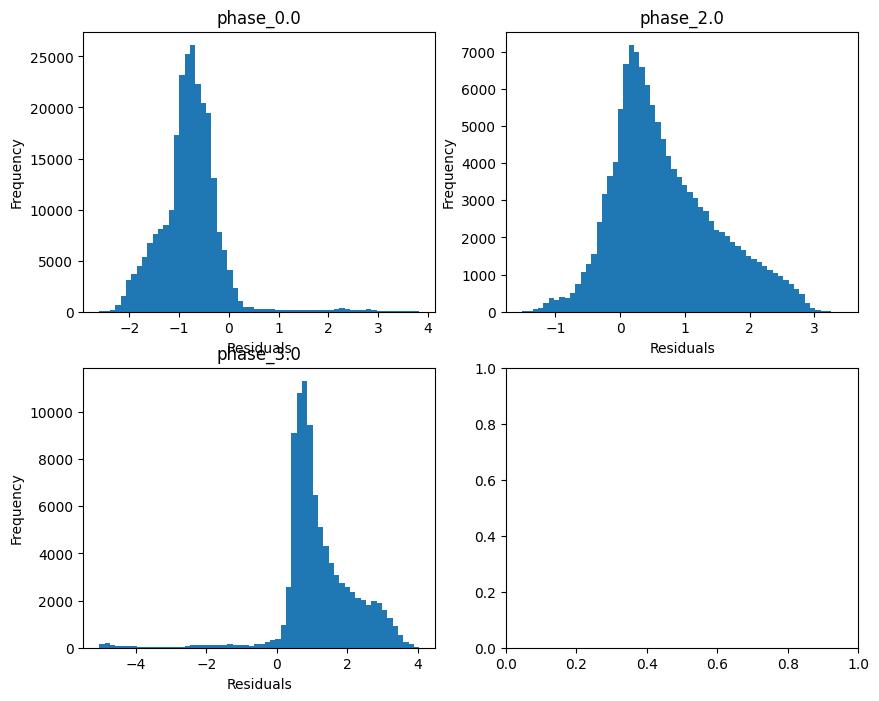

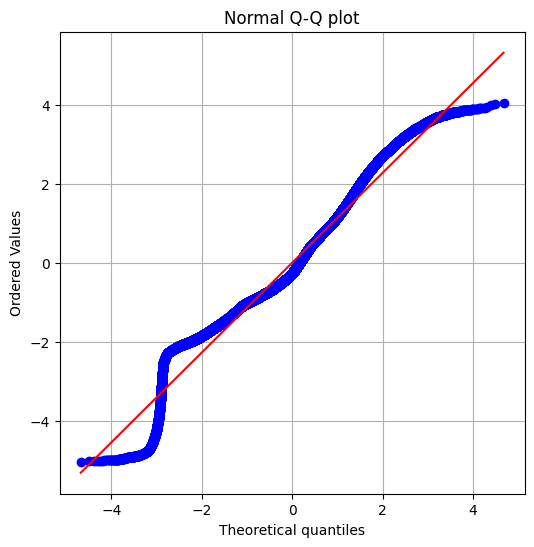

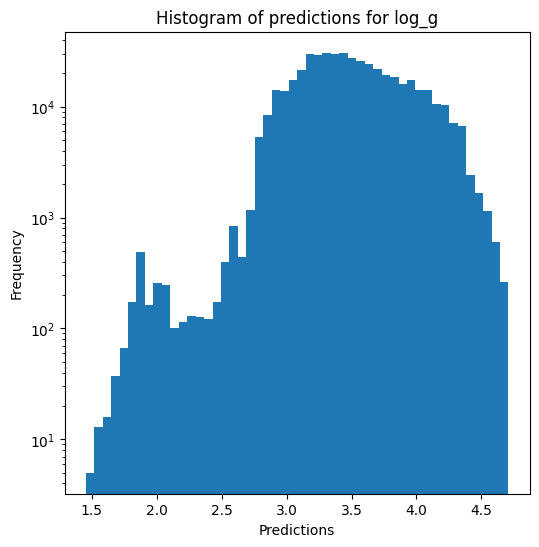

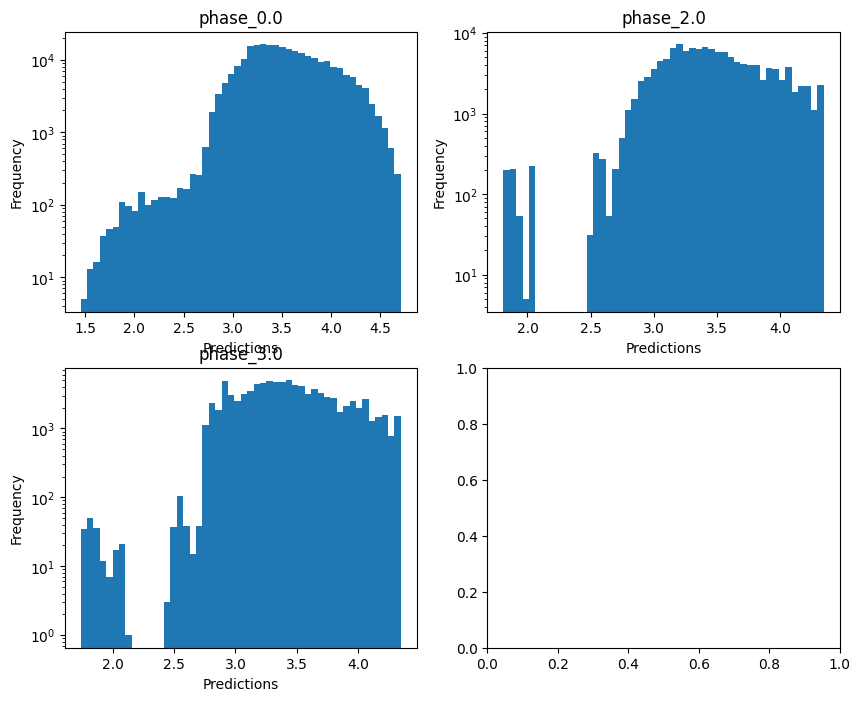

no negative values

radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.45370788156972675
  RMSE :  0.6209251632441066
  MAE :  0.5198622605207524
  MedAE :  0.47448738480037134
  CORR :  0.6797031702158581
  MAX_ER :  2.0307025469063054
  Percentiles : 
    75th percentile :  0.6983767618125618
    90th percentile :  0.999441396745999
    95th percentile :  1.1971256694986319
    99th percentile :  1.478807848153458

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  0.3025126812519813
  RMSE :  0.5890265162842493
  MAE :  0.4677392271383529
  MedAE :  0.3672435439386075
  CORR :  0.5644549444432924
  MAX_ER :  1.8115146092327286
  Percentiles : 
    75th percentile :  0.6770176396878633
    90th percentile :  1.0224948012496031
    95th percentile :  1.2055320421060216
    99th percentile :  1.4267544344544862

radius results for the phase

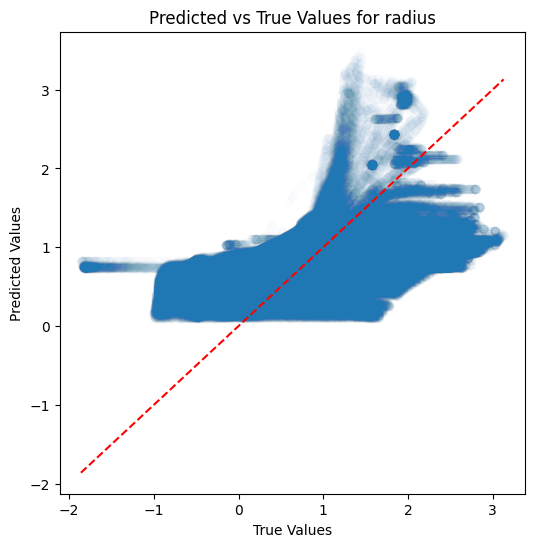

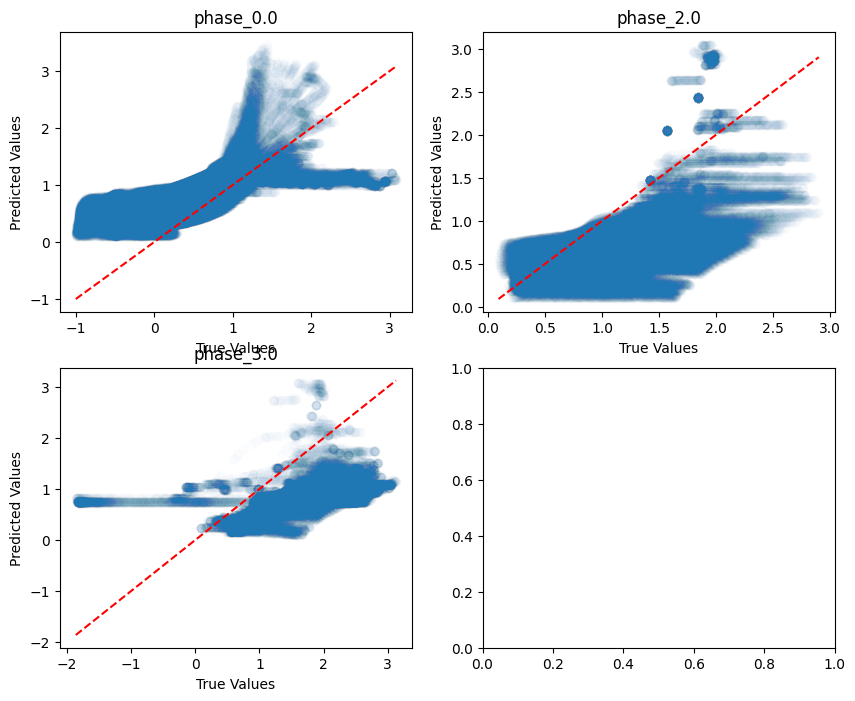

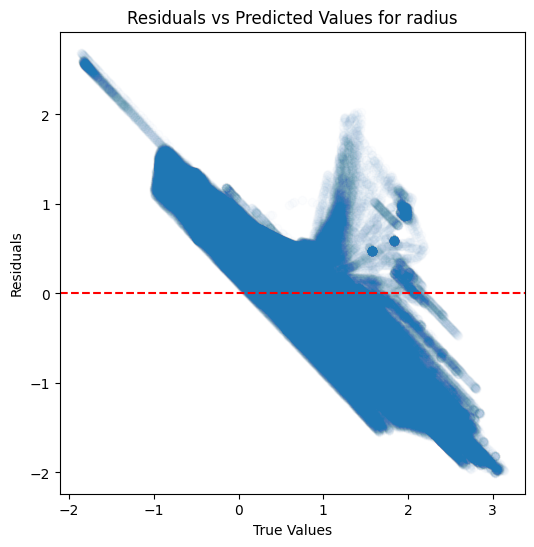

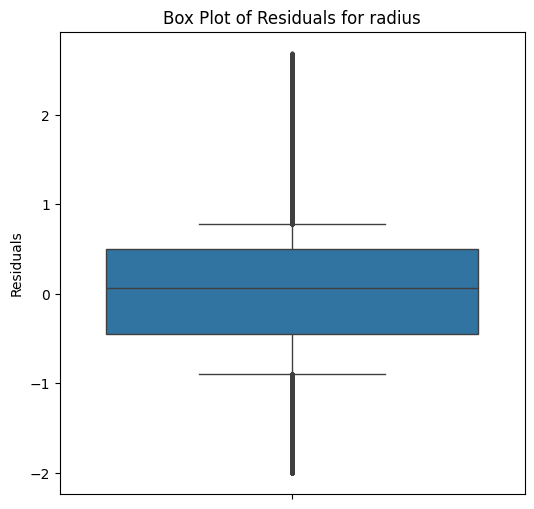

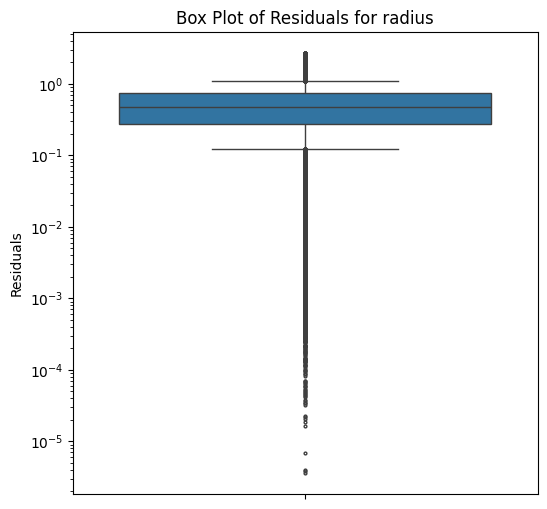

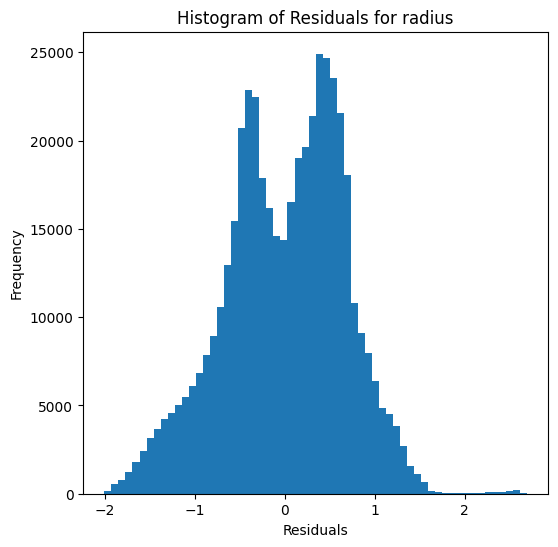

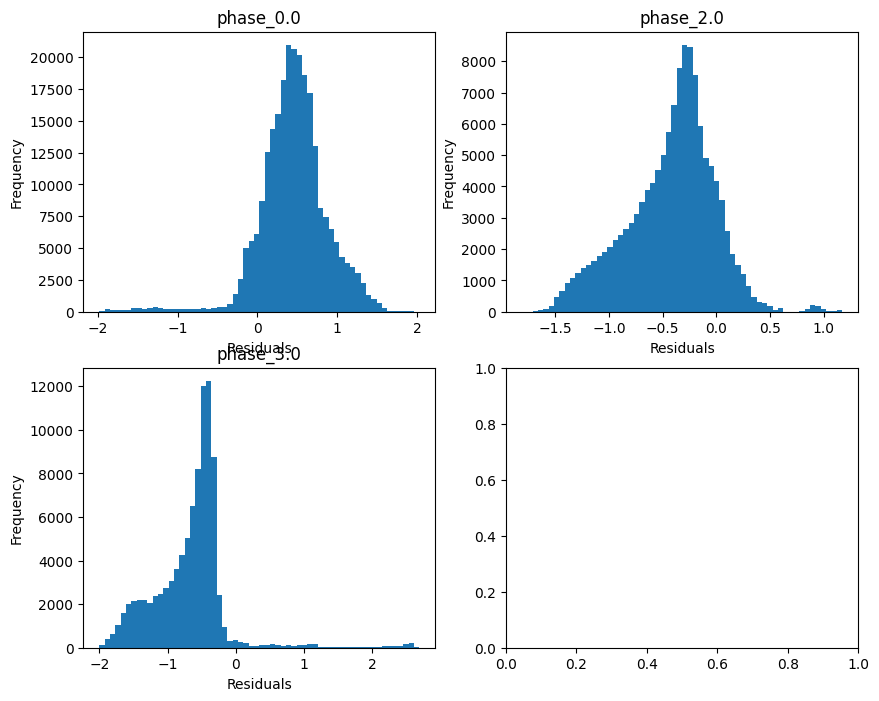

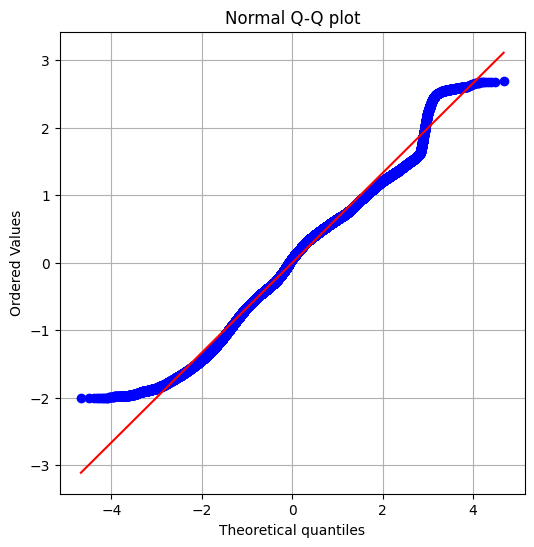

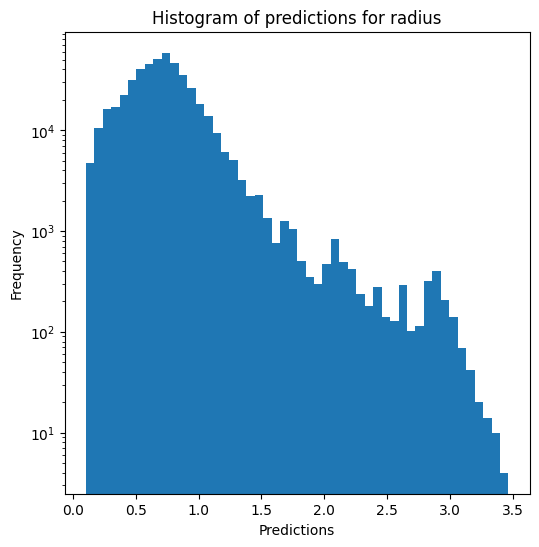

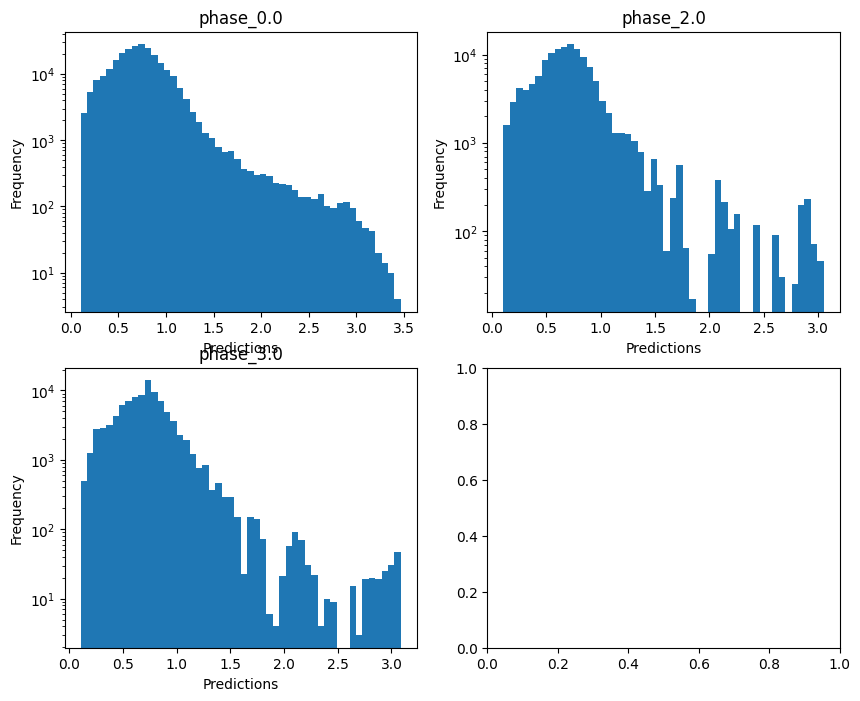

Saving results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=False, use_preds=True, save=True, show=True) # override=True, use_preds=False

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.95882734187579
  RMSE :  0.07154450662059393
  MAE :  0.011911130763566322
  MedAE :  0.001152284963012562
  CORR :  0.9796405169227893
  MAX_ER :  1.3761571902520062
  Percentiles : 
    75th percentile :  0.0025775926878059963
    90th percentile :  0.004801231647629578
    95th percentile :  0.012151285928124533
    99th percentile :  0.41392880308731683

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.9595123283132682
  RMSE :  0.06363212733013571
  MAE :  0.023845066222506036
  MedAE :  0.003232600426533727
  CORR :  0.9796943198651976
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.007960269100862671
    90th percentile :  0.08236961866054981
    95th percentile :  0.1379613391158765
    

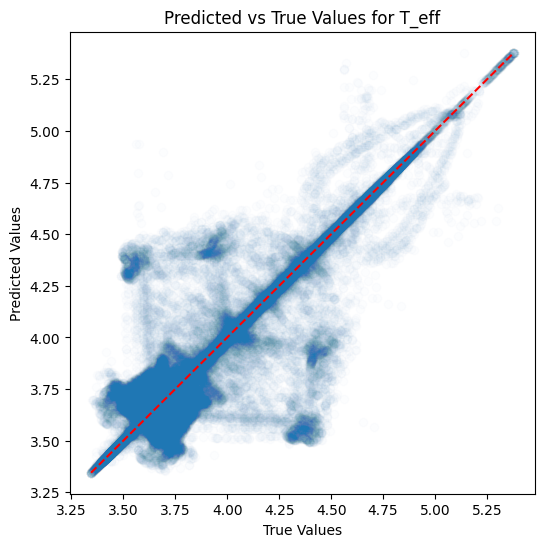

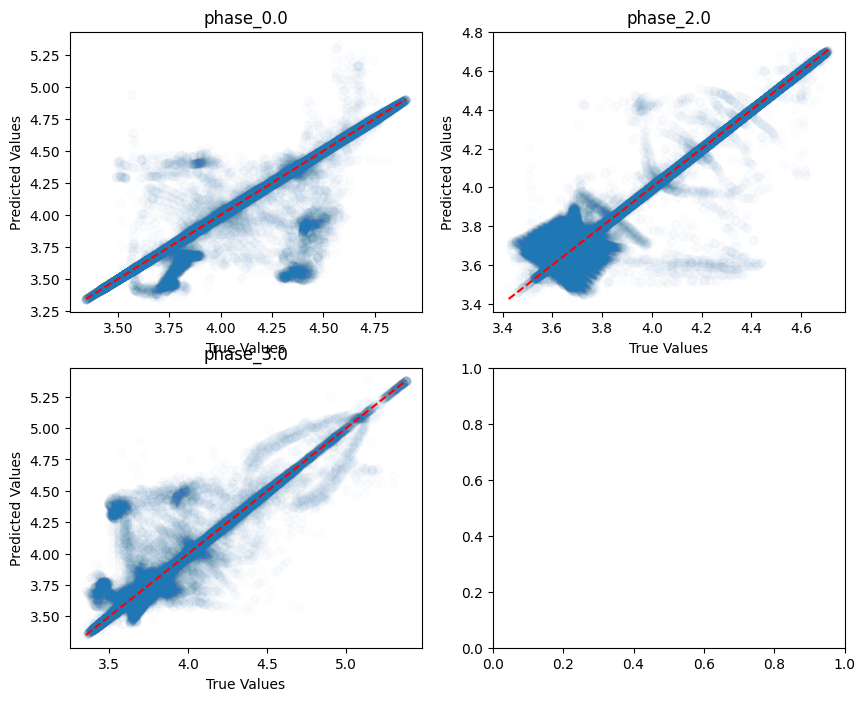

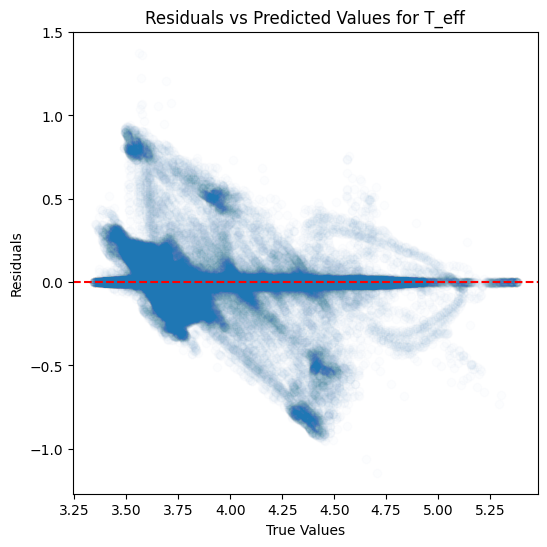

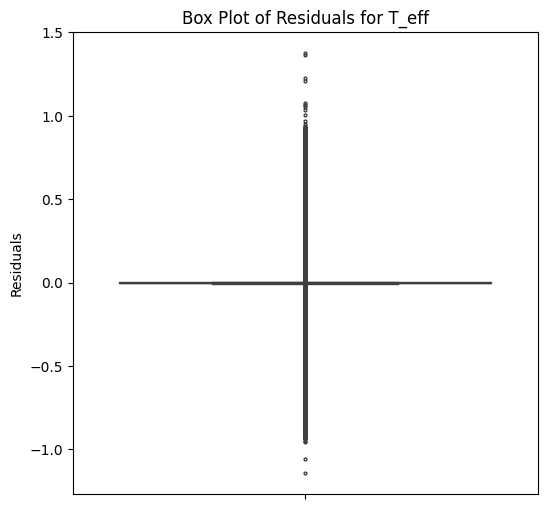

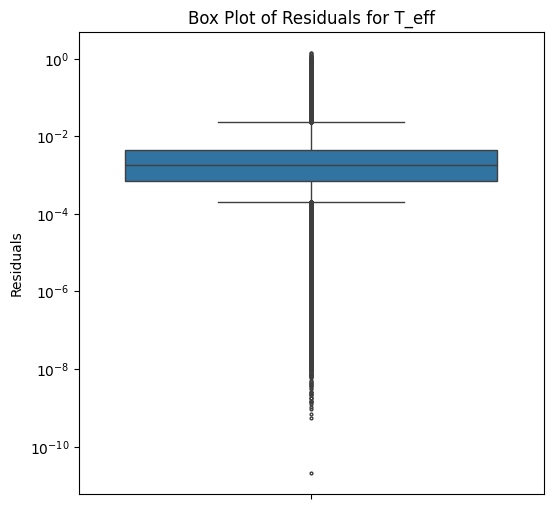

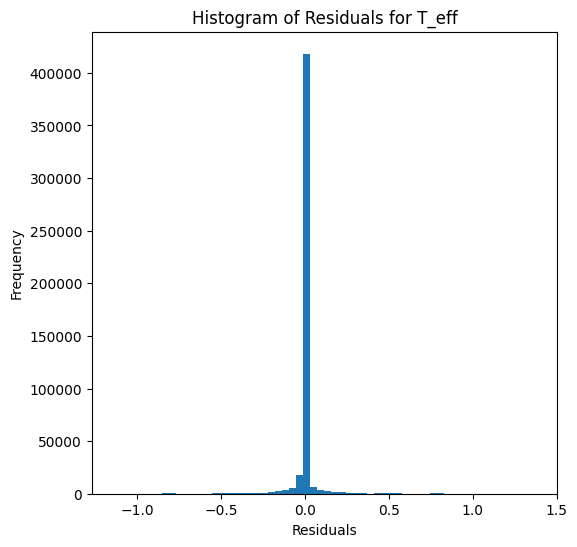

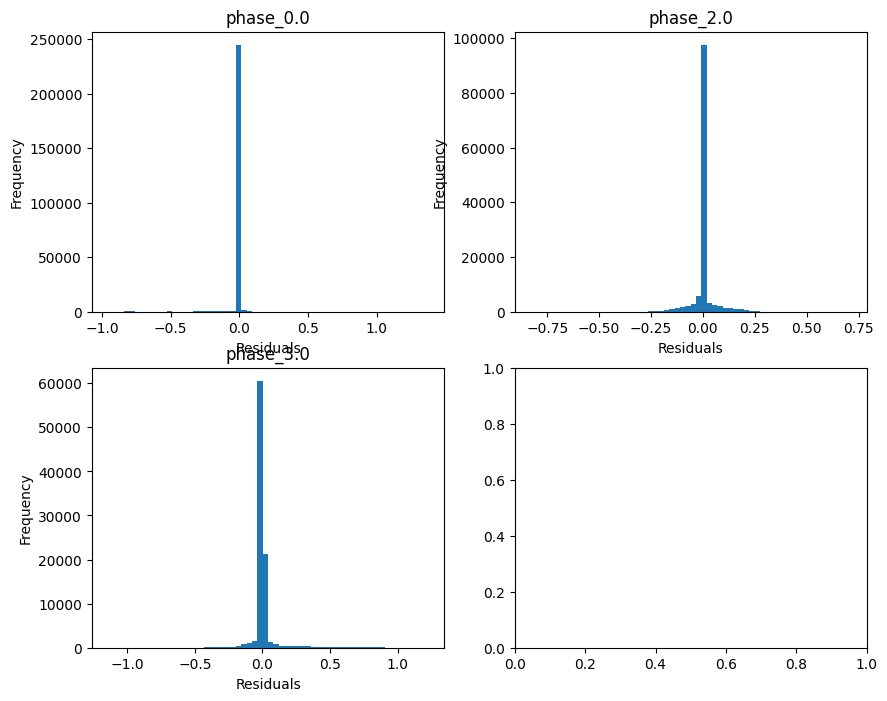

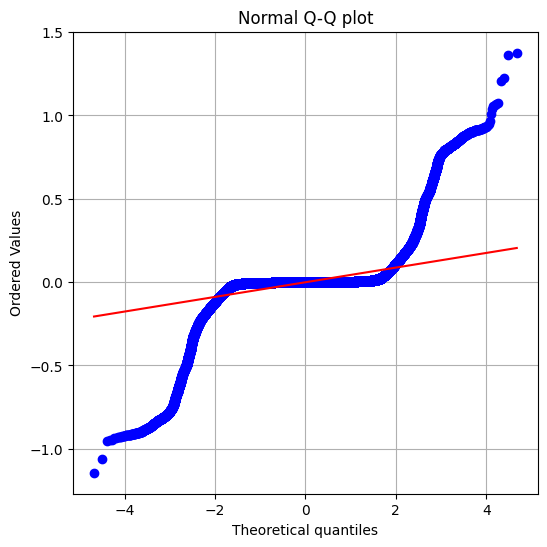

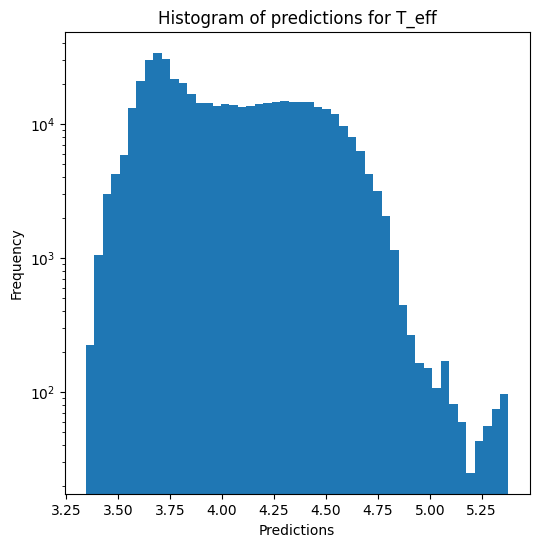

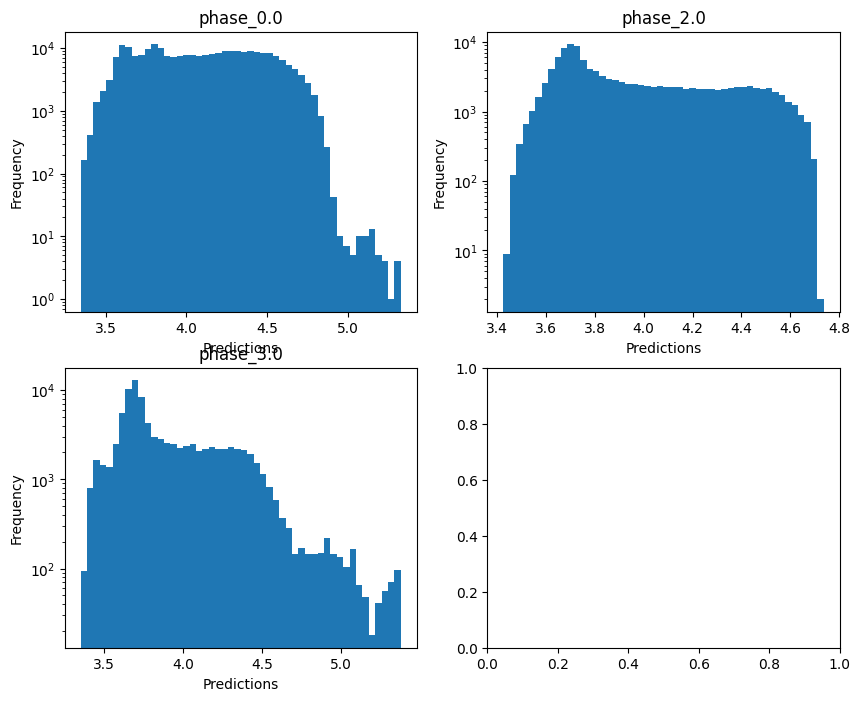


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44715928604621435
  RMSE :  0.4693996122583245
  MAE :  0.07592020709173936
  MedAE :  0.00412827557116735
  CORR :  0.8044628669941736
  MAX_ER :  5.67228327121337
  Percentiles : 
    75th percentile :  0.008246612993970004
    90th percentile :  0.017292929301687136
    95th percentile :  0.03793131262282163
    99th percentile :  3.137048254037745

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.11039396085287934
  RMSE :  0.8593275043984311
  MAE :  0.3516189315731098
  MedAE :  0.015935126452048864
  CORR :  0.552911978653854
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.0460557062749265
    90th percentile :  1.5032219684020025
    95th percentile :  2.3323223141844025
    99th percentile :  3.455106926607777

log_g results for the phase category with a 

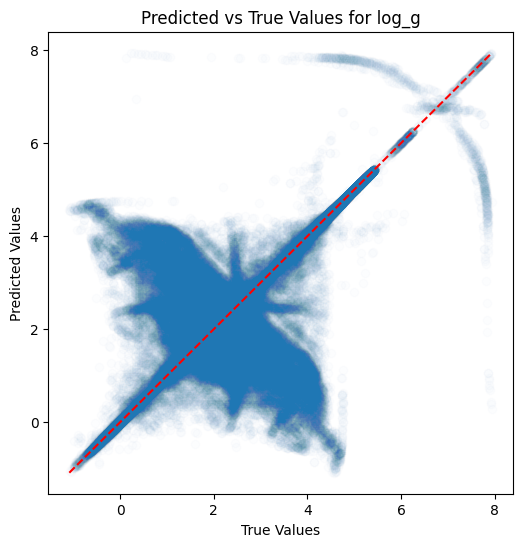

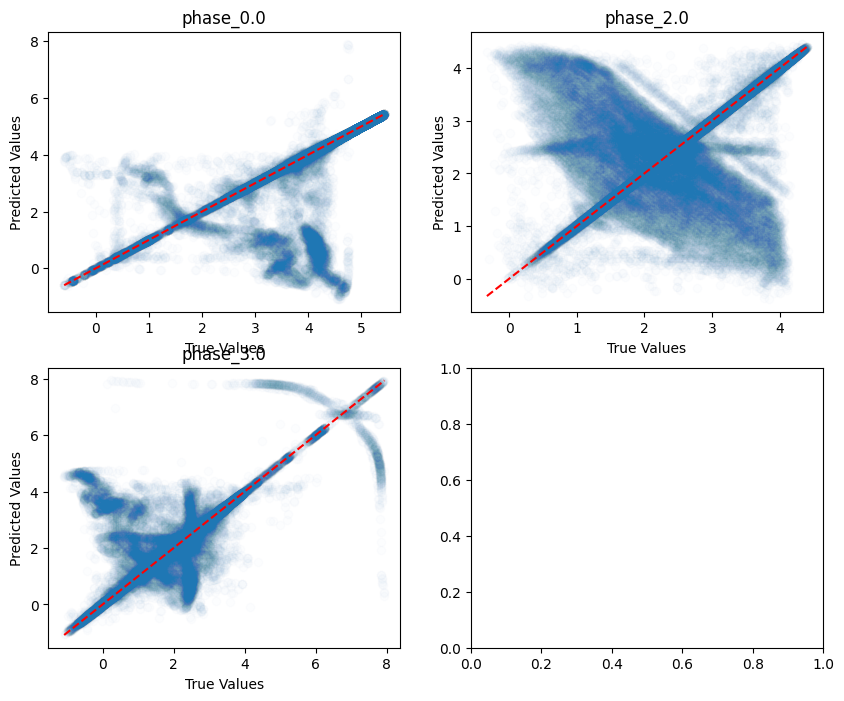

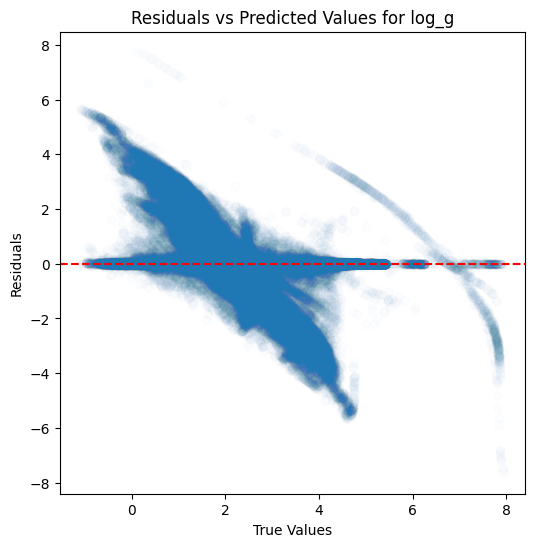

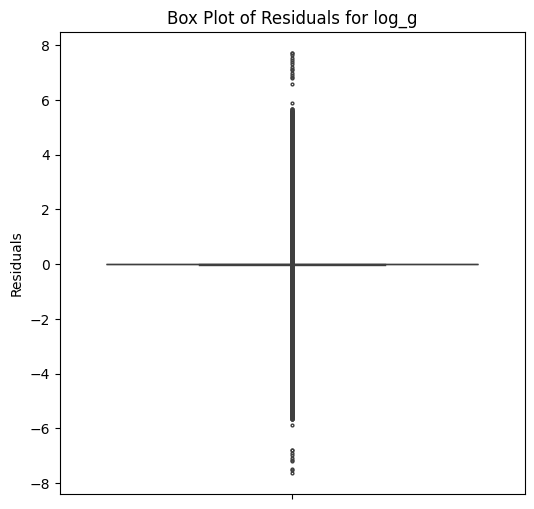

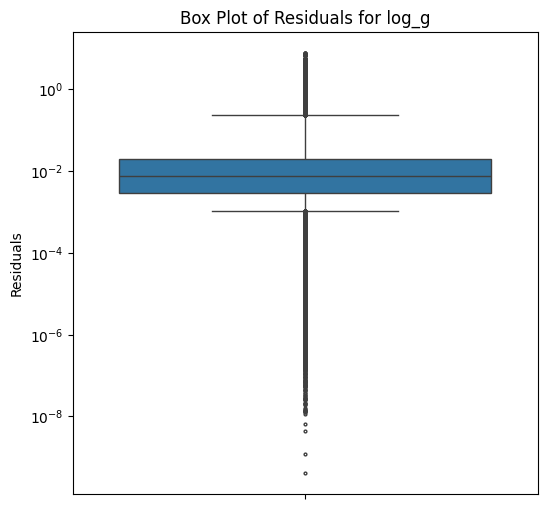

...

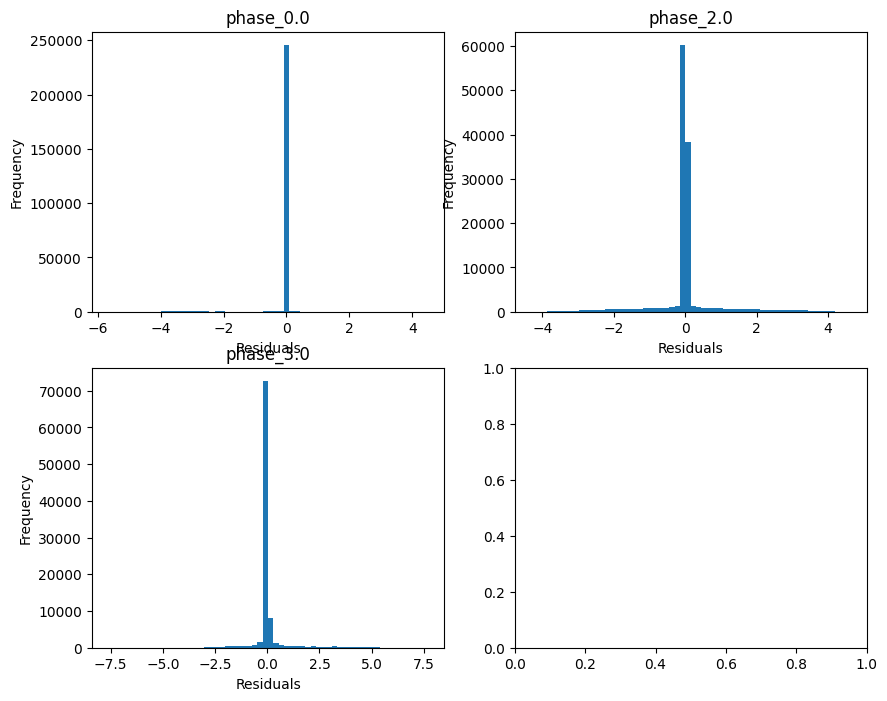

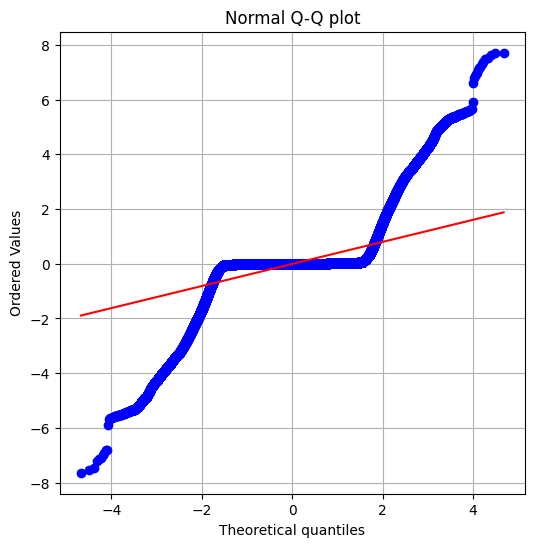

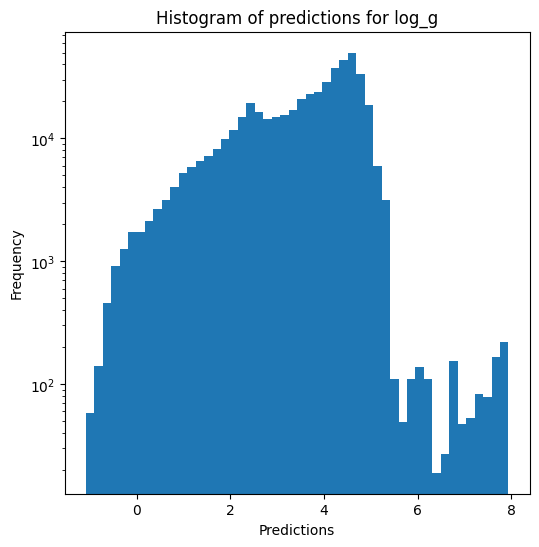

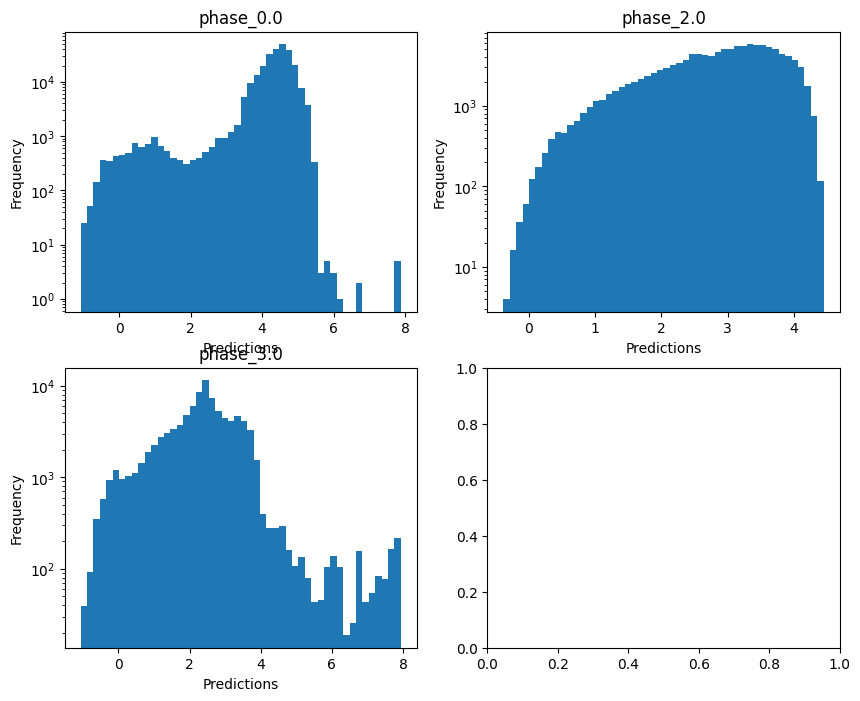

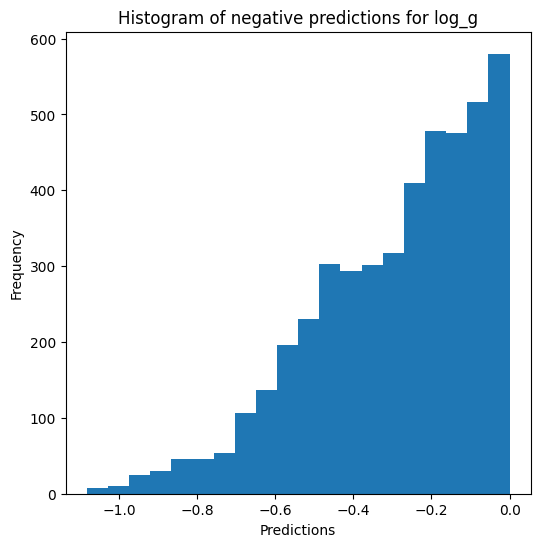


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8326140175693536
  RMSE :  0.23496331159217523
  MAE :  0.038934857764526876
  MedAE :  0.0028641686373791983
  CORR :  0.9253306204285233
  MAX_ER :  2.8364541782366466
  Percentiles : 
    75th percentile :  0.005425425664564942
    90th percentile :  0.01108448252018959
    95th percentile :  0.021852741326711642
    99th percentile :  1.570598205924036

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  0.2355044299204686
  RMSE :  0.42965401474157994
  MAE :  0.17581692296133403
  MedAE :  0.007983207810041637
  CORR :  0.6254612524082497
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.023075453291484582
    90th percentile :  0.7516206012269244
    95th percentile :  1.1660906784657301
    99th percentile :  1.7275170298151952

radius results for the phase ca

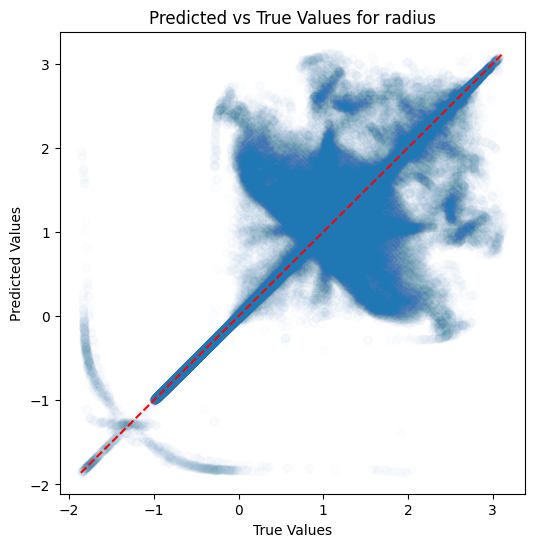

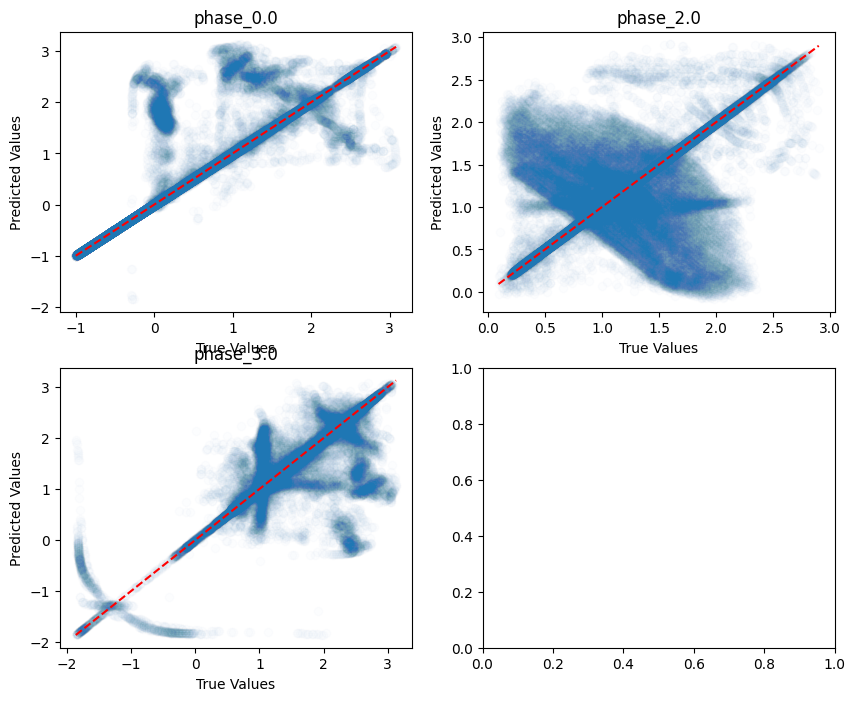

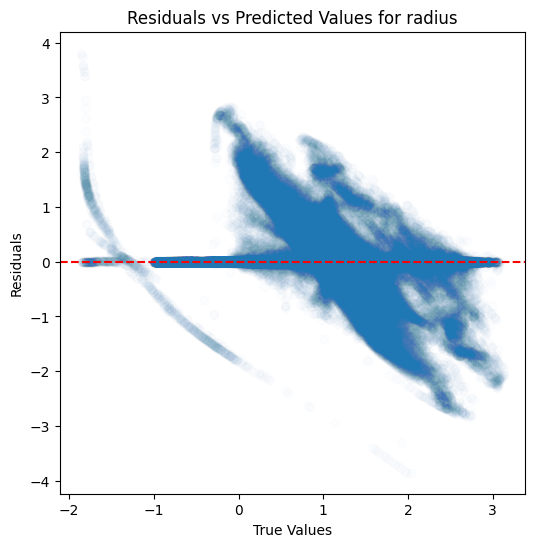

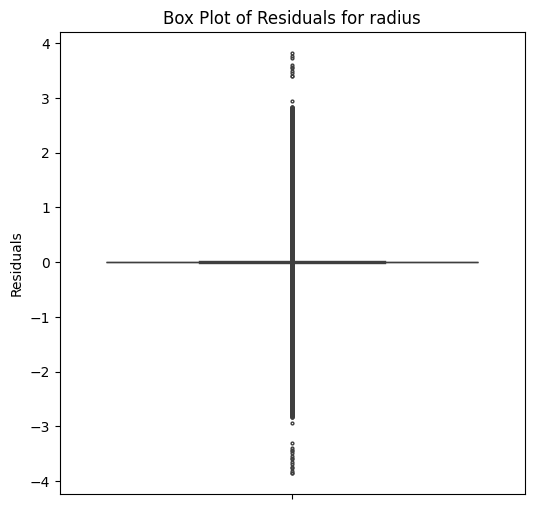

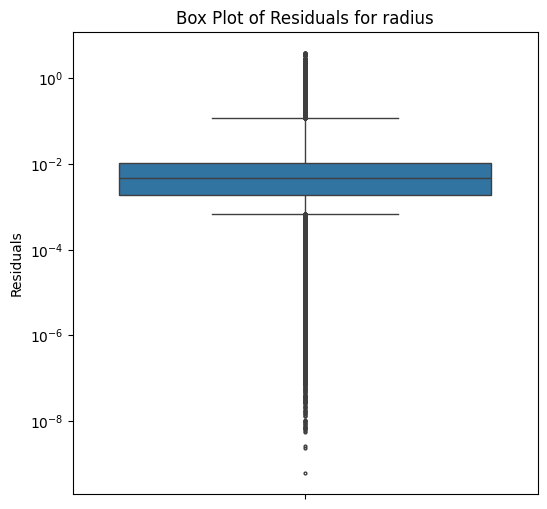

...

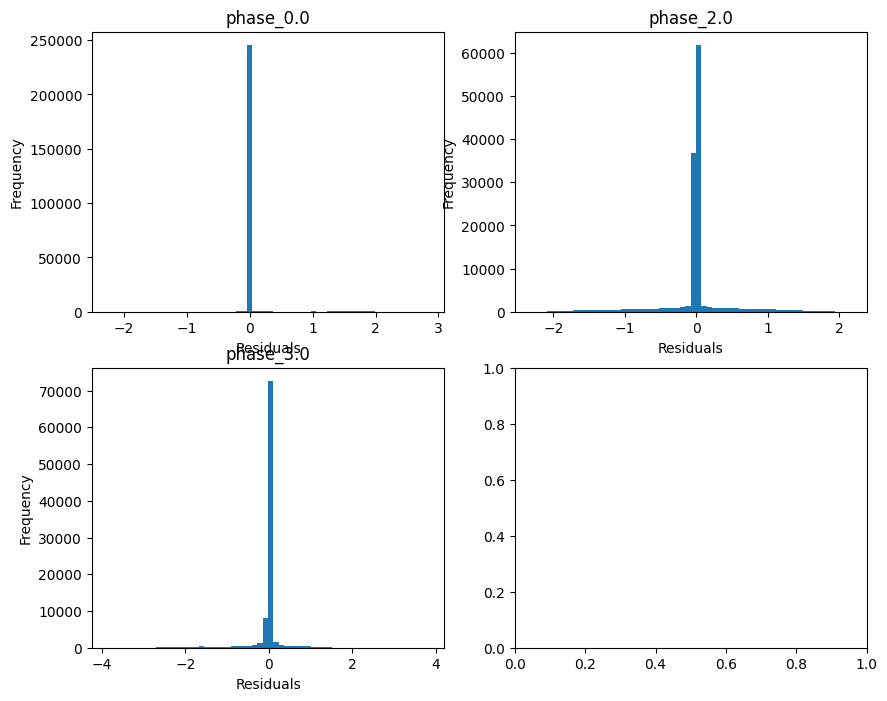

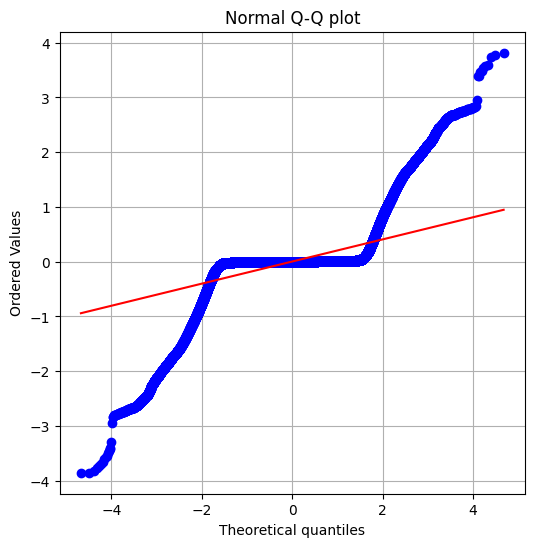

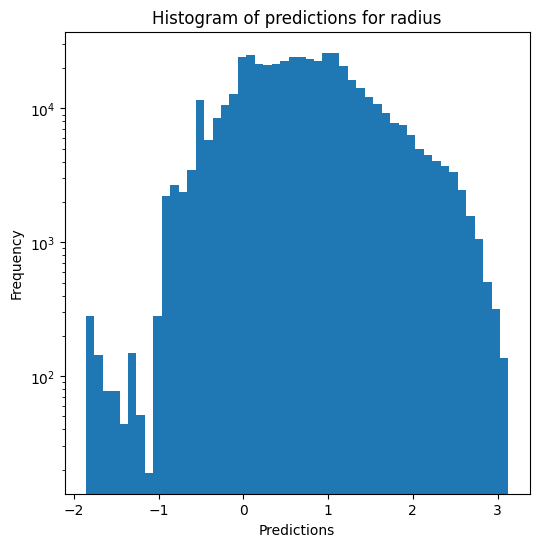

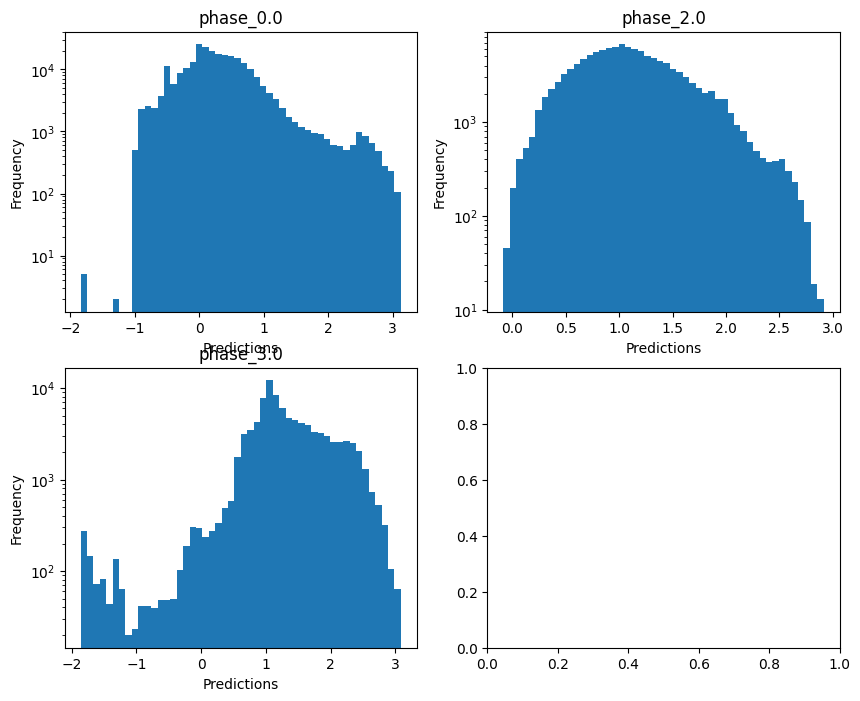

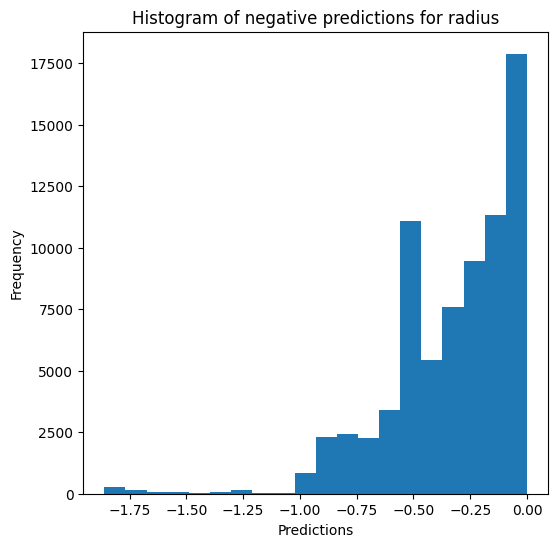

Saving results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=False, use_preds=True, save=True, show=True)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9681617859419454
  RMSE :  0.06343943725781091
  MAE :  0.015819802112846948
  MedAE :  0.0011789636853221097
  CORR :  0.9839538591566894
  MAX_ER :  1.624647125587007
  Percentiles : 
    75th percentile :  0.003242947720233591
    90th percentile :  0.01900201545339525
    95th percentile :  0.09284581052960446
    99th percentile :  0.32868976388279775

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.9833978853774827
  RMSE :  0.04075251235061398
  MAE :  0.01693985955039697
  MedAE :  0.0021625728903718056
  CORR :  0.9916682807724251
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.010919500896748757
    90th percentile :  0.057715945488897136
    95th percentile :  0.09177737344773473
   

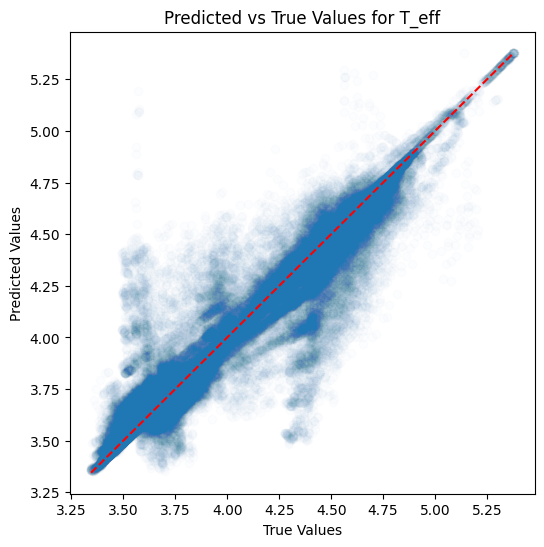

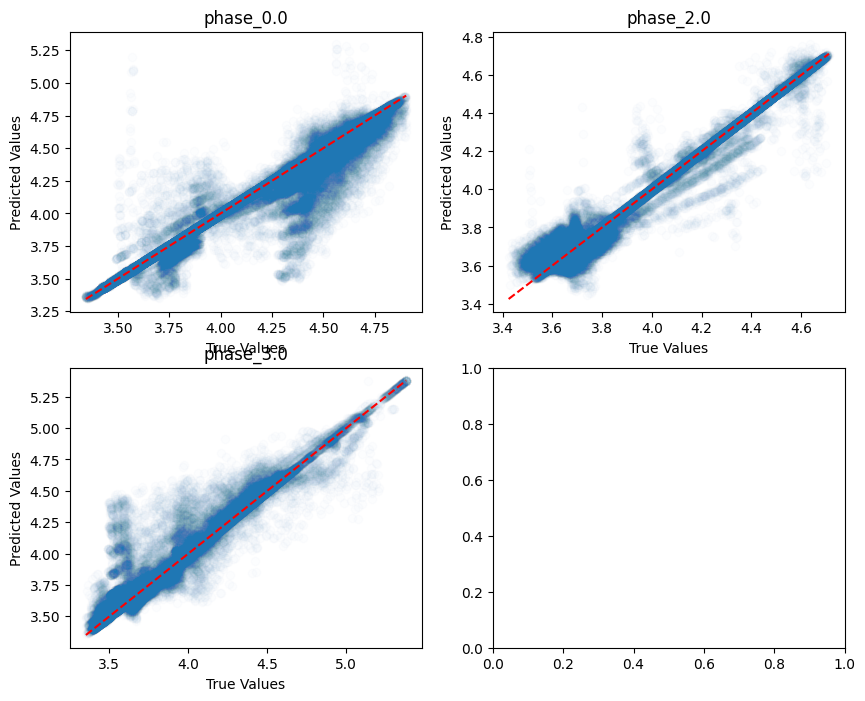

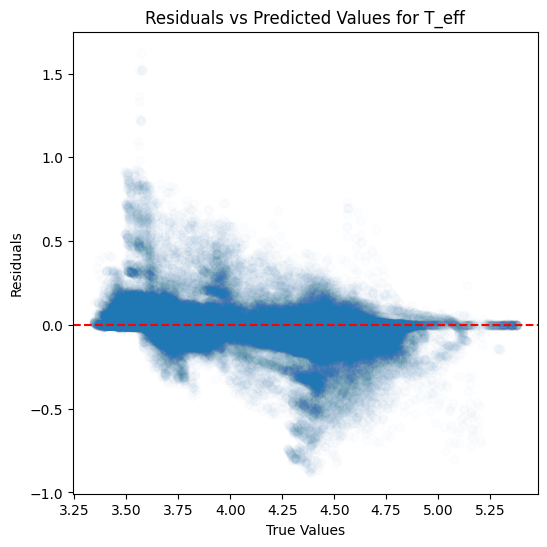

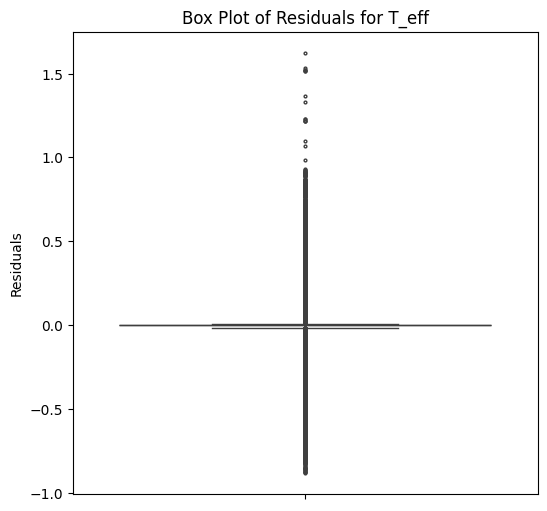

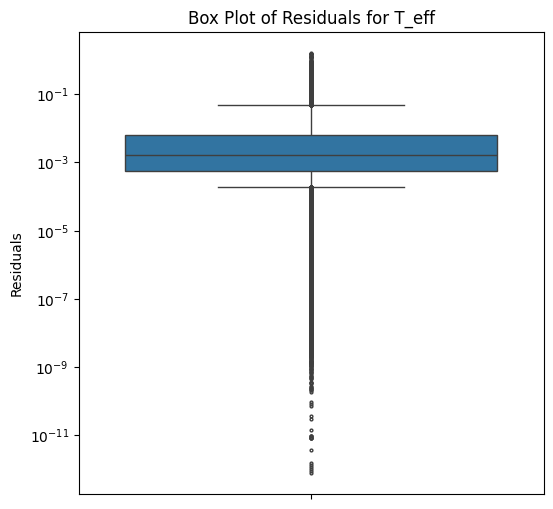

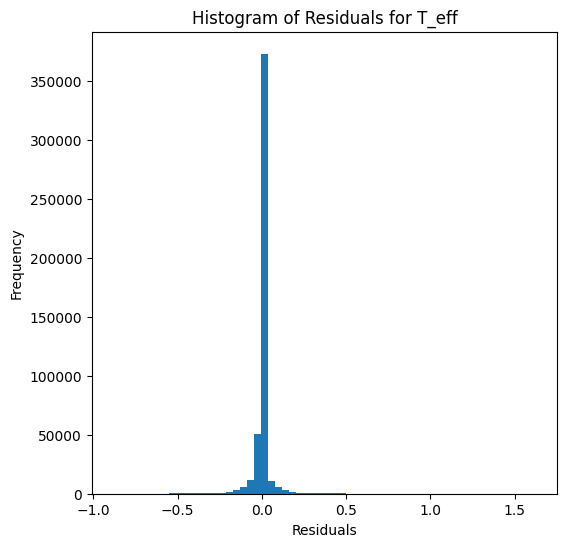

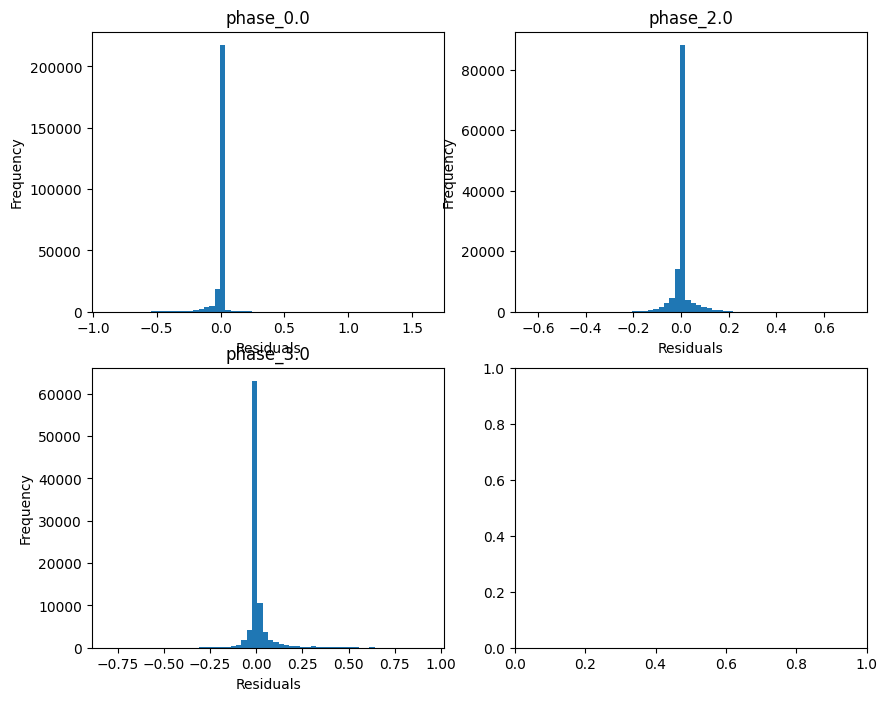

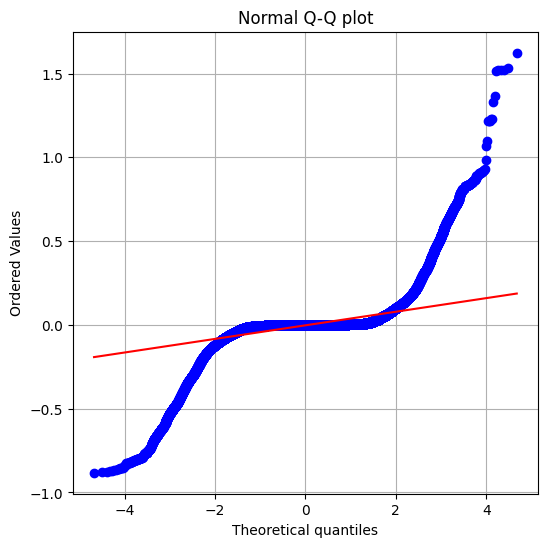

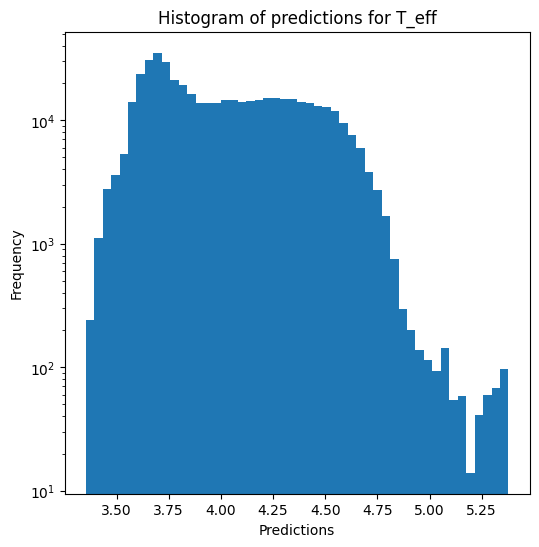

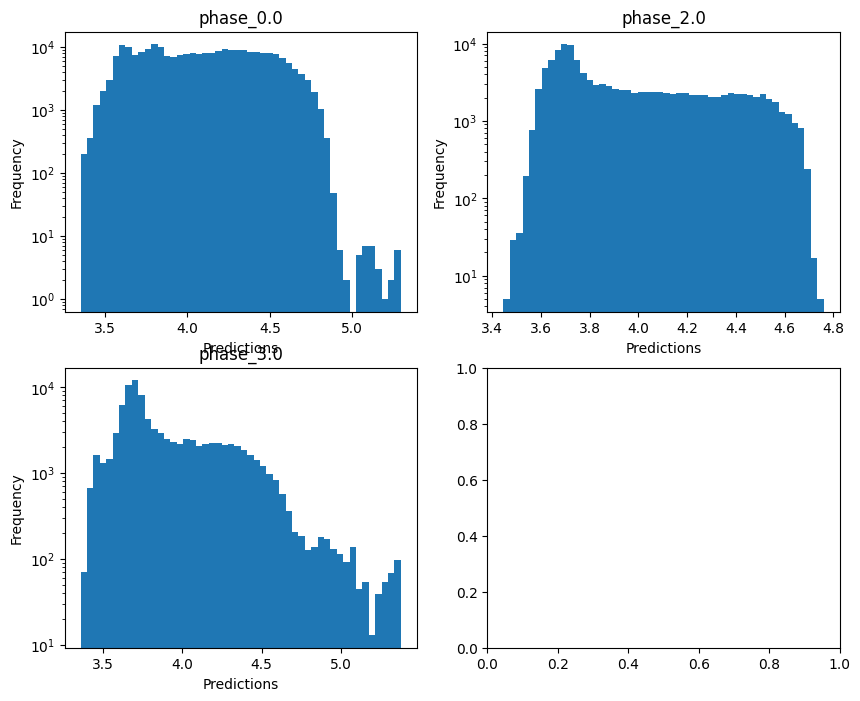


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6568179138001569
  RMSE :  0.37370106863309405
  MAE :  0.09028261765292125
  MedAE :  0.003243357588580409
  CORR :  0.8679748684308025
  MAX_ER :  5.583269325589191
  Percentiles : 
    75th percentile :  0.010187069372771695
    90th percentile :  0.0921542499649695
    95th percentile :  0.5472864994025252
    99th percentile :  1.951967919093348

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.59032663519061
  RMSE :  0.5834035553928728
  MAE :  0.25012628168974615
  MedAE :  0.010467086427924377
  CORR :  0.7728344159181657
  MAX_ER :  4.37610824074192
  Percentiles : 
    75th percentile :  0.15521051531926688
    90th percentile :  0.989498269013916
    95th percentile :  1.4750445558481888
    99th percentile :  2.3350217580014005

log_g results for the phase category with a va

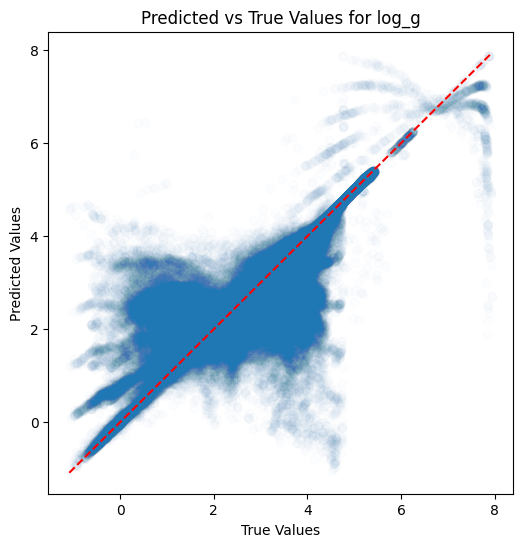

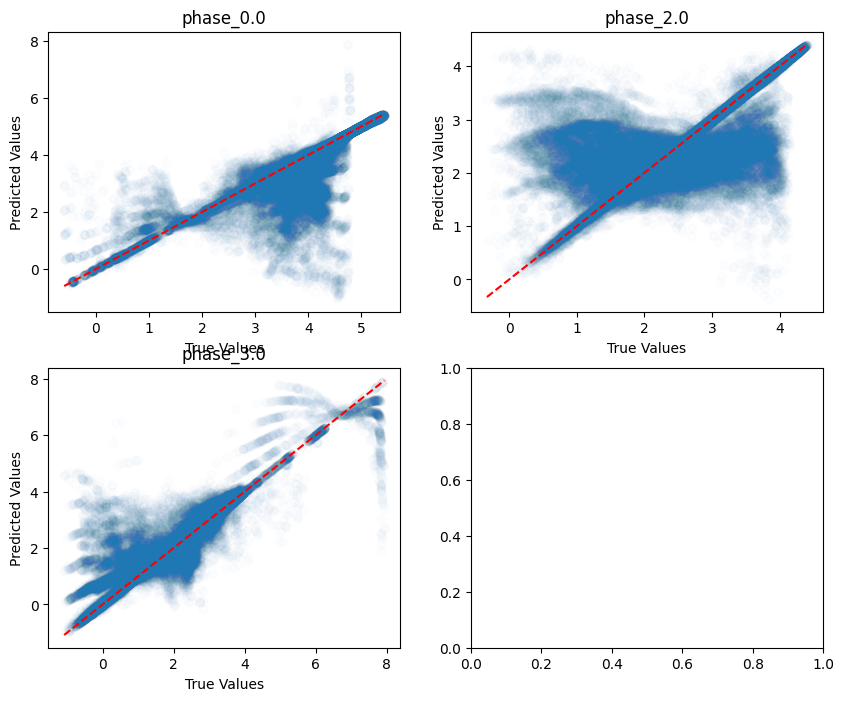

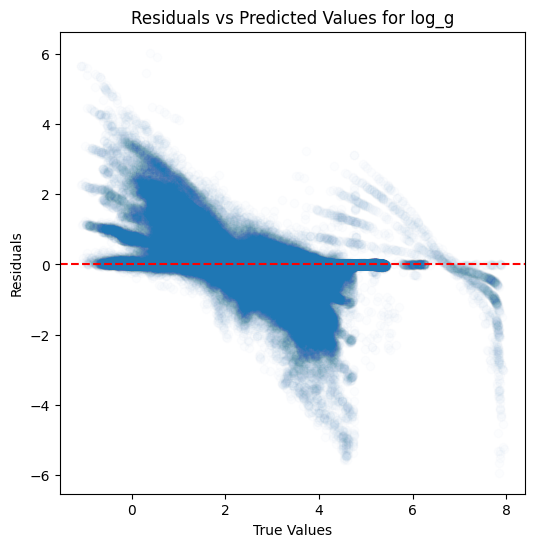

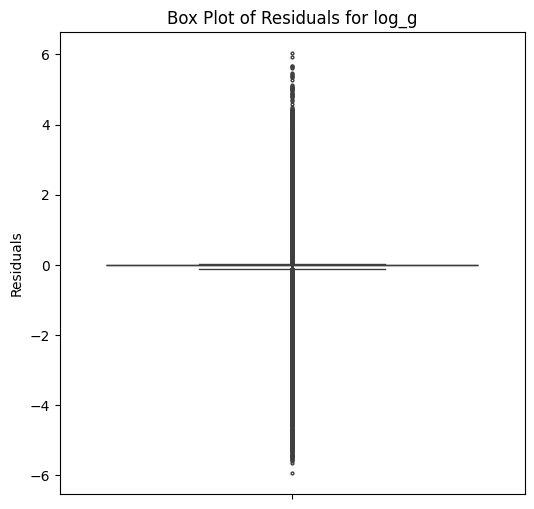

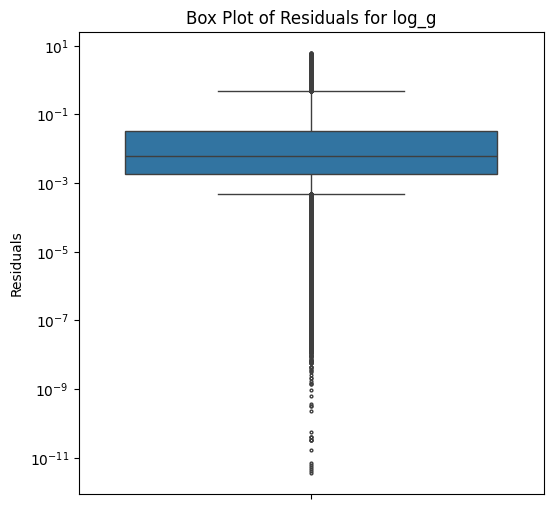

...

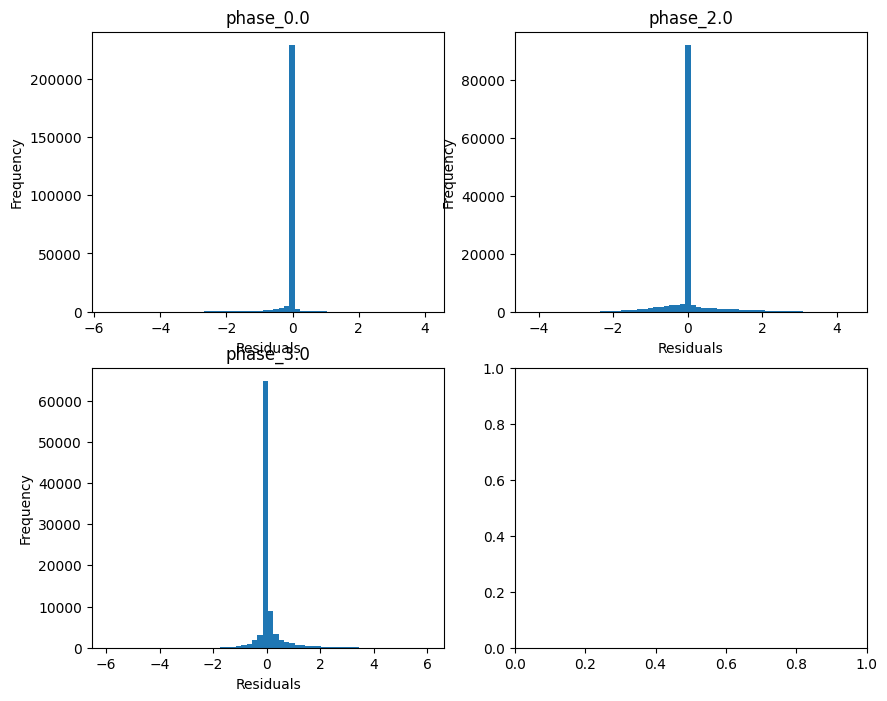

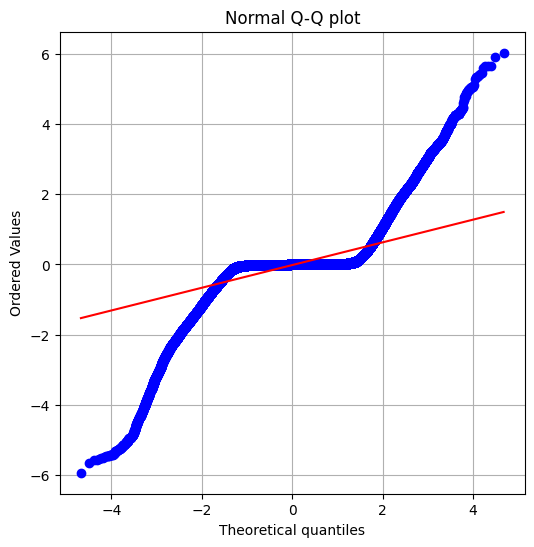

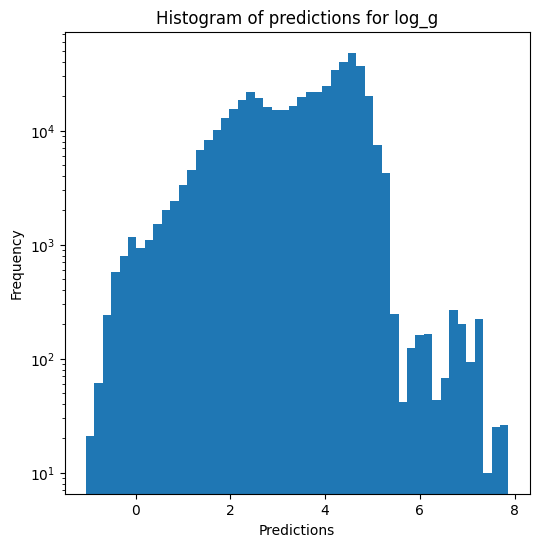

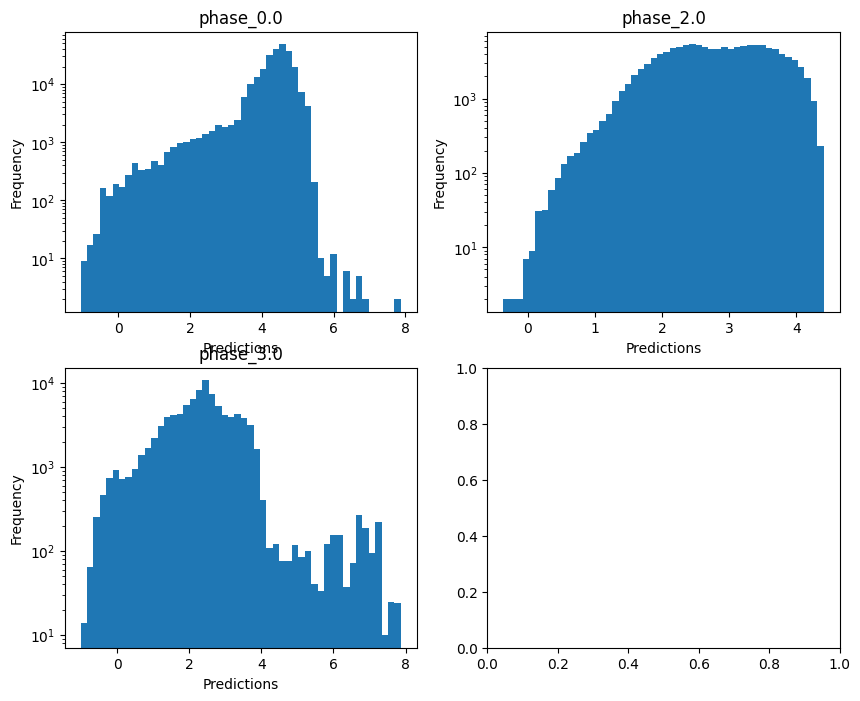

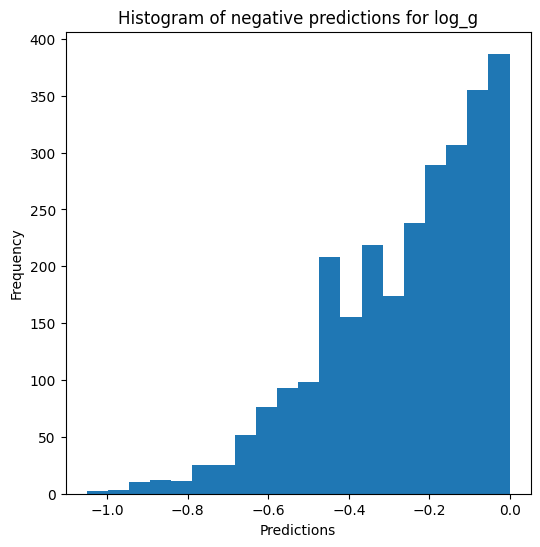


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8960133178682989
  RMSE :  0.1871222150498372
  MAE :  0.04629519400315357
  MedAE :  0.0023791585655135727
  CORR :  0.9540027850597587
  MAX_ER :  2.7916267800929333
  Percentiles : 
    75th percentile :  0.0072797866690531565
    90th percentile :  0.049889175559364105
    95th percentile :  0.27373249757158336
    99th percentile :  0.9763997199482441

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  0.6479384395105787
  RMSE :  0.2916963300367795
  MAE :  0.1250674302060092
  MedAE :  0.005242278562254565
  CORR :  0.8102584707253462
  MAX_ER :  2.18811024771765
  Percentiles : 
    75th percentile :  0.07761834108851495
    90th percentile :  0.4947432502234993
    95th percentile :  0.7375634883466927
    99th percentile :  1.167477976924124

radius results for the phase category

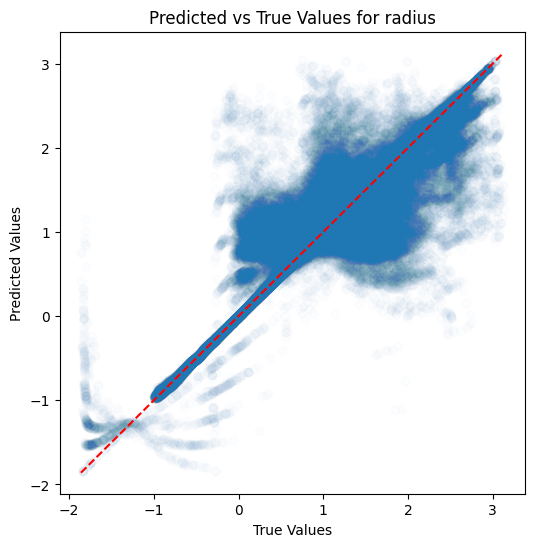

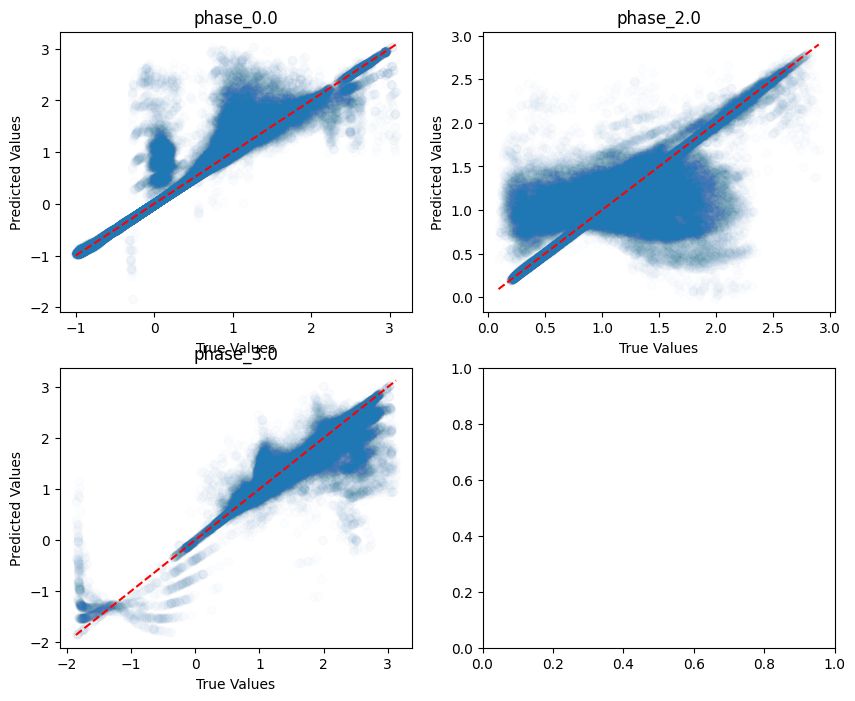

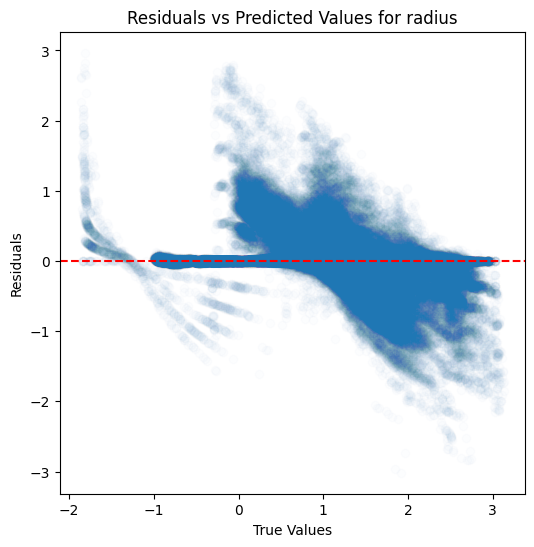

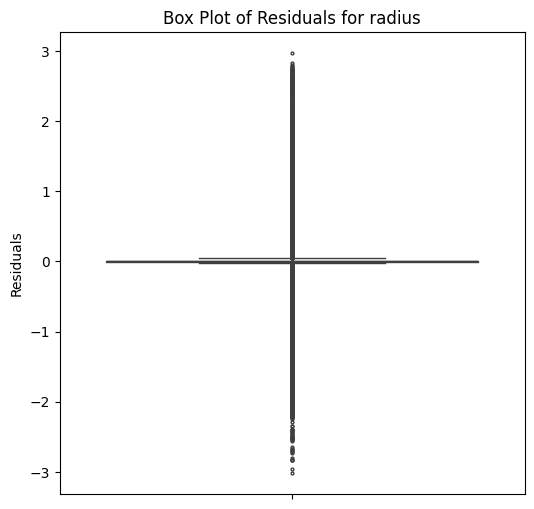

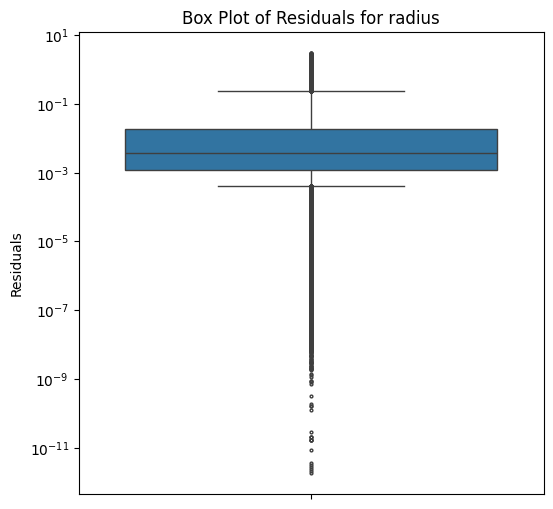

...

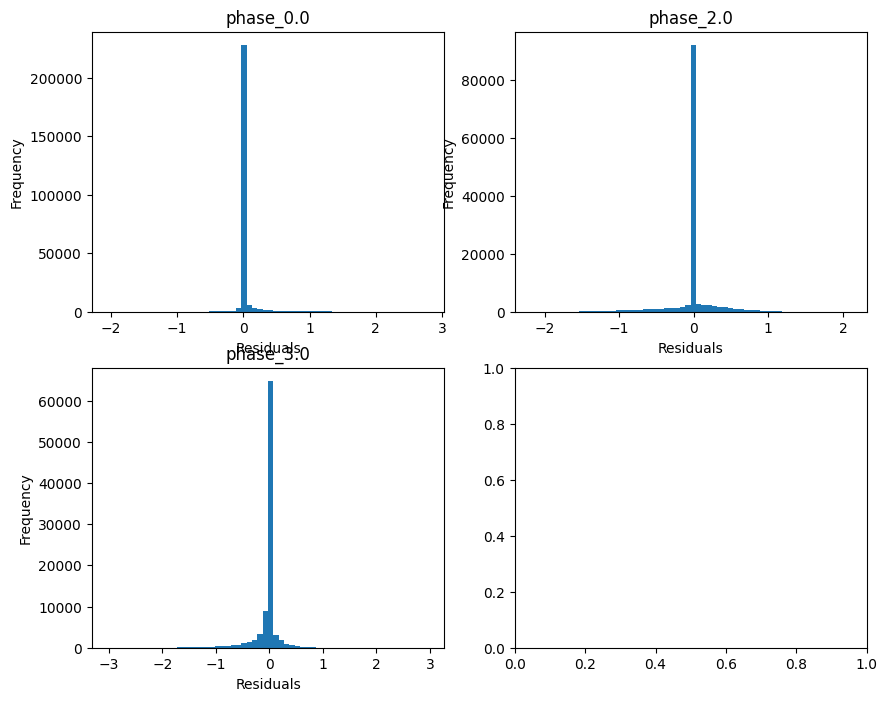

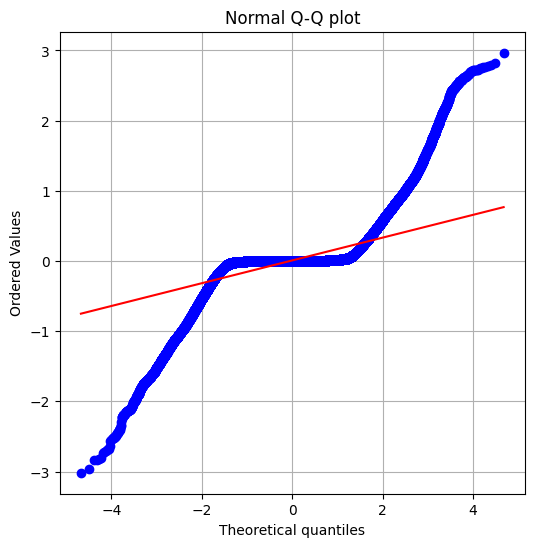

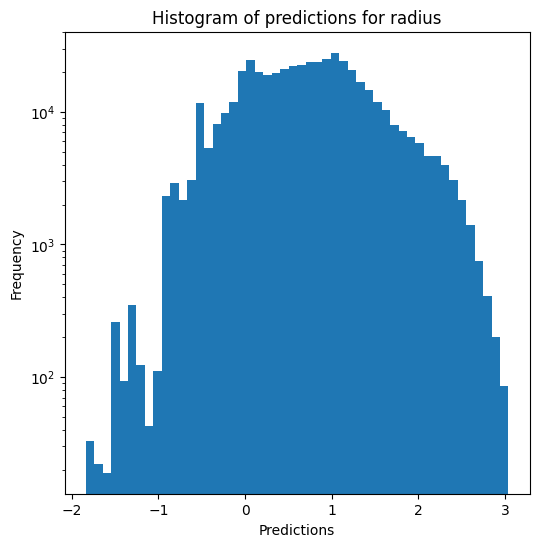

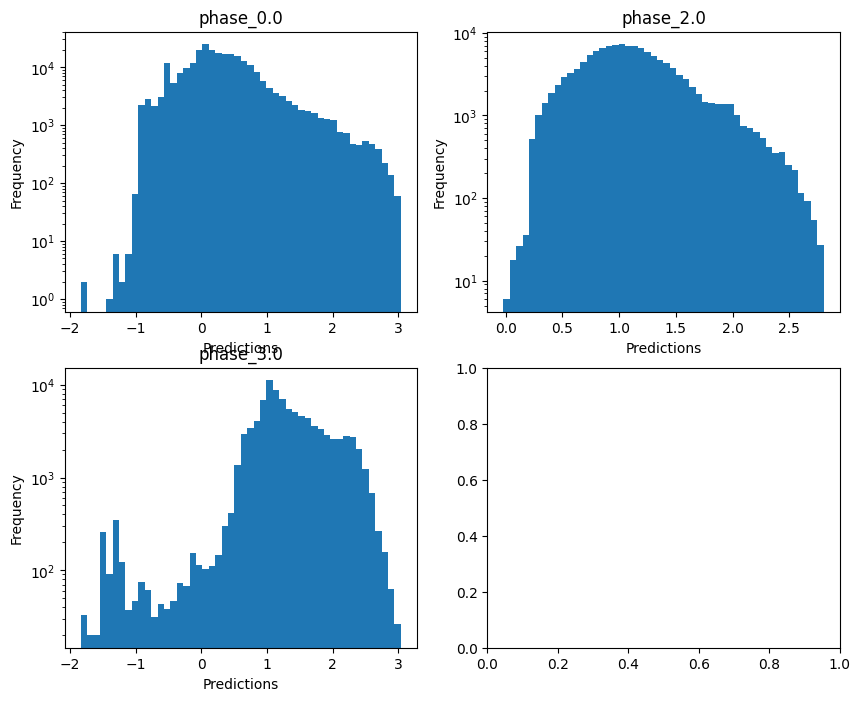

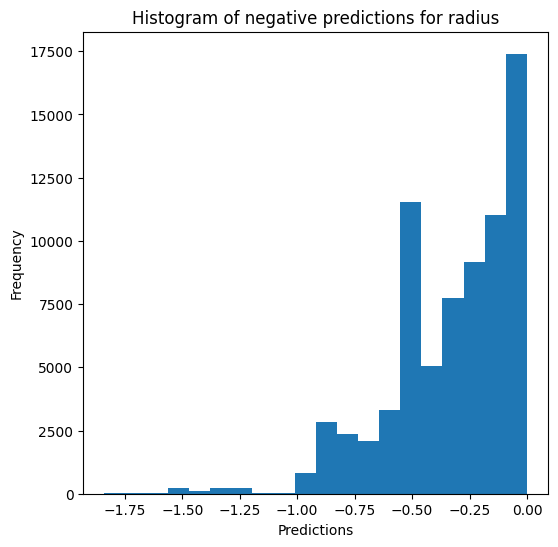

Saving results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=False, use_preds=True, save=True, show=True)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9735675433880364
  RMSE :  0.0573989564127189
  MAE :  0.01040742662211849
  MedAE :  0.0005732698673925896
  CORR :  0.9868170233131612
  MAX_ER :  0.9381209960555945
  Percentiles : 
    75th percentile :  0.00148332242157867
    90th percentile :  0.005040137476612742
    95th percentile :  0.02306426032126754
    99th percentile :  0.31883603822887374

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.9749793216067411
  RMSE :  0.05002741540475411
  MAE :  0.019945293374147976
  MedAE :  0.0020930777775791665
  CORR :  0.9874139824617537
  MAX_ER :  0.7219005422592799
  Percentiles : 
    75th percentile :  0.011236160953198349
    90th percentile :  0.06938849251818846
    95th percentile :  0.11192273852541657
    

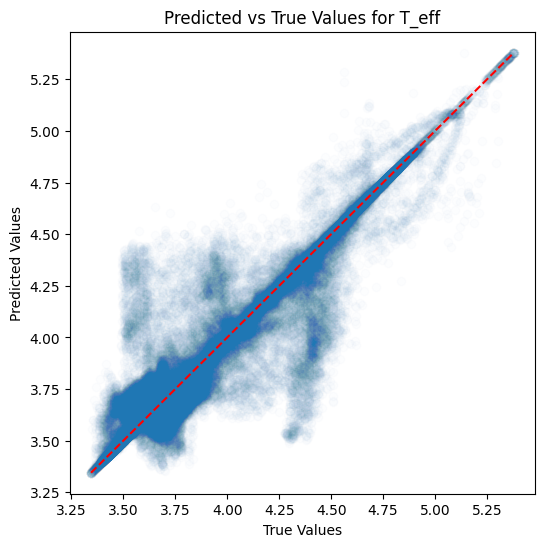

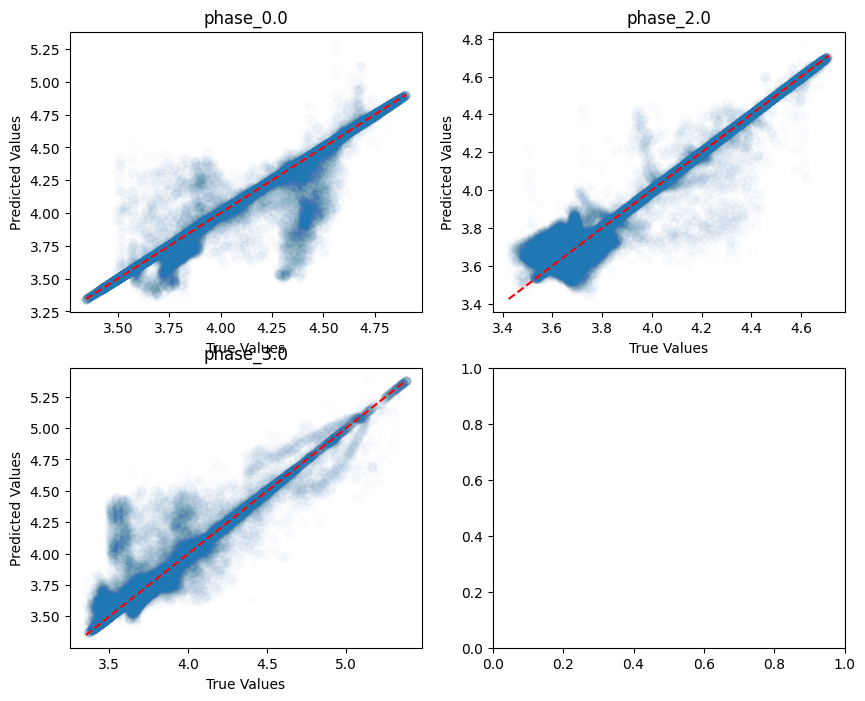

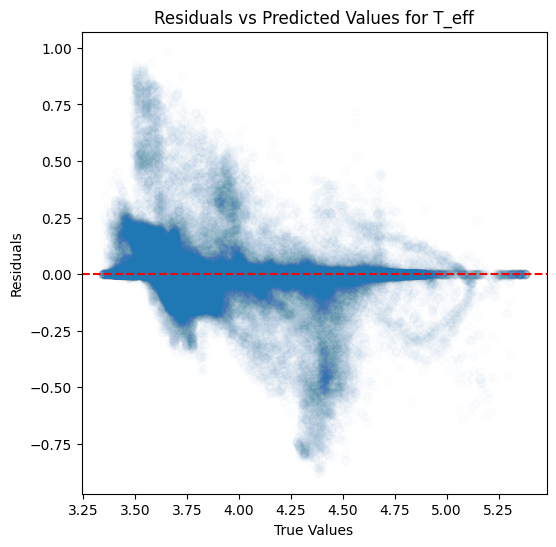

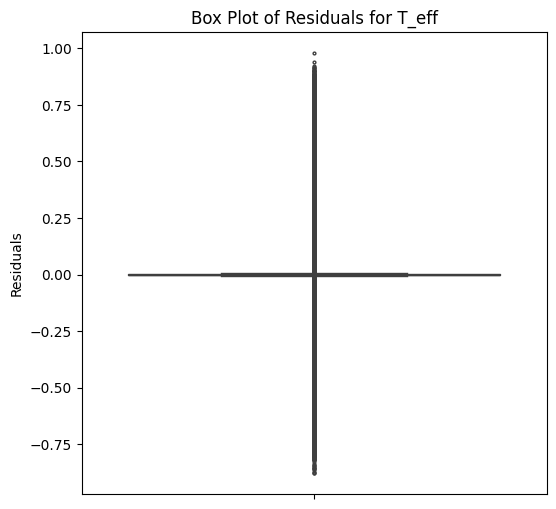

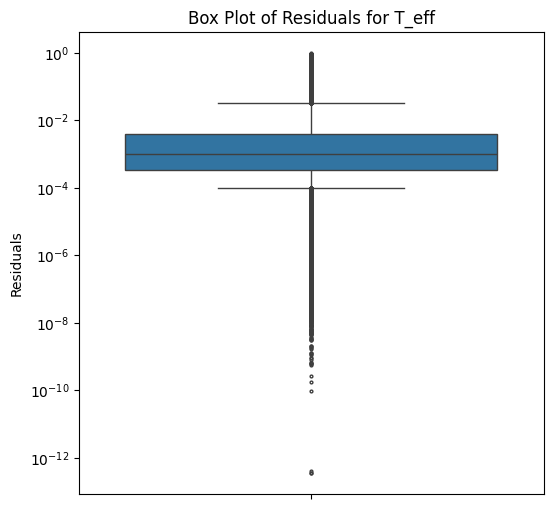

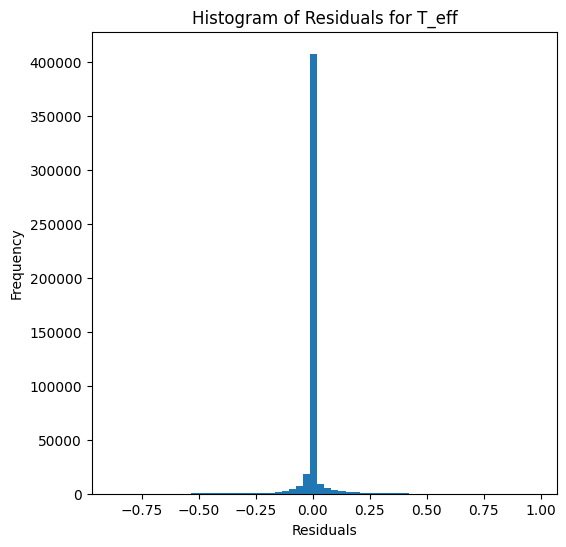

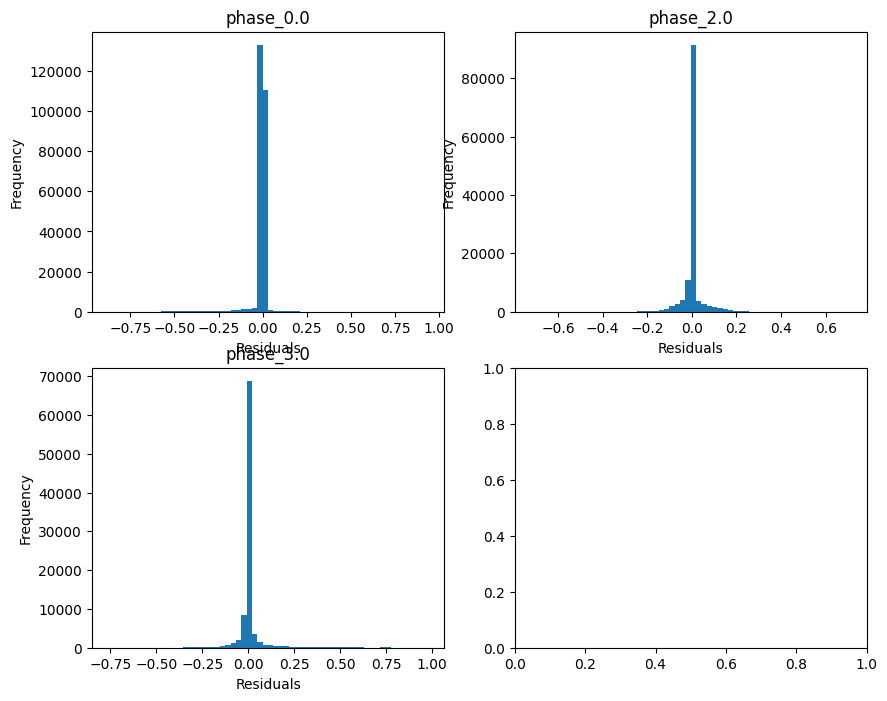

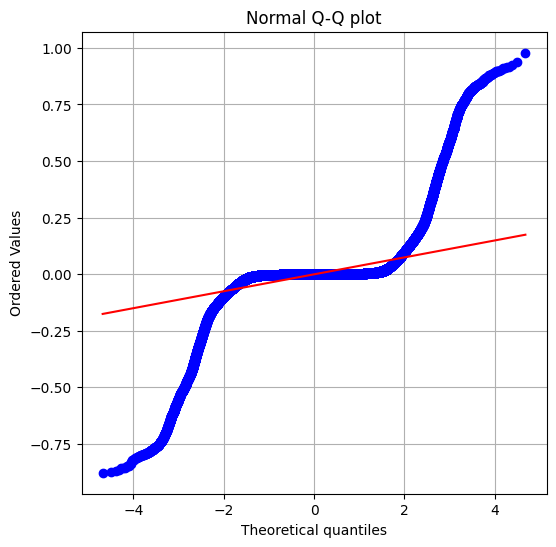

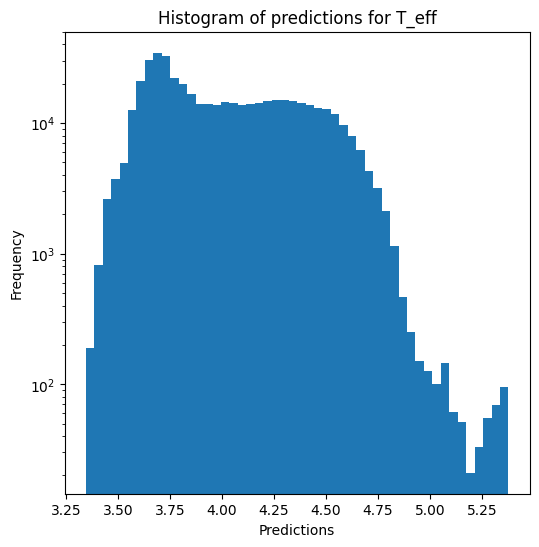

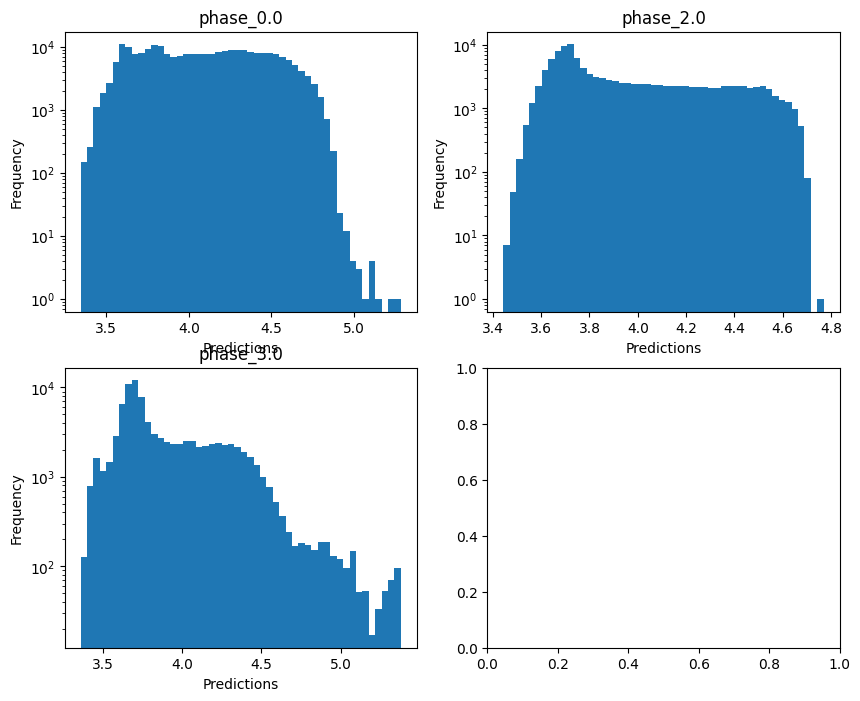


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6522958673461752
  RMSE :  0.37339799877893165
  MAE :  0.06911127312085263
  MedAE :  0.0017326429928221643
  CORR :  0.86296442736027
  MAX_ER :  5.599746329167281
  Percentiles : 
    75th percentile :  0.005257391177645676
    90th percentile :  0.019605519528798094
    95th percentile :  0.1497623370433996
    99th percentile :  2.1884373092012184

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.3845974705228292
  RMSE :  0.7149654003152681
  MAE :  0.3025681029912157
  MedAE :  0.010318927200932748
  CORR :  0.6623454160344504
  MAX_ER :  4.597049550223976
  Percentiles : 
    75th percentile :  0.14029880761278202
    90th percentile :  1.23724397193405
    95th percentile :  1.8671510744110715
    99th percentile :  2.871871484460464

log_g results for the phase category with a 

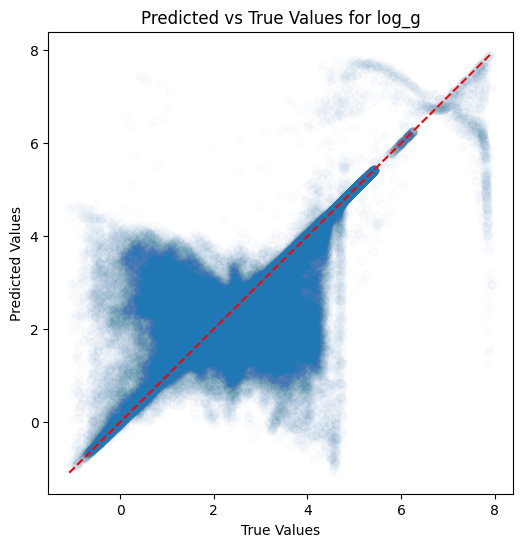

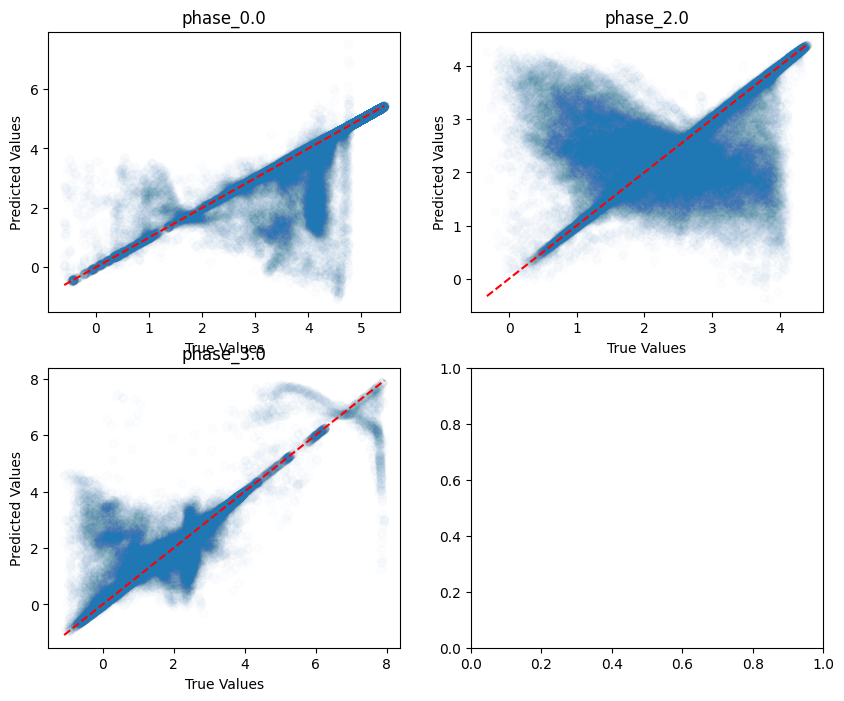

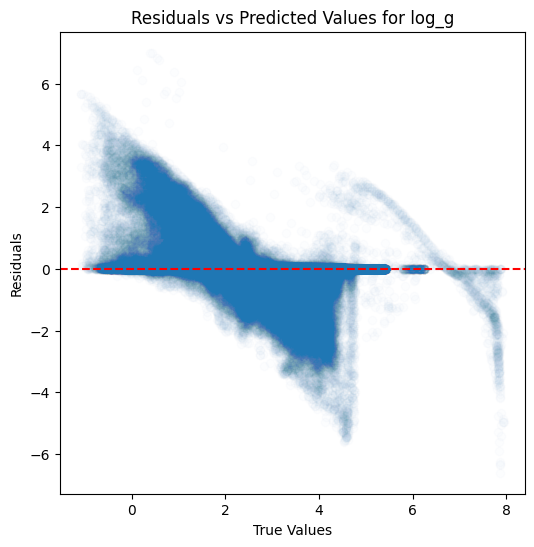

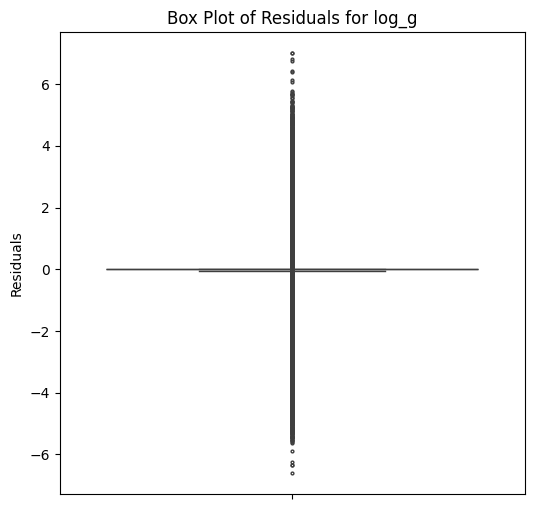

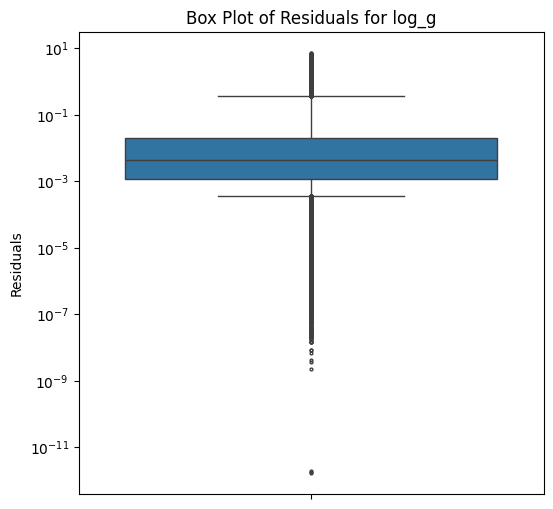

...

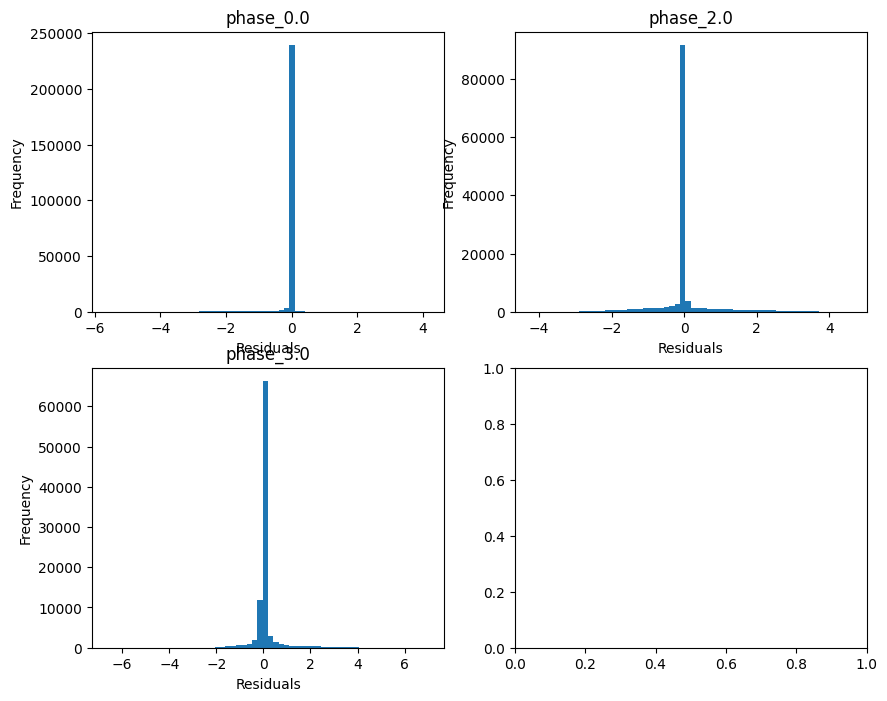

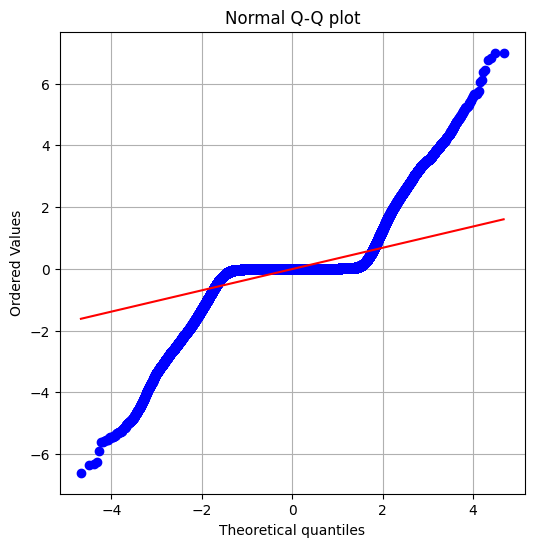

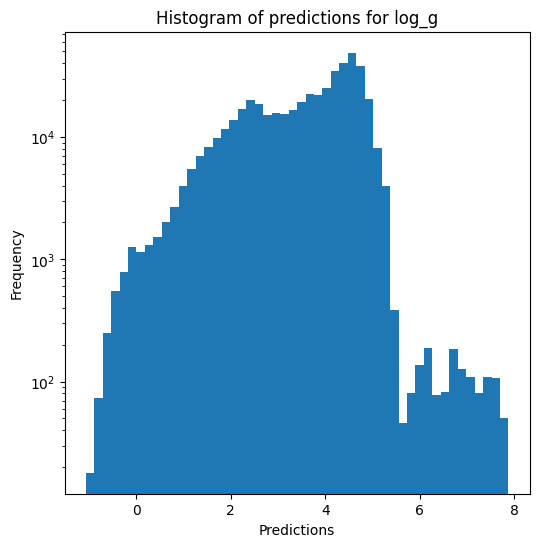

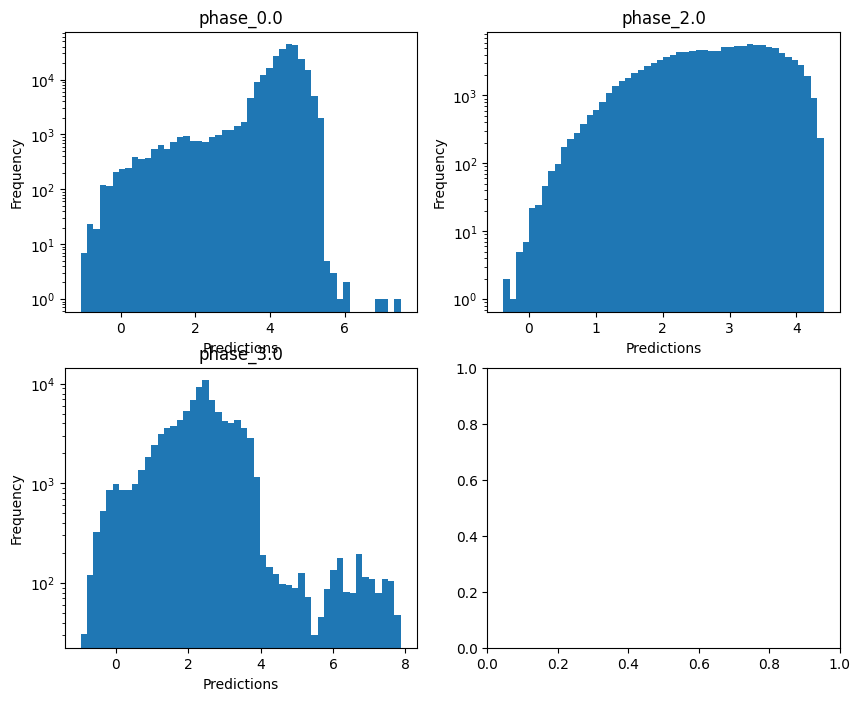

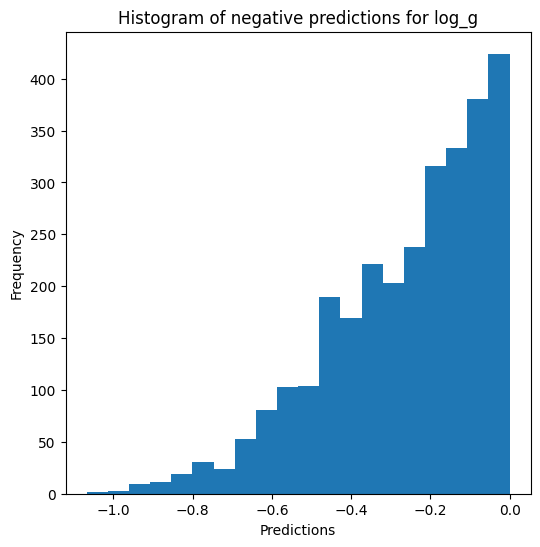


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8947376946535198
  RMSE :  0.18689905367857812
  MAE :  0.03491185209327959
  MedAE :  0.0011349254093981909
  CORR :  0.9510689208146276
  MAX_ER :  2.7996862308420005
  Percentiles : 
    75th percentile :  0.0031646193032087433
    90th percentile :  0.010816129138374087
    95th percentile :  0.07522348992012985
    99th percentile :  1.0973789395961753

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  0.47114684654920125
  RMSE :  0.35747407623892824
  MAE :  0.15128628171714248
  MedAE :  0.005170587636714408
  CORR :  0.7202437016134183
  MAX_ER :  2.2987981644575246
  Percentiles : 
    75th percentile :  0.07014607967692416
    90th percentile :  0.6185875064522571
    95th percentile :  0.9335802569817079
    99th percentile :  1.4358005443494615

radius results for the phase c

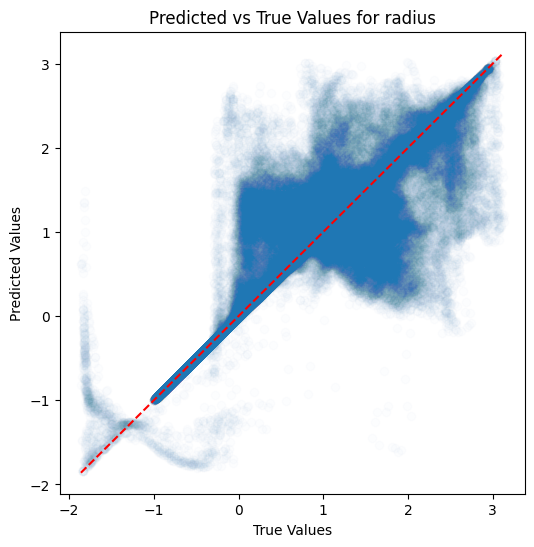

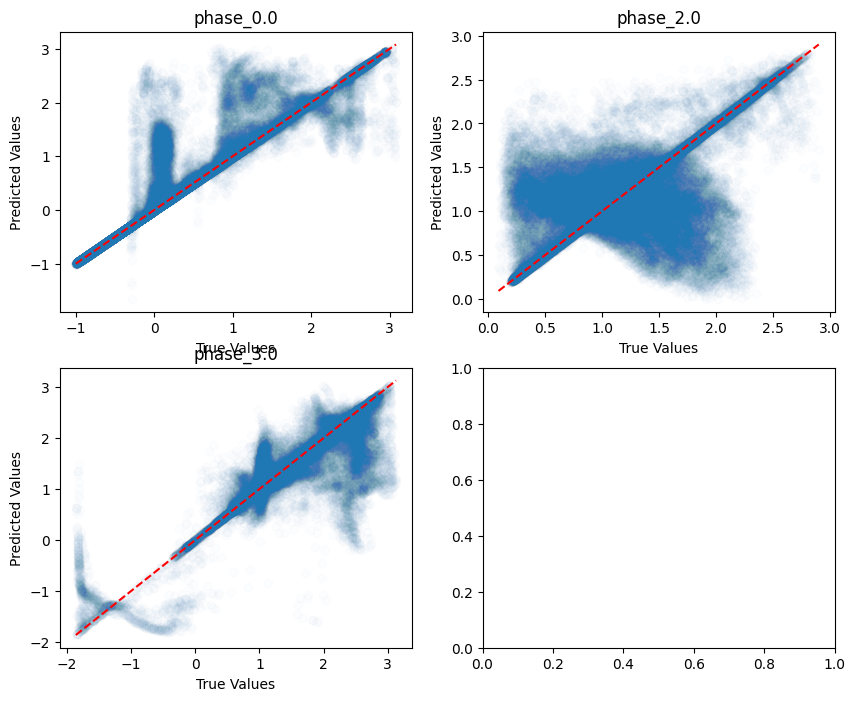

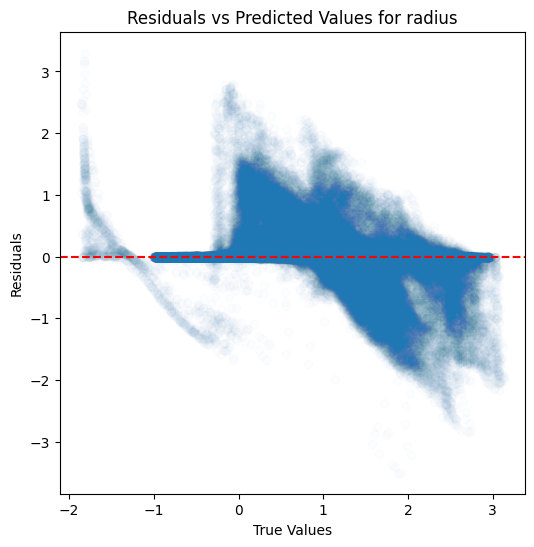

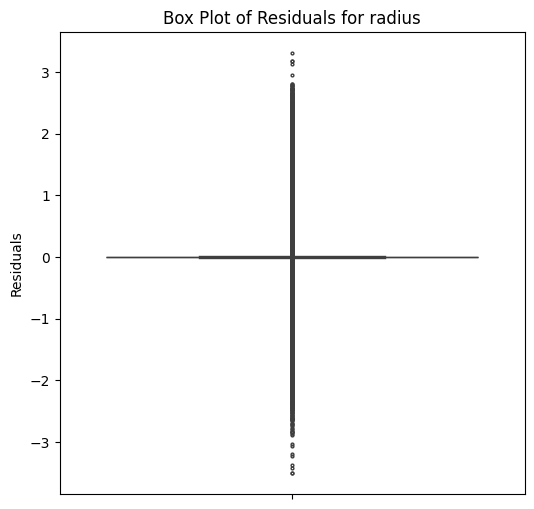

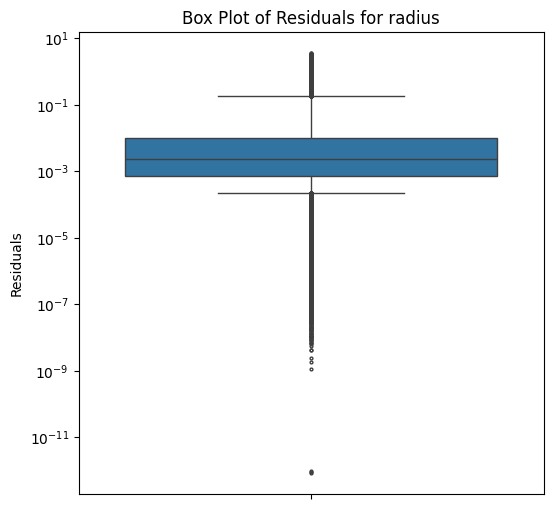

...

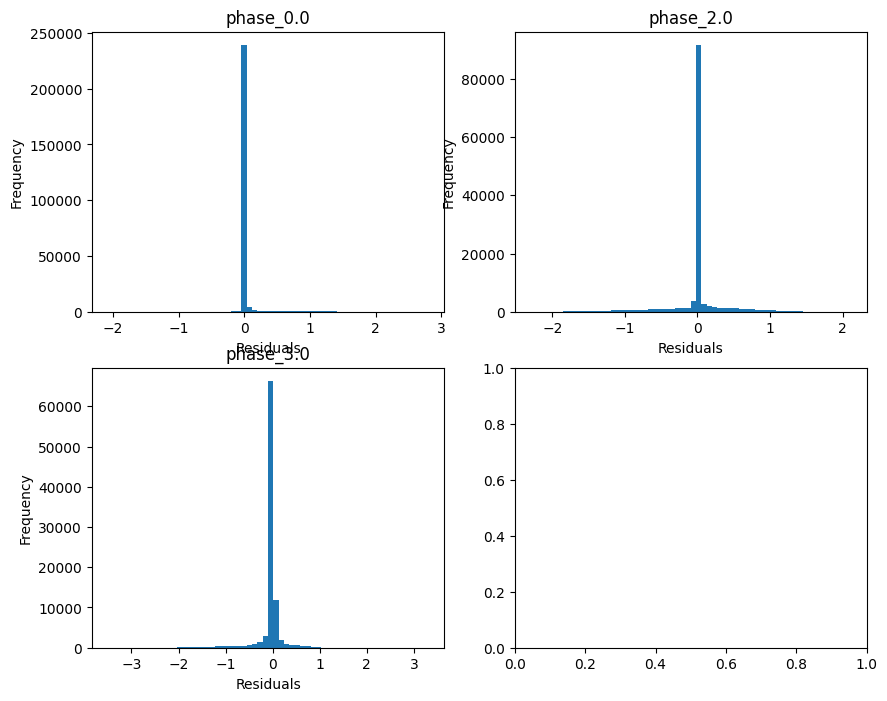

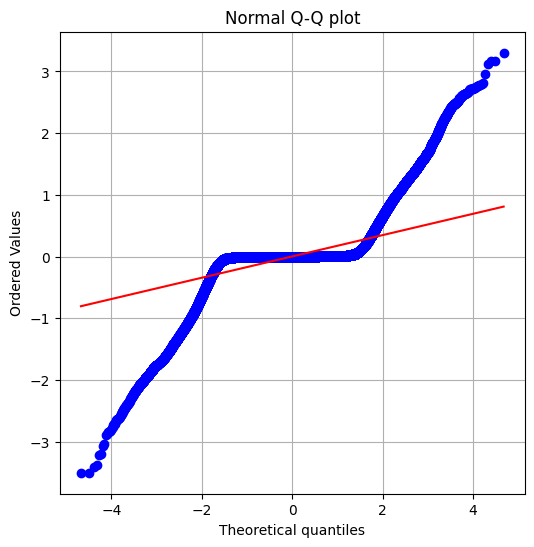

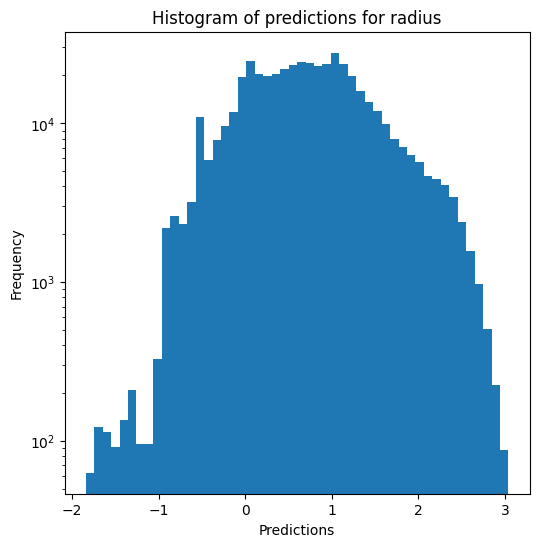

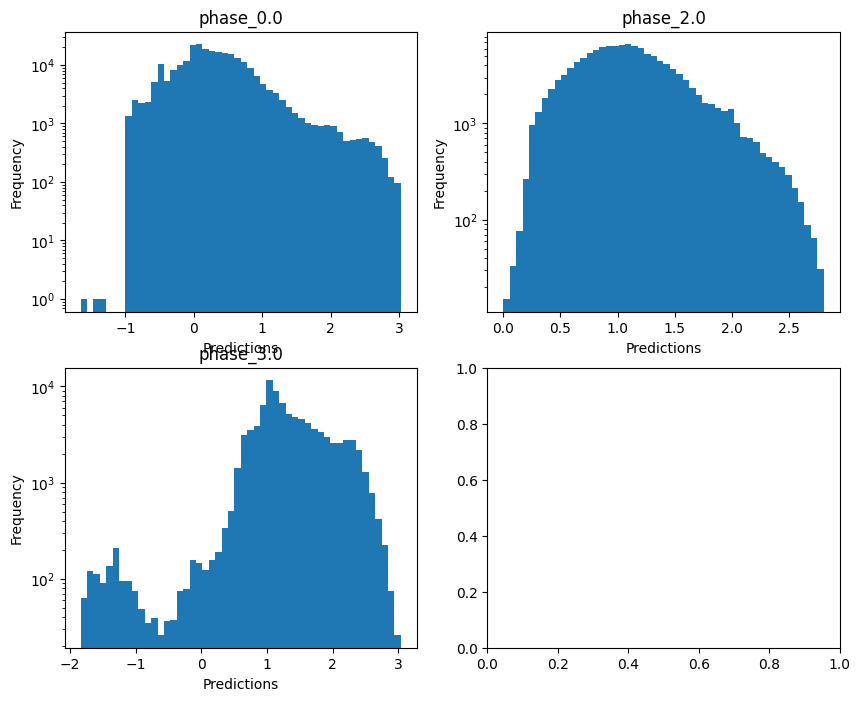

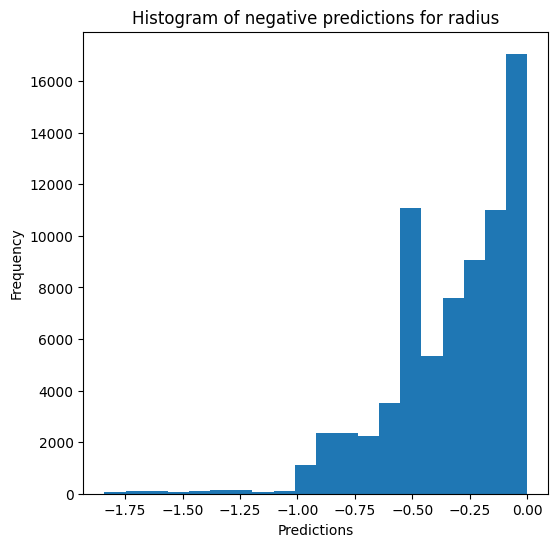

Saving results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=False, use_preds=True, save=True, show=True, n_jobs=5)

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9391725353402666
  RMSE :  0.09326805218721007
  MAE :  0.05148278139522577
  MedAE :  0.01665273887965668
  CORR :  0.9693924200589039
  MAX_ER :  1.173261398392266
  Percentiles : 
    75th percentile :  0.06303686520849627
    90th percentile :  0.1571708619365957
    95th percentile :  0.2238374829888197
    99th percentile :  0.3488126232376113

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.8745321890891429
  RMSE :  0.1141003439207496
  MAE :  0.08511998871975945
  MedAE :  0.06434631450771122
  CORR :  0.9358757101582275
  MAX_ER :  0.5324085172090811
  Percentiles : 
    75th percentile :  0.11811766554302772
    90th percentile :  0.18974412588499545
    95th percentile :  0.24524595542599115
    99th percen

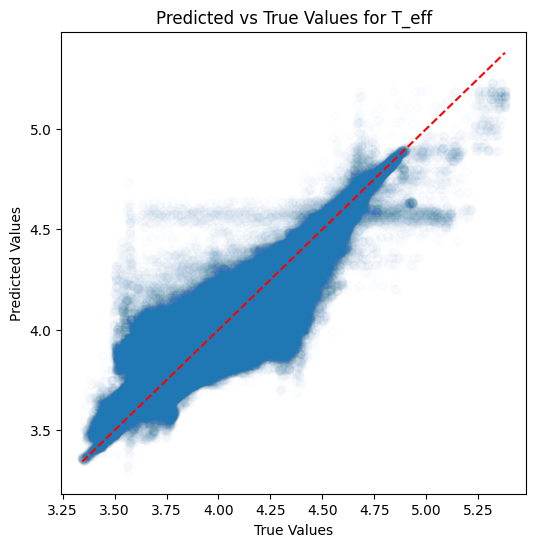

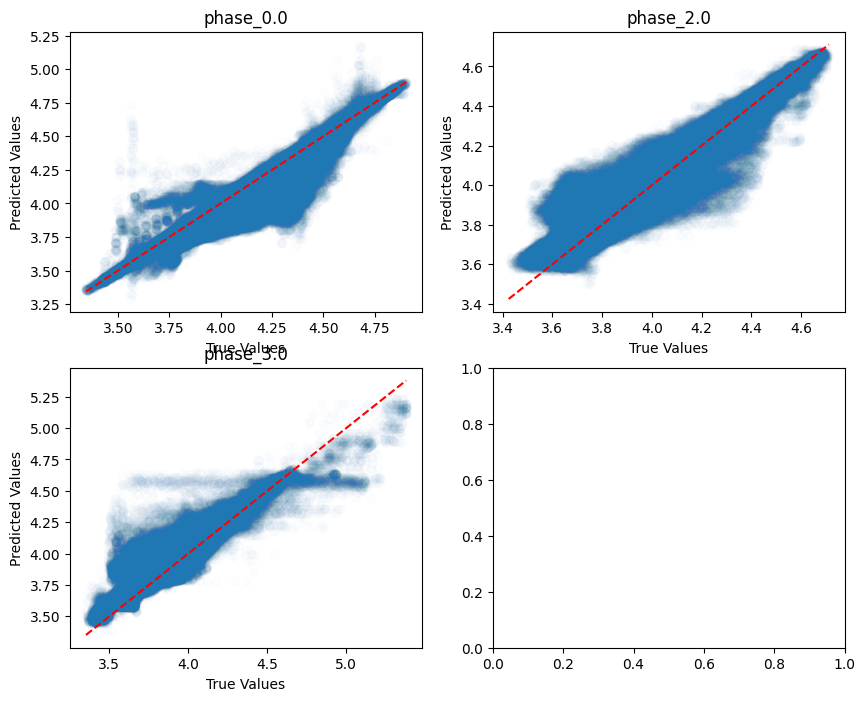

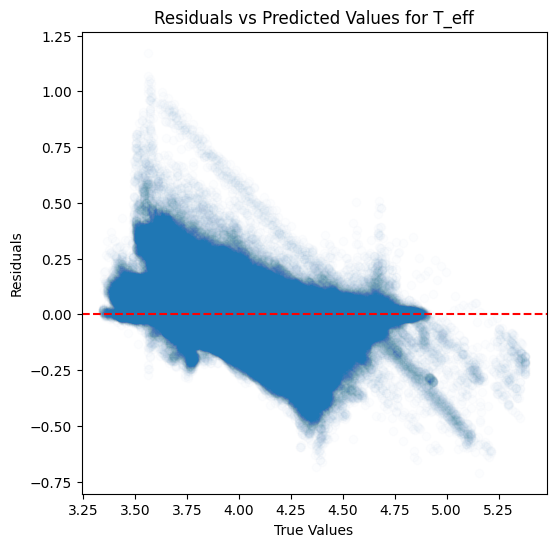

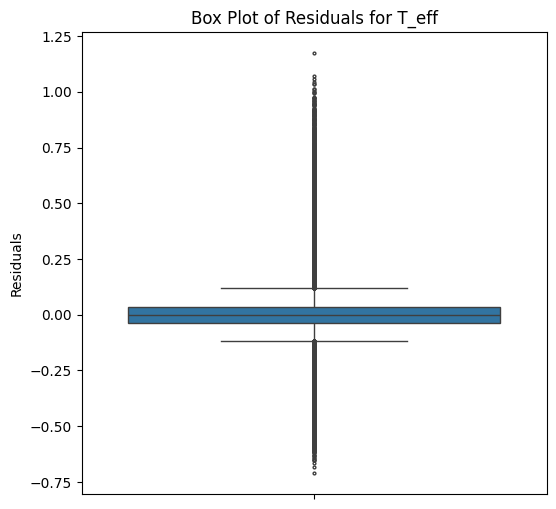

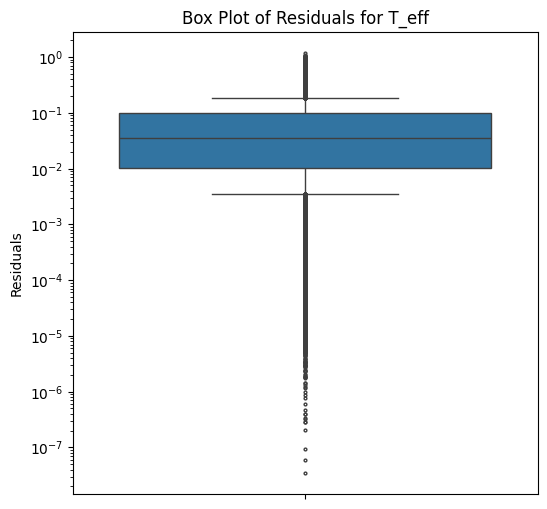

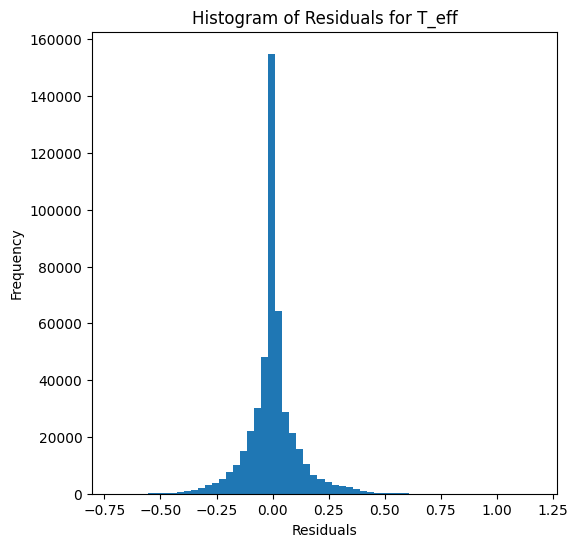

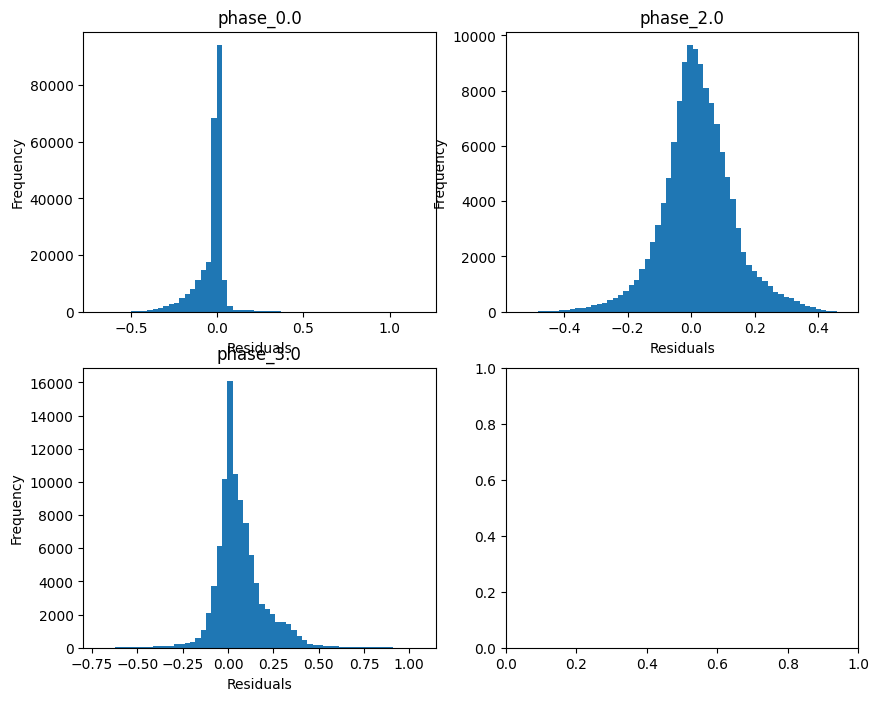

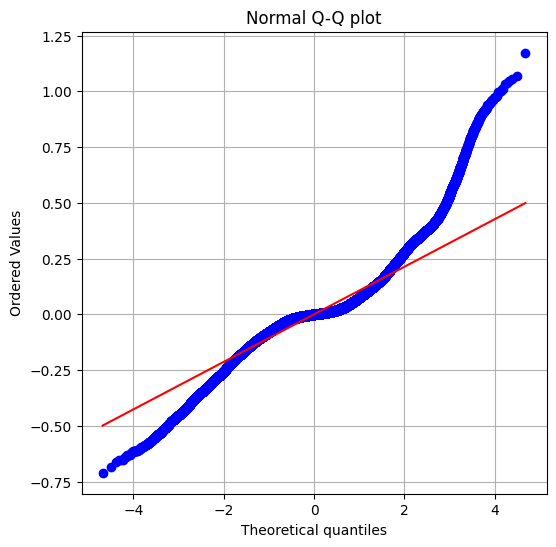

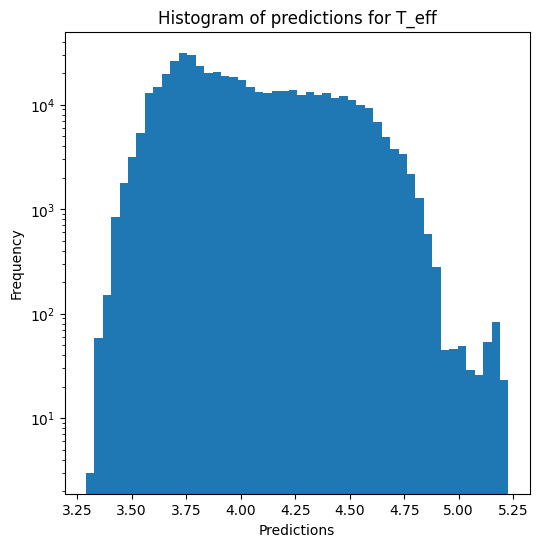

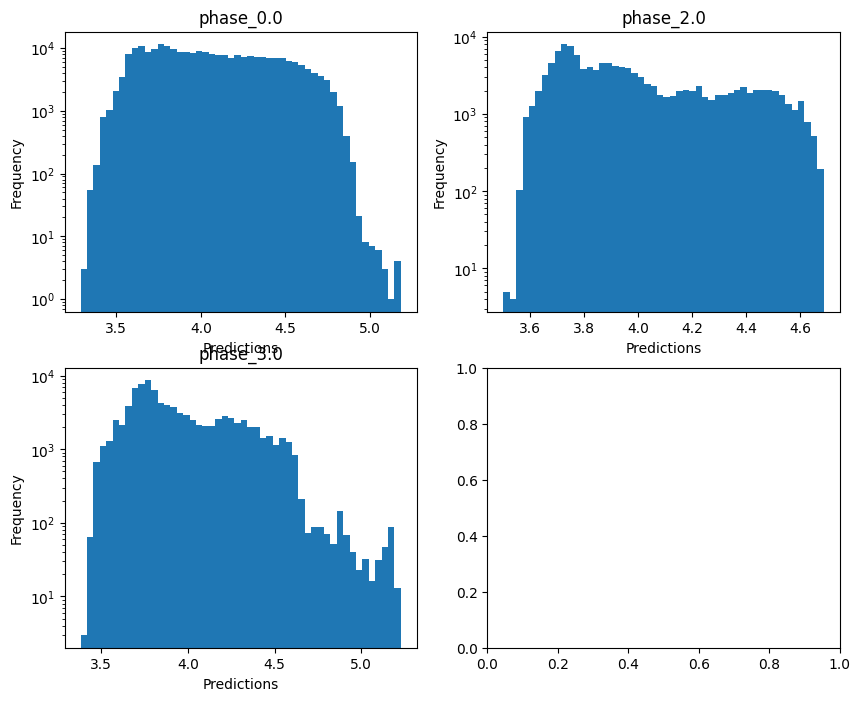


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44709349776291984
  RMSE :  0.5087055175509008
  MAE :  0.2835741423140279
  MedAE :  0.08328129946111495
  CORR :  0.8353544991483793
  MAX_ER :  5.034566090605269
  Percentiles : 
    75th percentile :  0.370070387446753
    90th percentile :  0.8895378237551338
    95th percentile :  1.1962094675800536
    99th percentile :  1.7113499046511298

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.4158085528480163
  RMSE :  0.7034753886494034
  MAE :  0.5284905353865168
  MedAE :  0.3970370579283644
  CORR :  0.6450472714827769
  MAX_ER :  3.755999451067292
  Percentiles : 
    75th percentile :  0.7690279424915474
    90th percentile :  1.1795296030682807
    95th percentile :  1.451747755927888
    99th percentile :  2.043666162641566

log_g results for the phase category with a value of

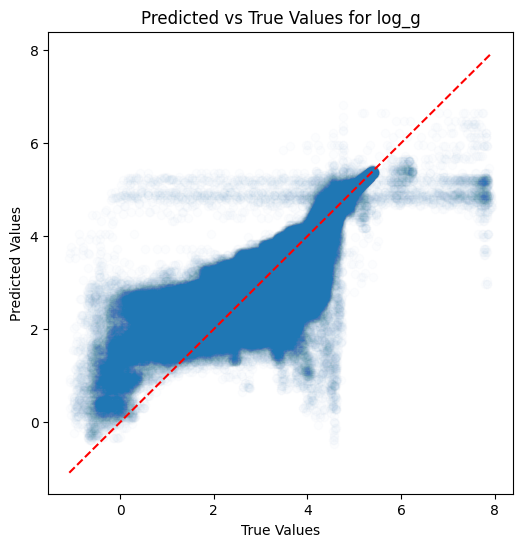

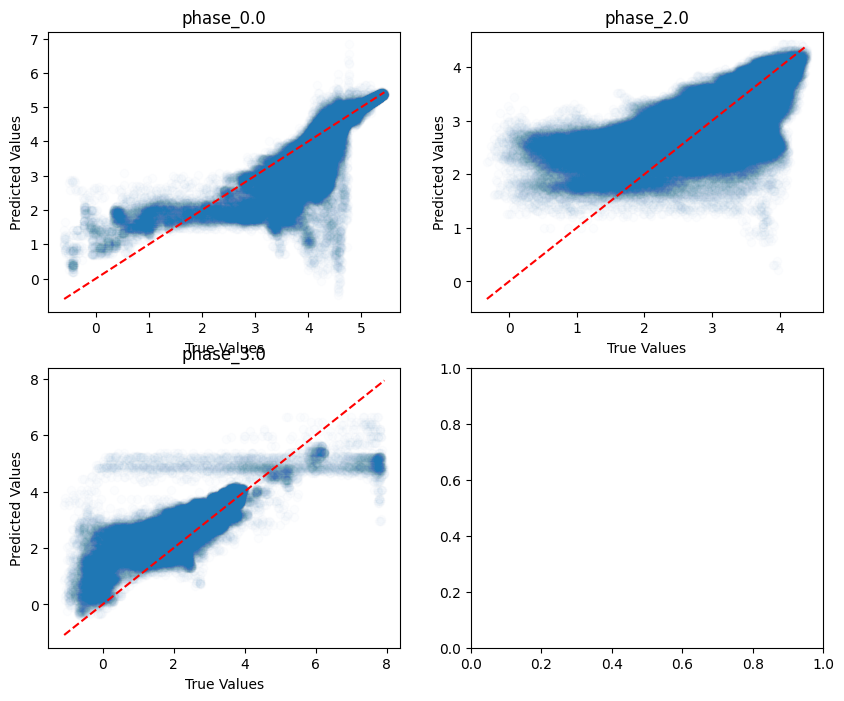

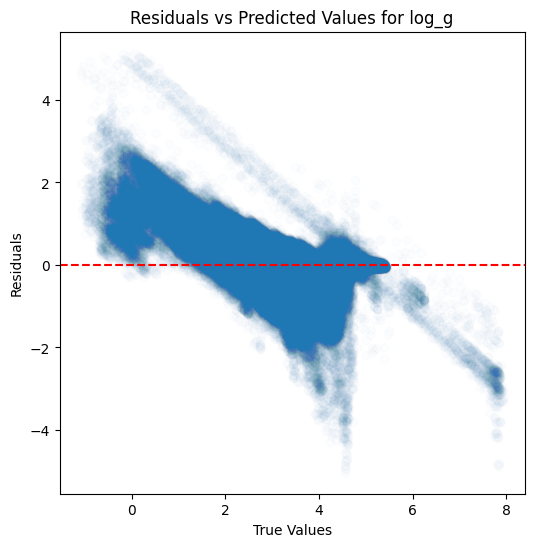

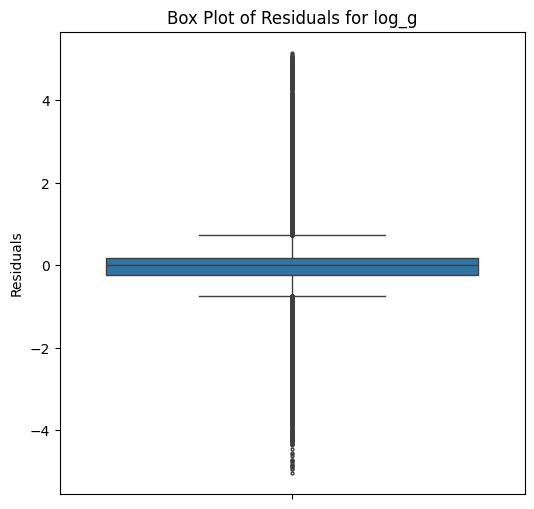

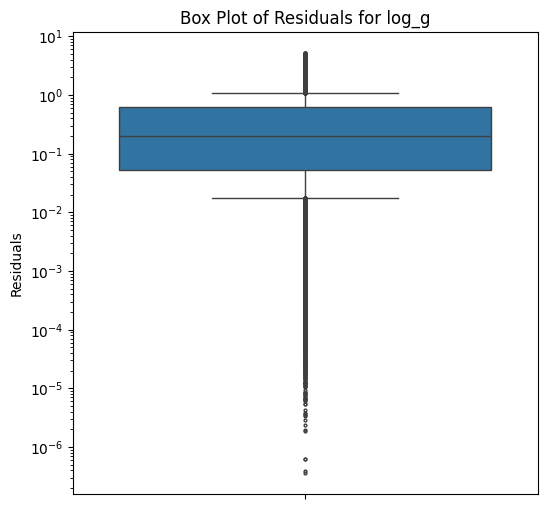

...

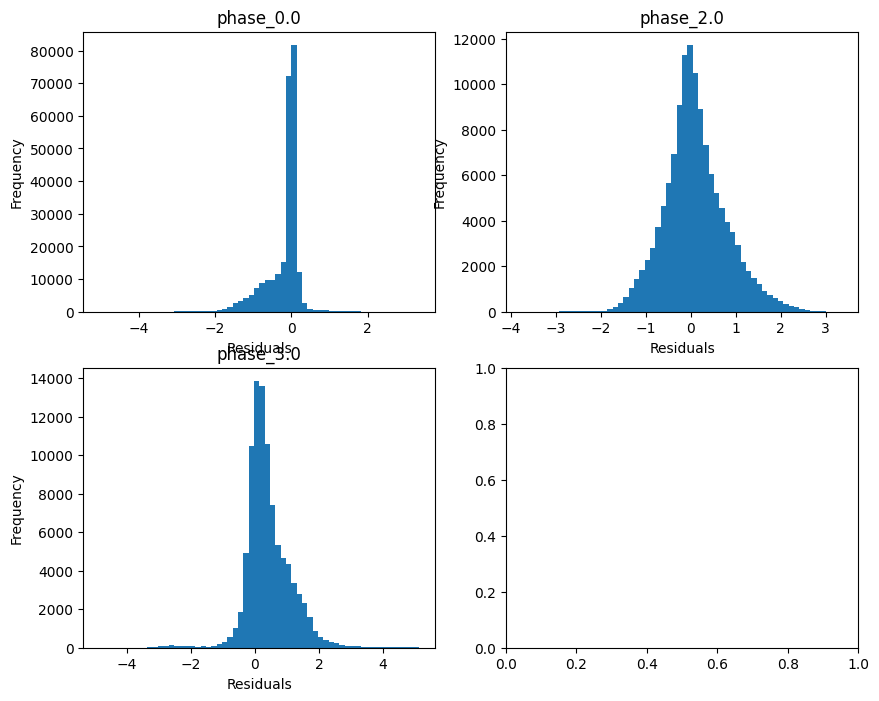

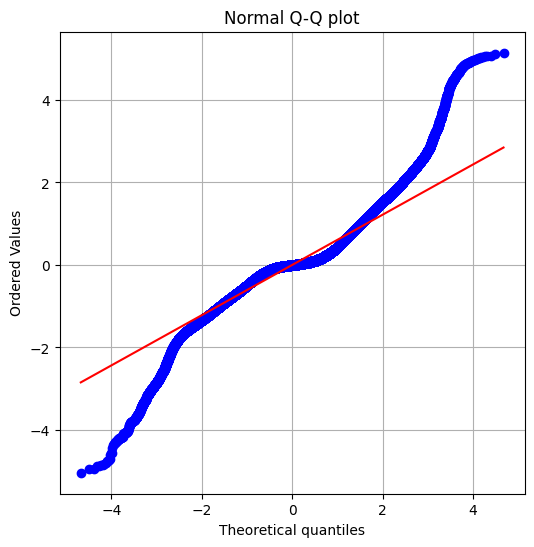

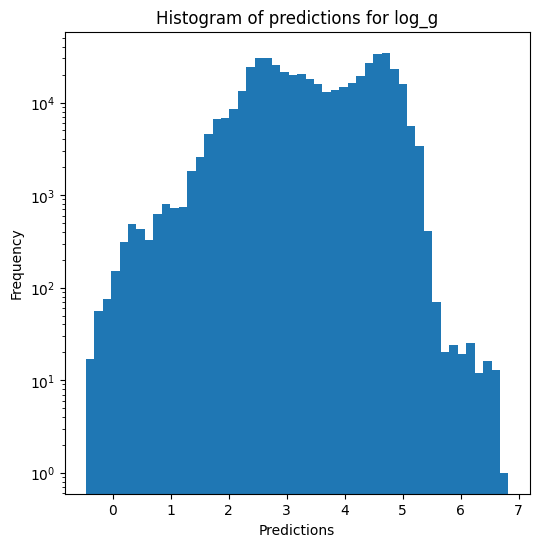

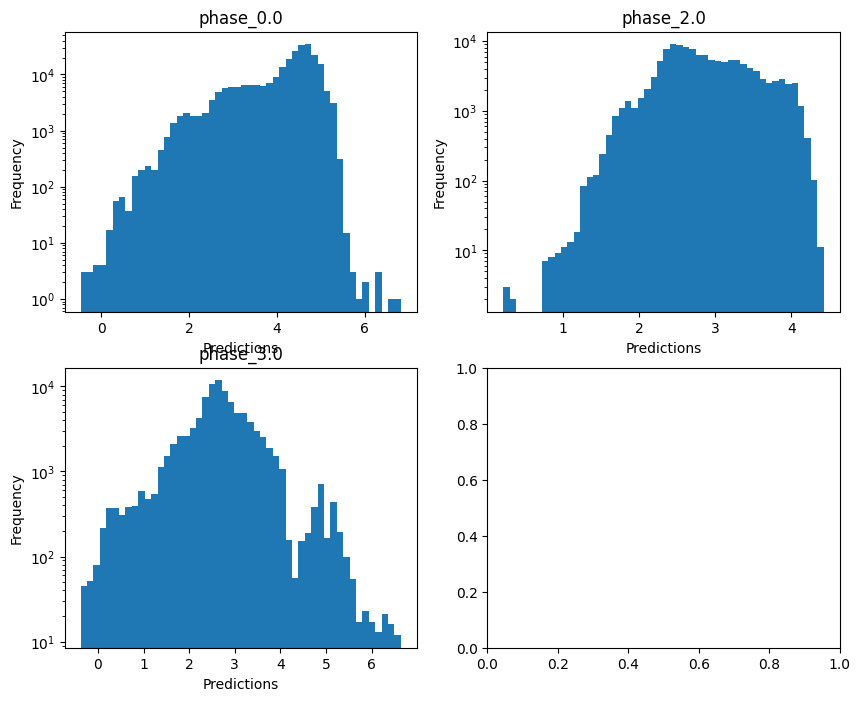

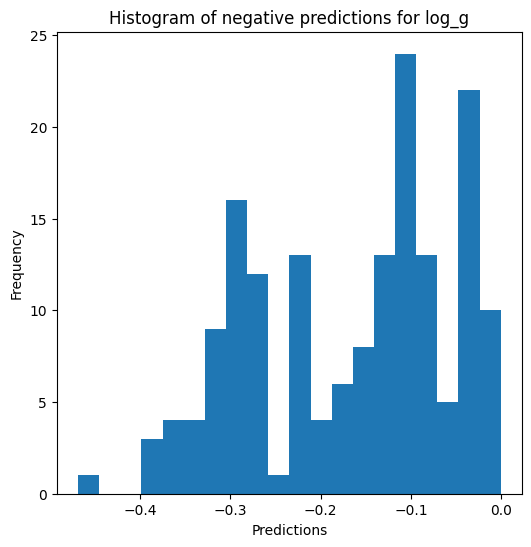


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8329907997110451
  RMSE :  0.2544792254214228
  MAE :  0.14163433301457706
  MedAE :  0.039905857595694094
  CORR :  0.9319587587236524
  MAX_ER :  2.411666484274498
  Percentiles : 
    75th percentile :  0.1848475459820671
    90th percentile :  0.4478159334910072
    95th percentile :  0.599129857958616
    99th percentile :  0.8579542207976751

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  0.4967057116401956
  RMSE :  0.35199162119437627
  MAE :  0.2646153999652926
  MedAE :  0.1985255531329843
  CORR :  0.7061067241484354
  MAX_ER :  1.866897949589237
  Percentiles : 
    75th percentile :  0.3857620515208653
    90th percentile :  0.5886074748636569
    95th percentile :  0.7256712251438642
    99th percentile :  1.0216055593914202

radius results for the phase category with a v

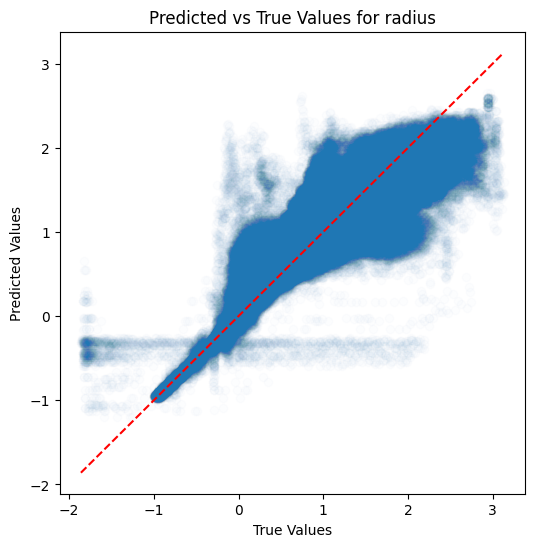

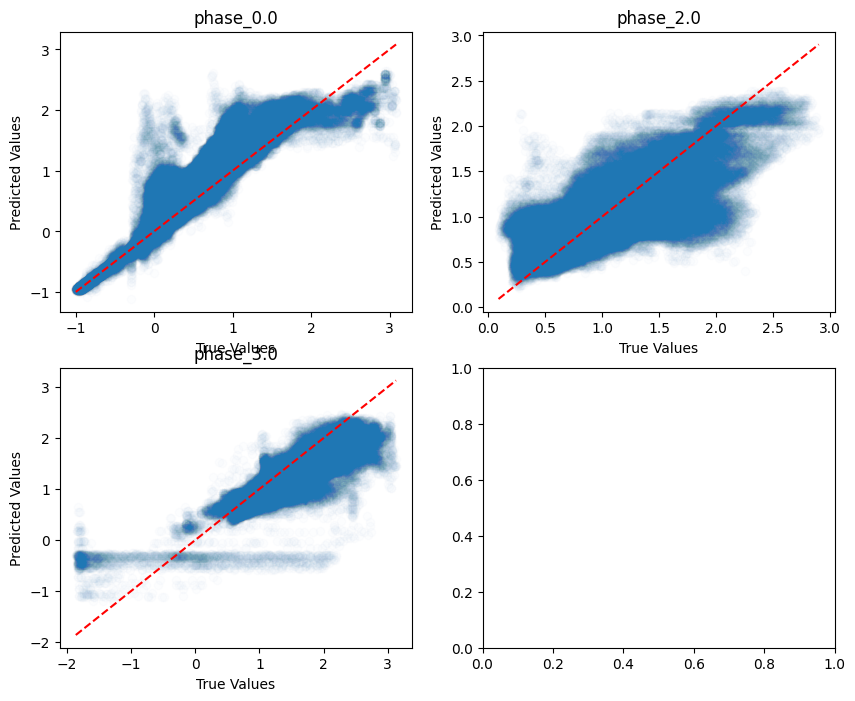

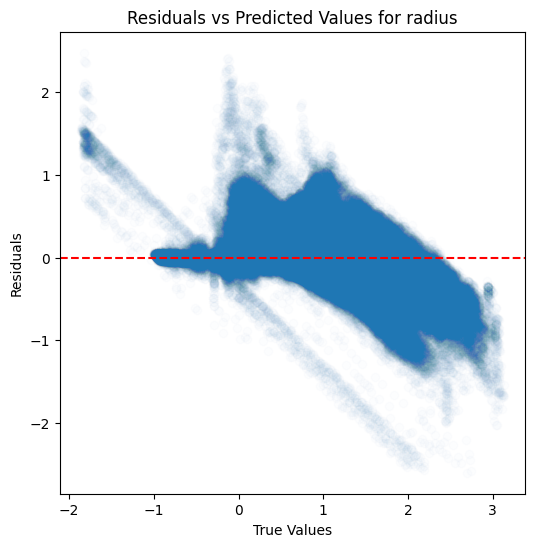

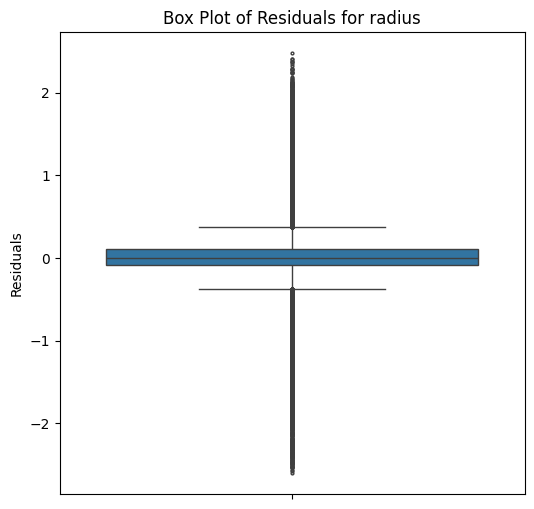

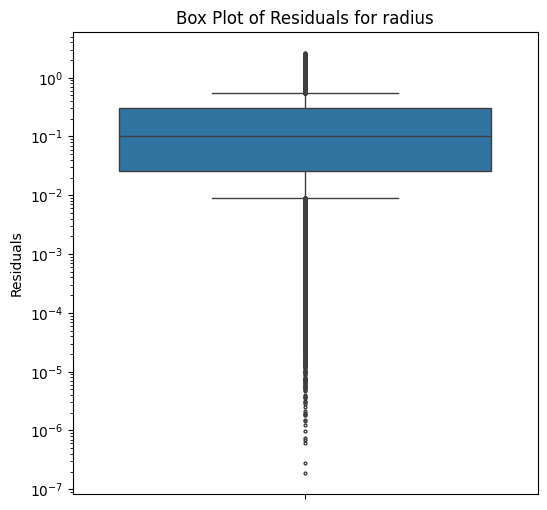

...

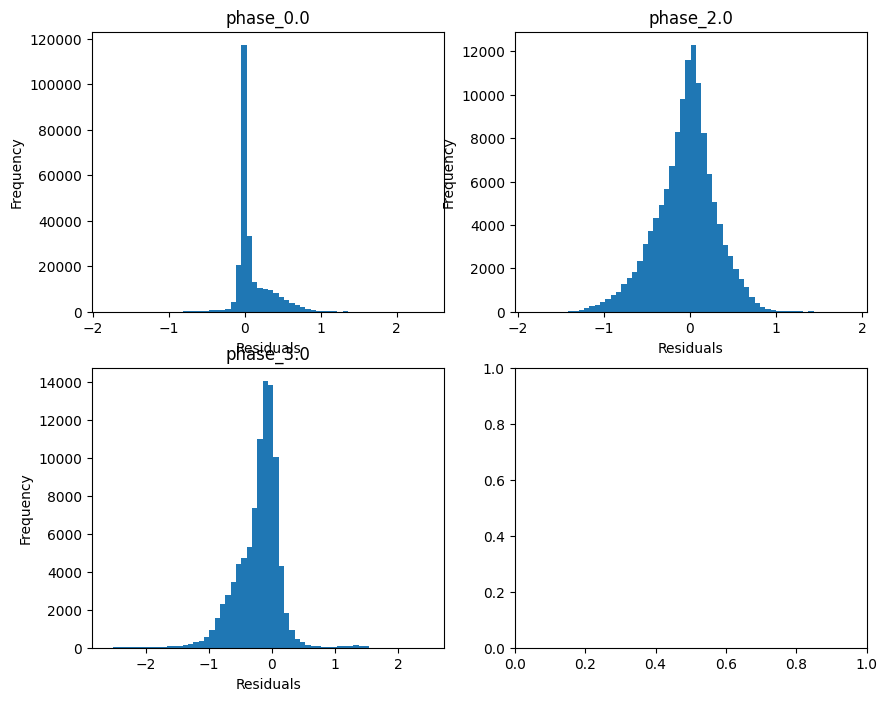

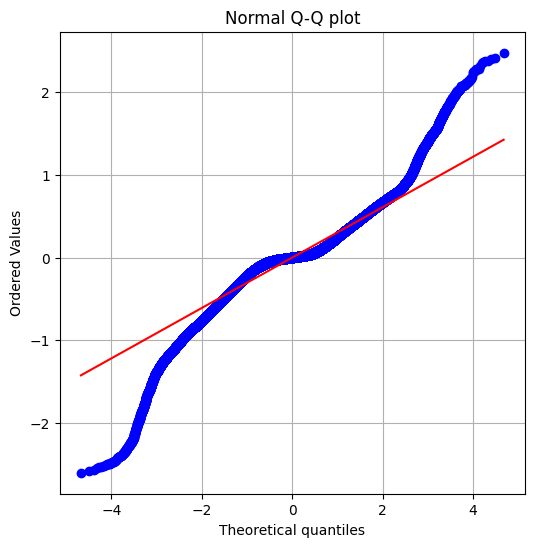

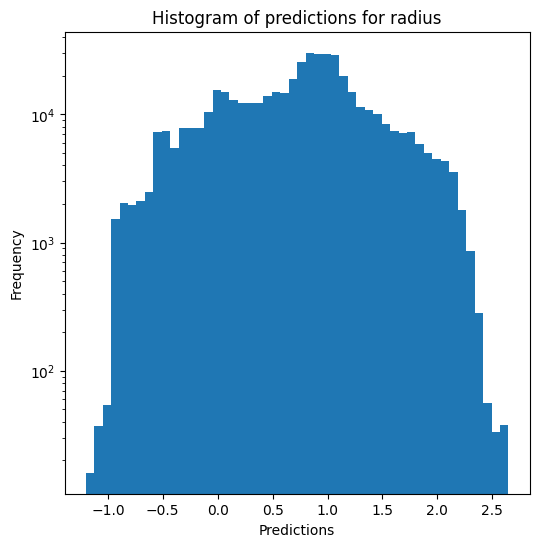

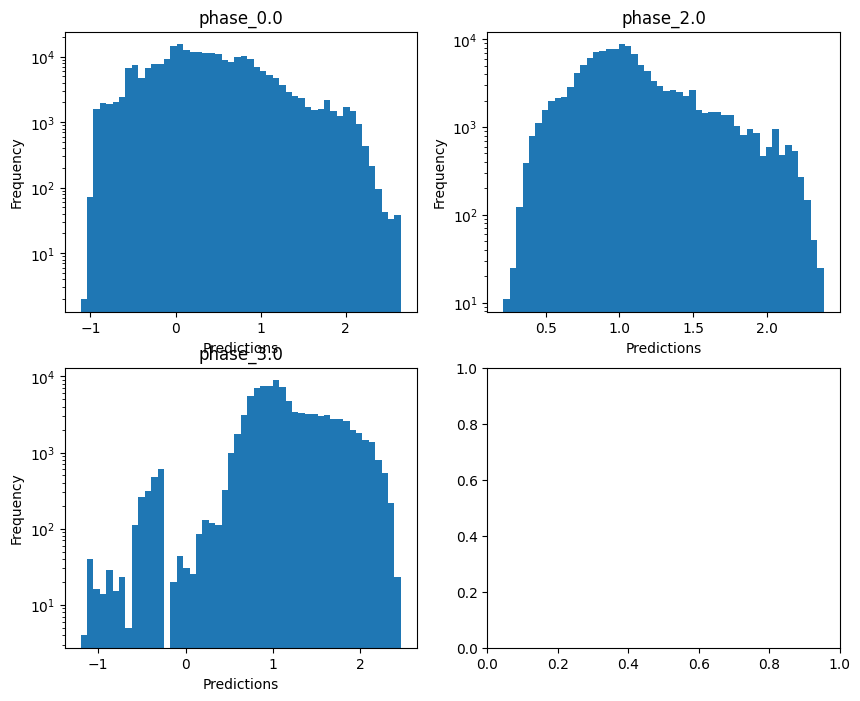

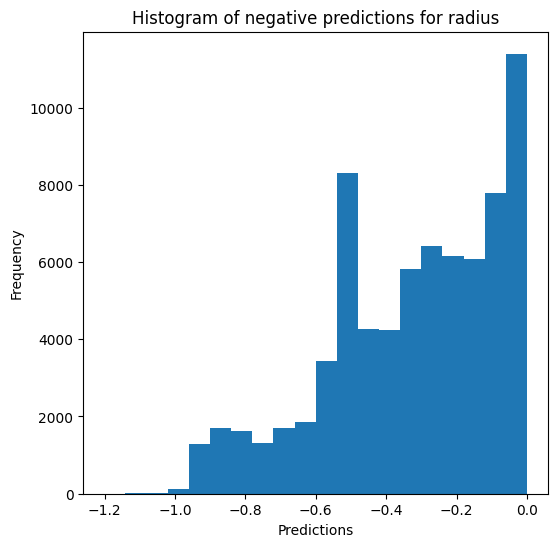

Saving results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=False, use_preds=True, save=True, show=True, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.8689639408690574
  RMSE :  0.12797774816166332
  MAE :  0.08961102312077494
  MedAE :  0.06426493707000969
  CORR :  0.9346090979828502
  MAX_ER :  1.0578605965108268
  Percentiles : 
    75th percentile :  0.12294431153265517
    90th percentile :  0.1962460810352536
    95th percentile :  0.26913079814499613
    99th percentile :  0.42959288113020017

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.7358375399373639
  RMSE :  0.18956995688494935
  MAE :  0.14926414696997545
  MedAE :  0.12420841861472032
  CORR :  0.8666231764016785
  MAX_ER :  0.7409279533916711
  Percentiles : 
    75th percentile :  0.21033855398538082
    90th percentile :  0.3095074624971128
    95th percentile :  0.37726740211926324
    99th per

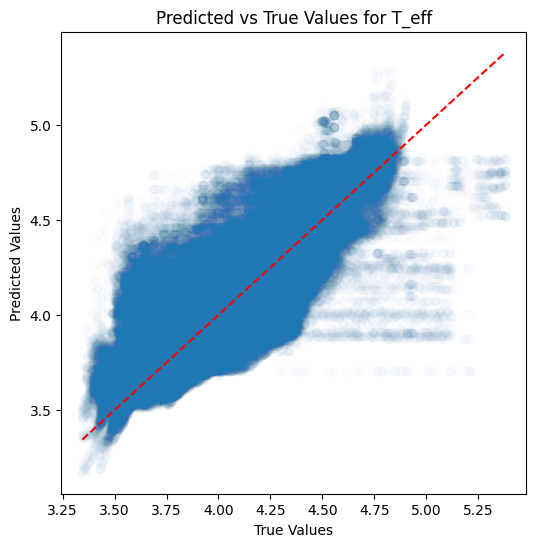

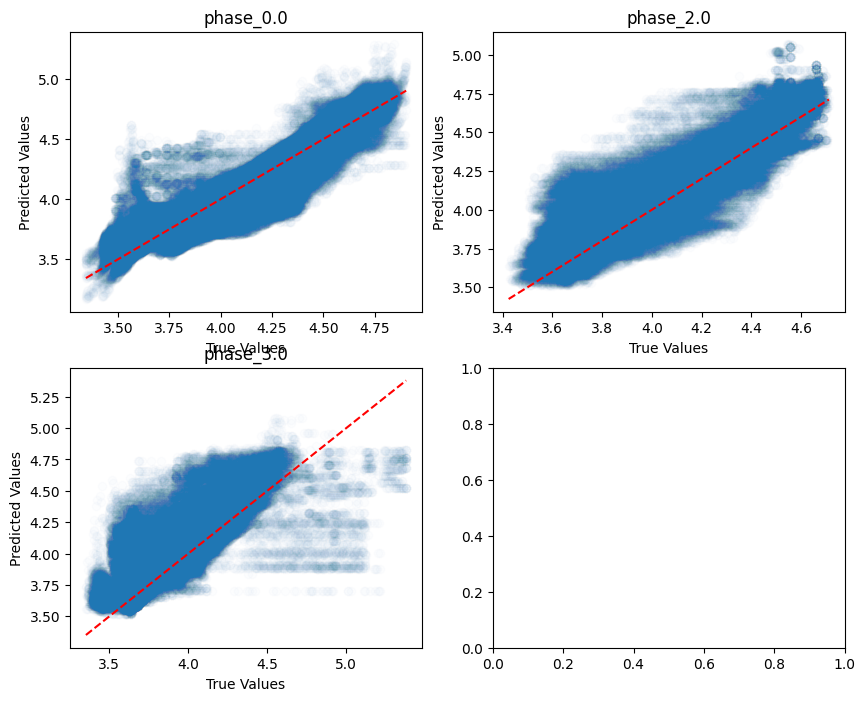

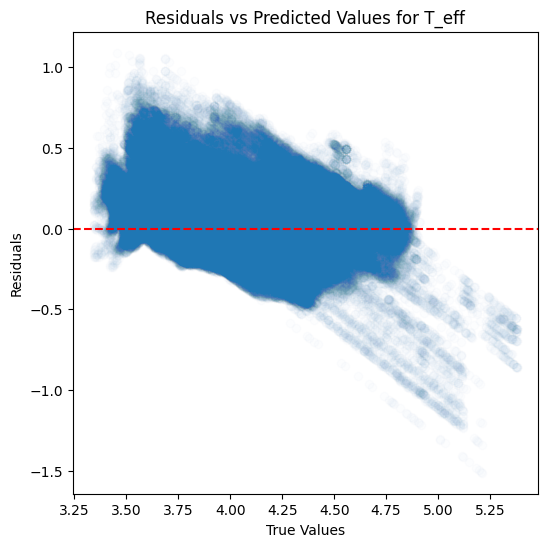

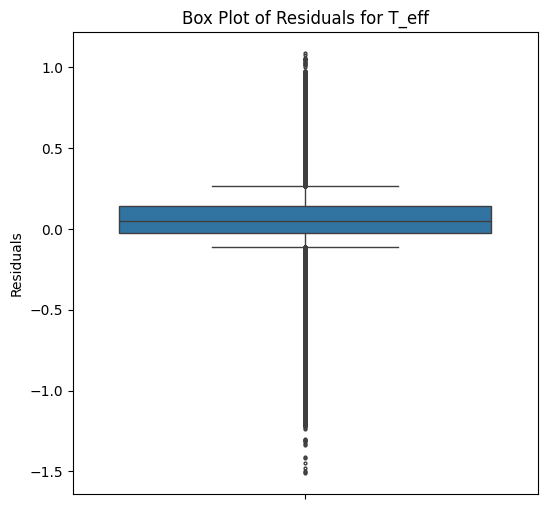

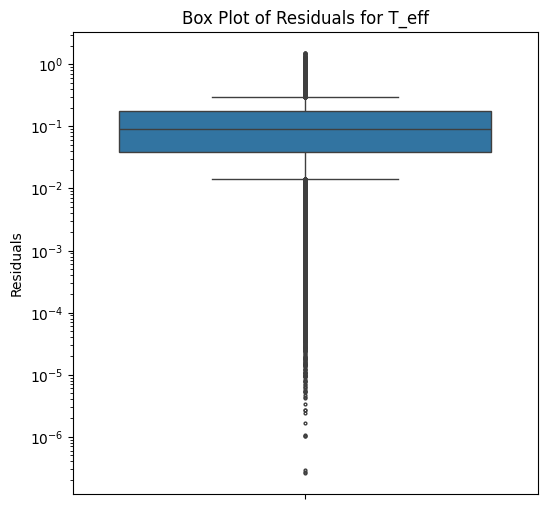

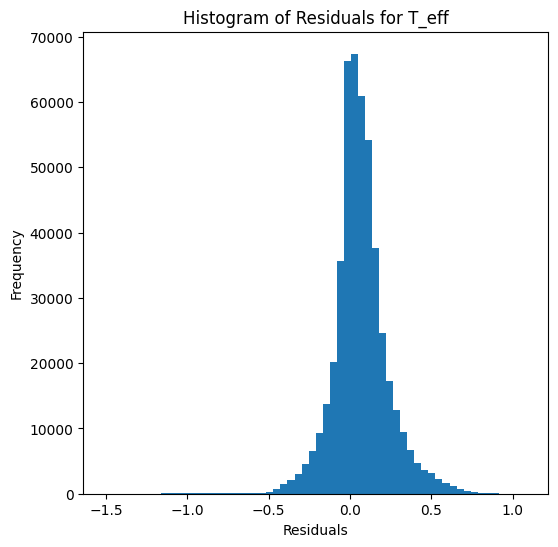

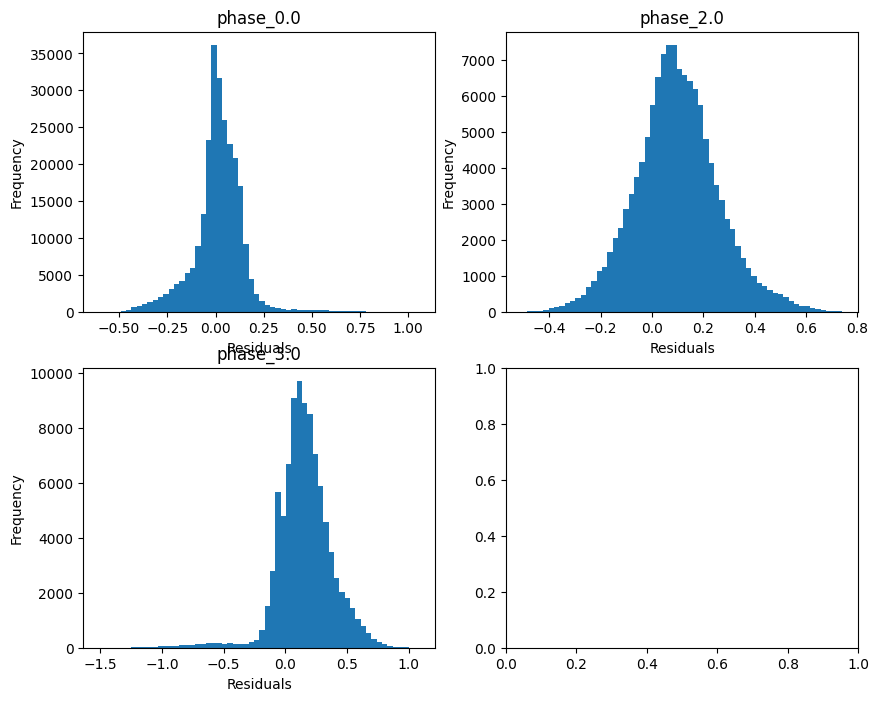

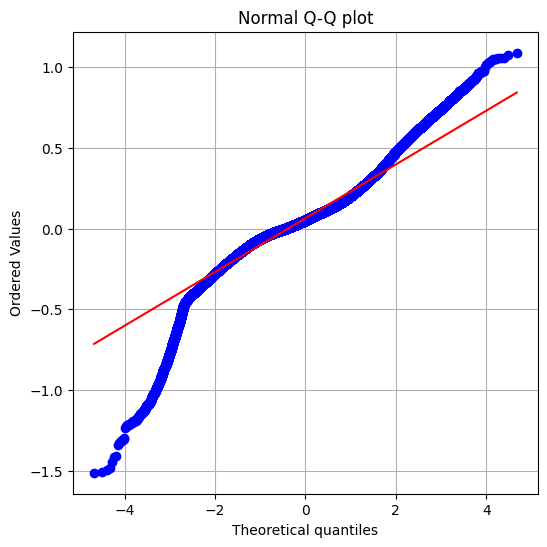

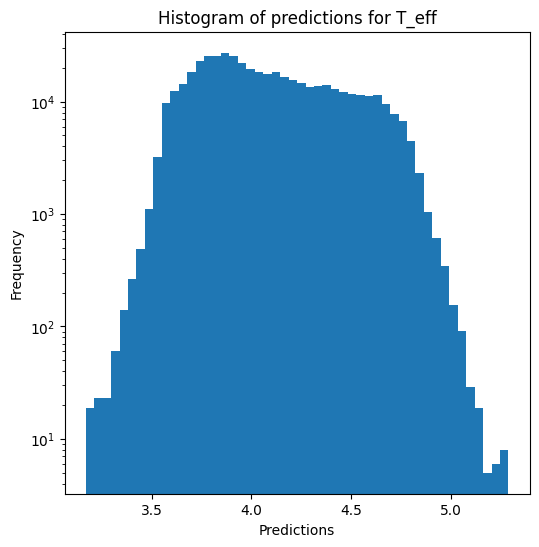

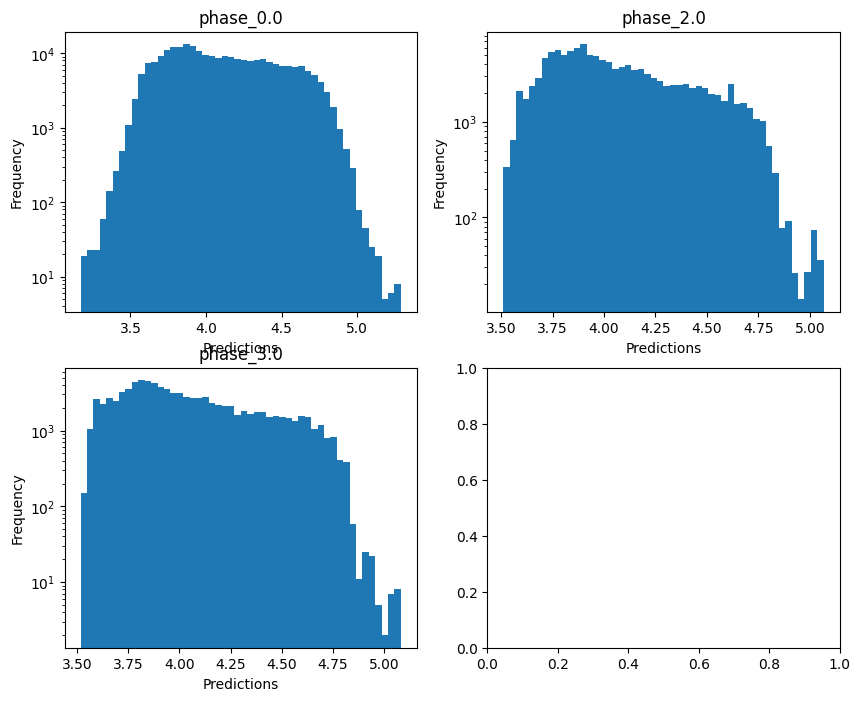

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.018028462473181905
  RMSE :  0.6334188762017741
  MAE :  0.407129206751529
  MedAE :  0.23076138325924767
  CORR :  0.7046979218887869
  MAX_ER :  4.35048778102301
  Percentiles : 
    75th percentile :  0.45812133161074264
    90th percentile :  1.1374612404266327
    95th percentile :  1.563844966961684
    99th percentile :  2.1560147021549656

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  -0.19531321676770408
  RMSE :  1.0997720803978102
  MAE :  0.8537161421153929
  MedAE :  0.6763496953115613
  CORR :  0.34802199380066323
  MAX_ER :  4.563474083382333
  Percentiles : 
    75th percentile :  1.20317592288109
    90th percentile :  1.8073801846168043
    95th percentile :  2.234048679100878
    99th percentile :  3.123146714561374

log_g results for the phase cate

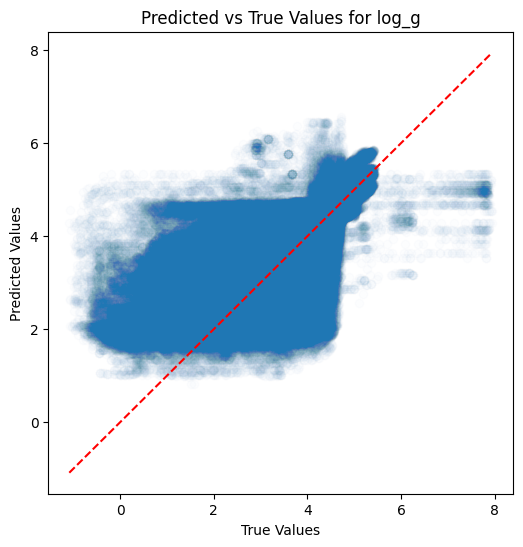

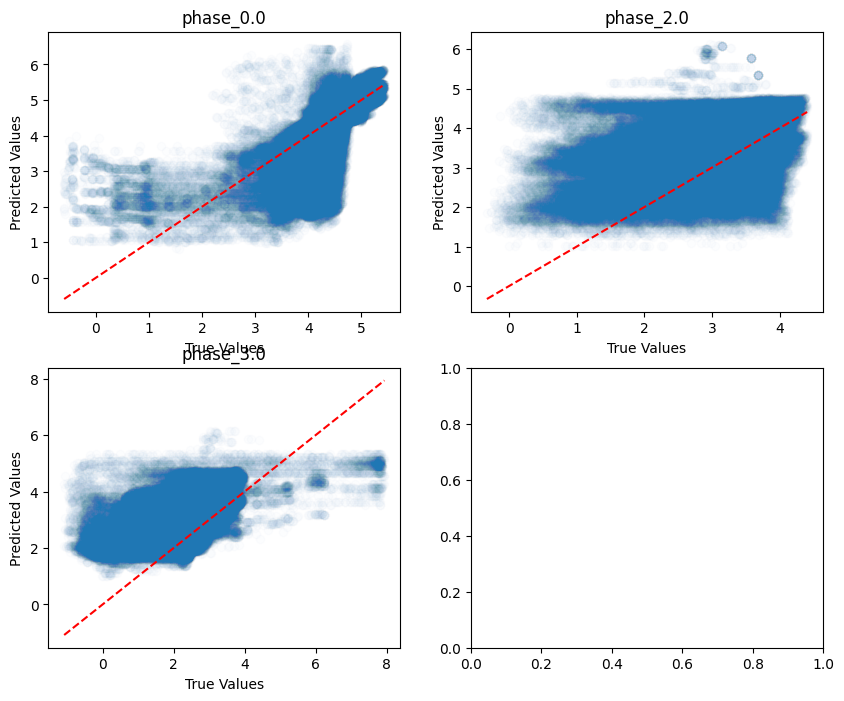

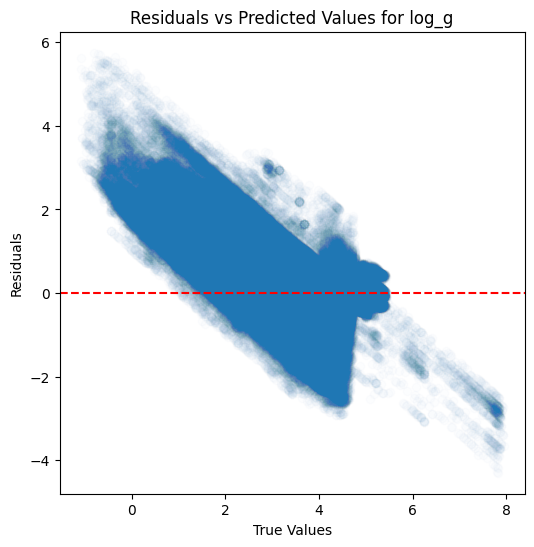

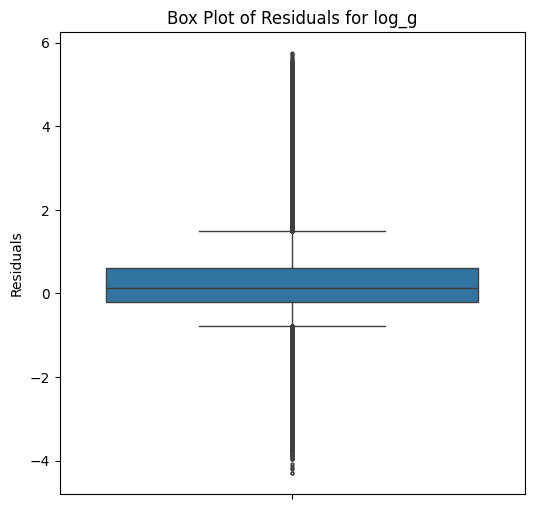

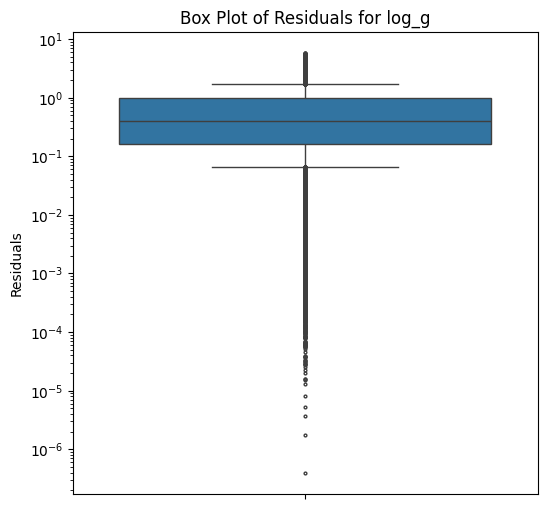

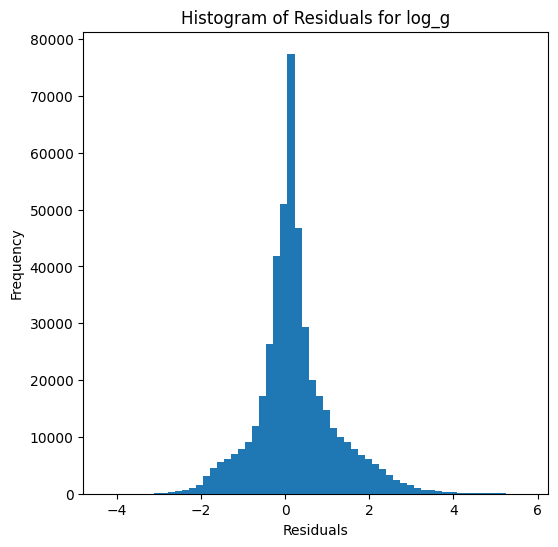

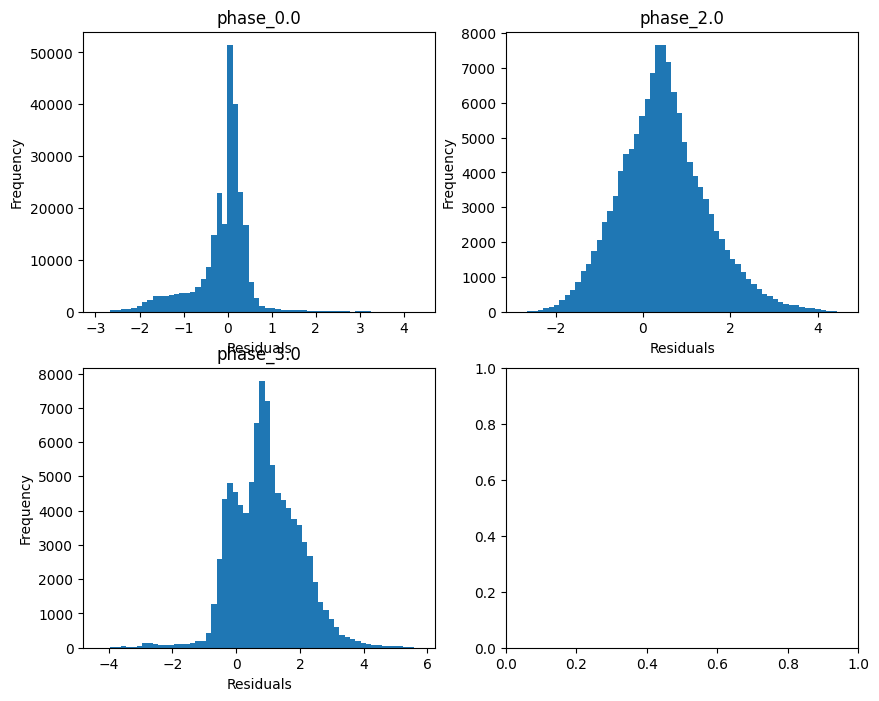

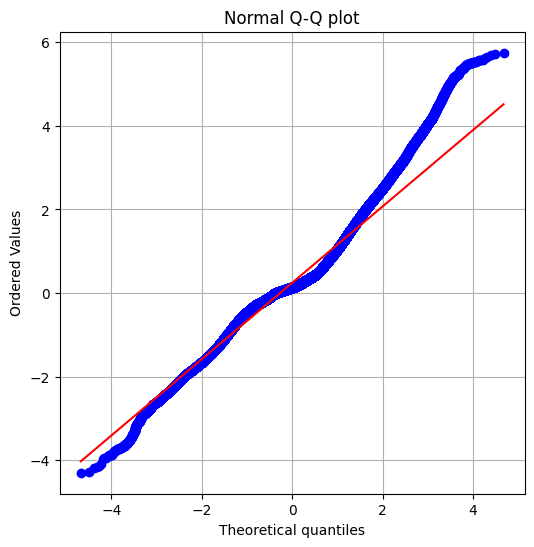

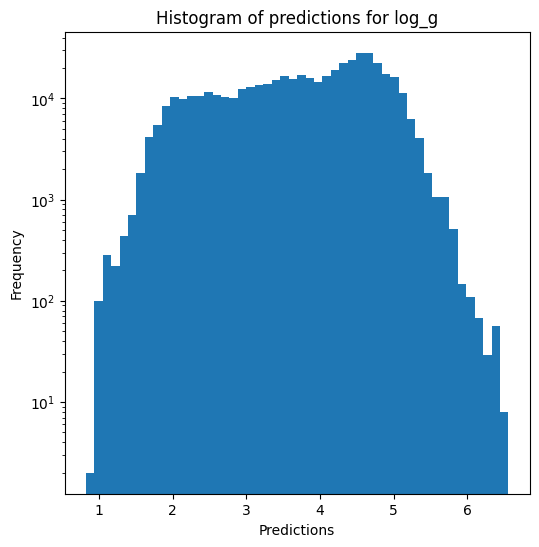

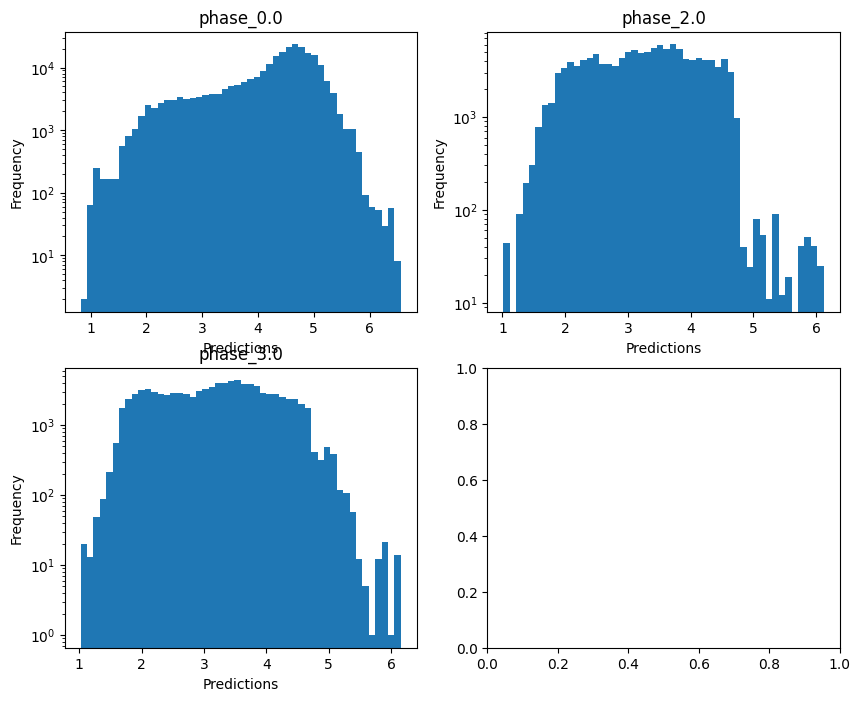


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.6886416857635272
  RMSE :  0.3236924973769144
  MAE :  0.20970957237252955
  MedAE :  0.12252867222402483
  CORR :  0.8656990226304223
  MAX_ER :  2.3062744362624206
  Percentiles : 
    75th percentile :  0.24296132952112584
    90th percentile :  0.568709567570446
    95th percentile :  0.7838081389430045
    99th percentile :  1.1102121662774866

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.900376516729969
  RVE :  -0.037836654284203464
  RMSE :  0.5554299983388917
  MAE :  0.42600512073432817
  MedAE :  0.3309393568596602
  CORR :  0.45801677635077426
  MAX_ER :  2.2923828089097706
  Percentiles : 
    75th percentile :  0.6007236423766789
    90th percentile :  0.9078574841255928
    95th percentile :  1.1339115810605989
    99th percentile :  1.6492622879770953

radius results for the phase category wi

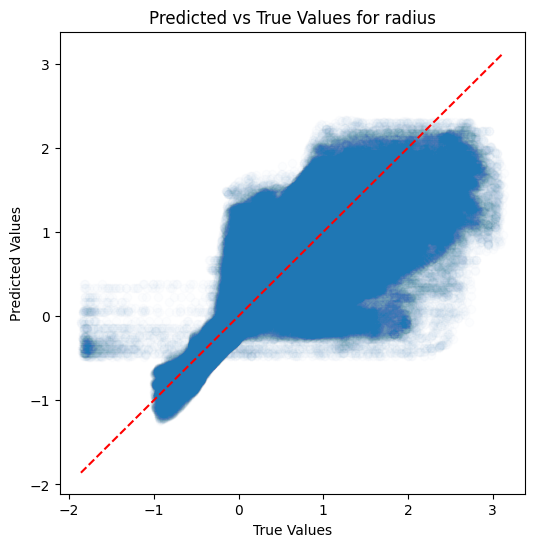

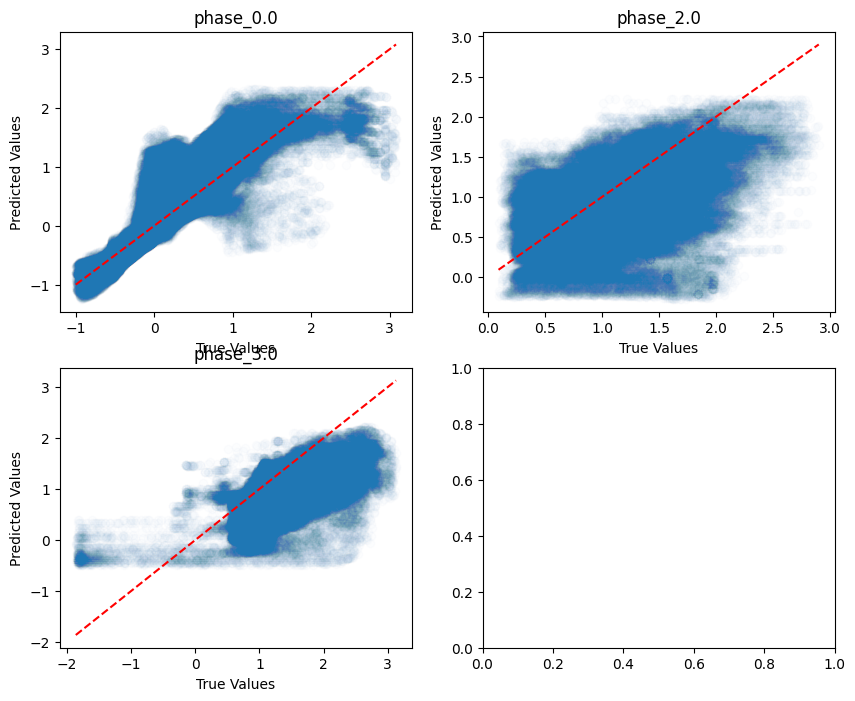

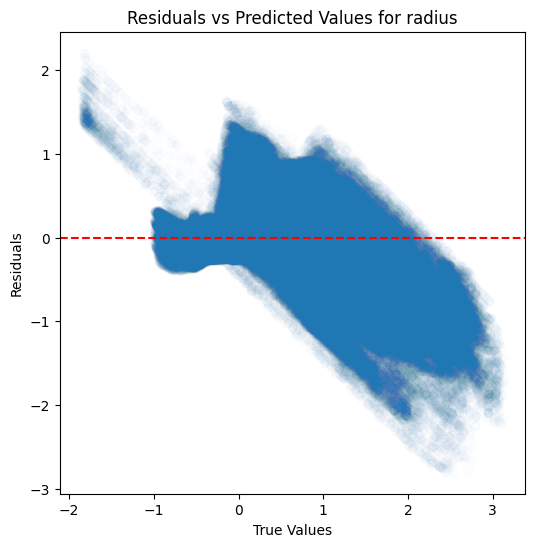

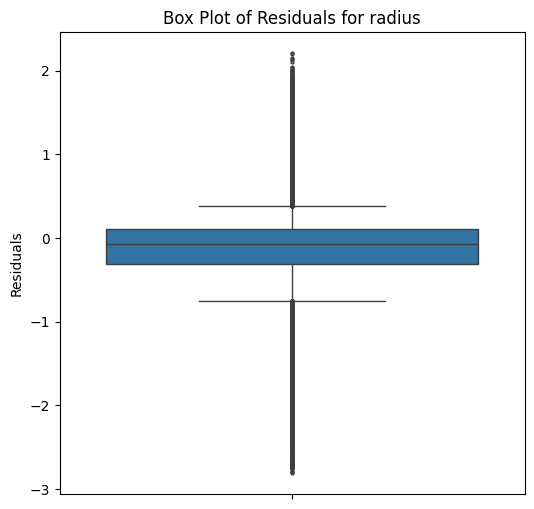

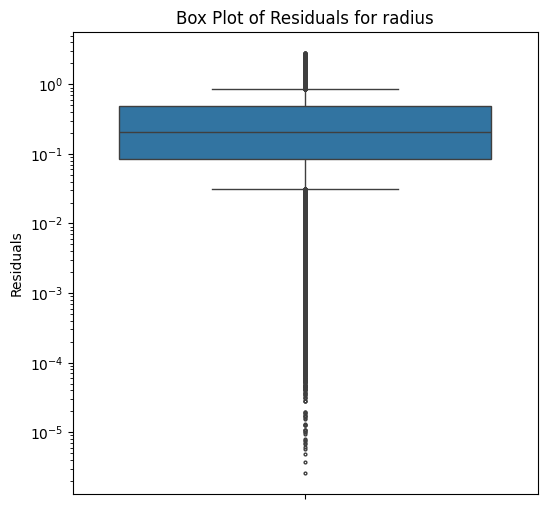

...

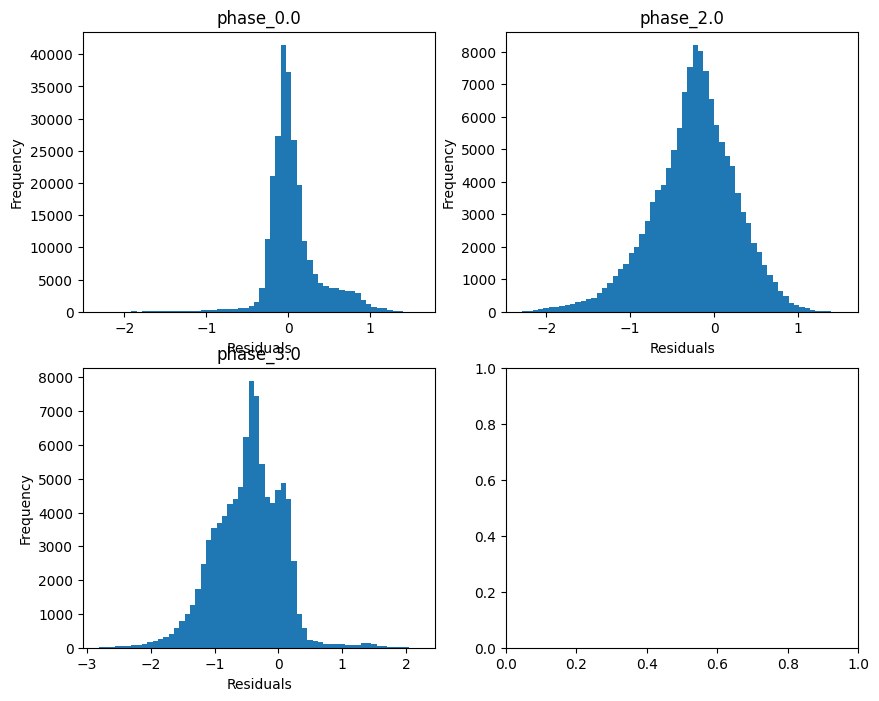

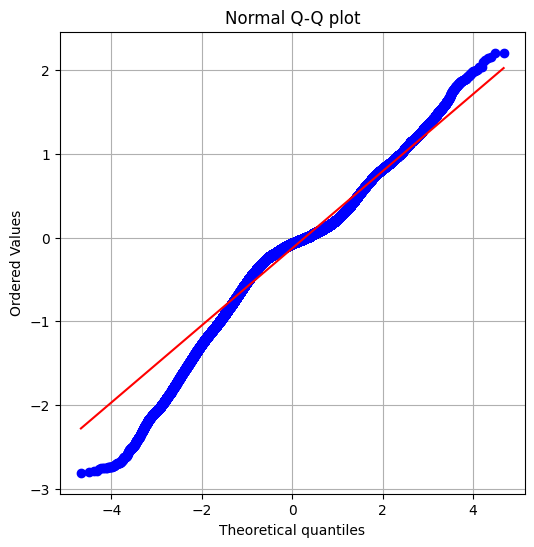

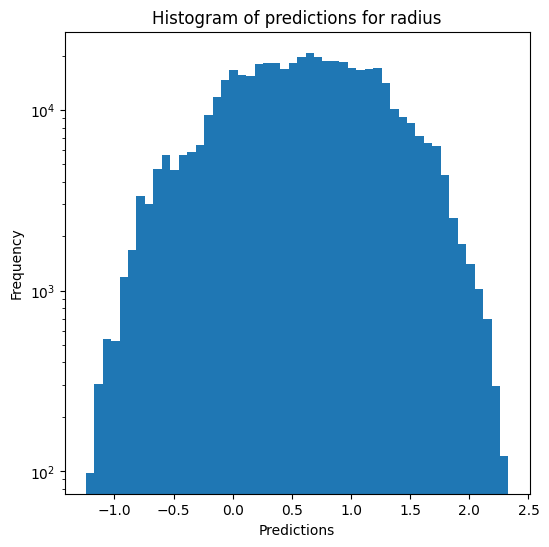

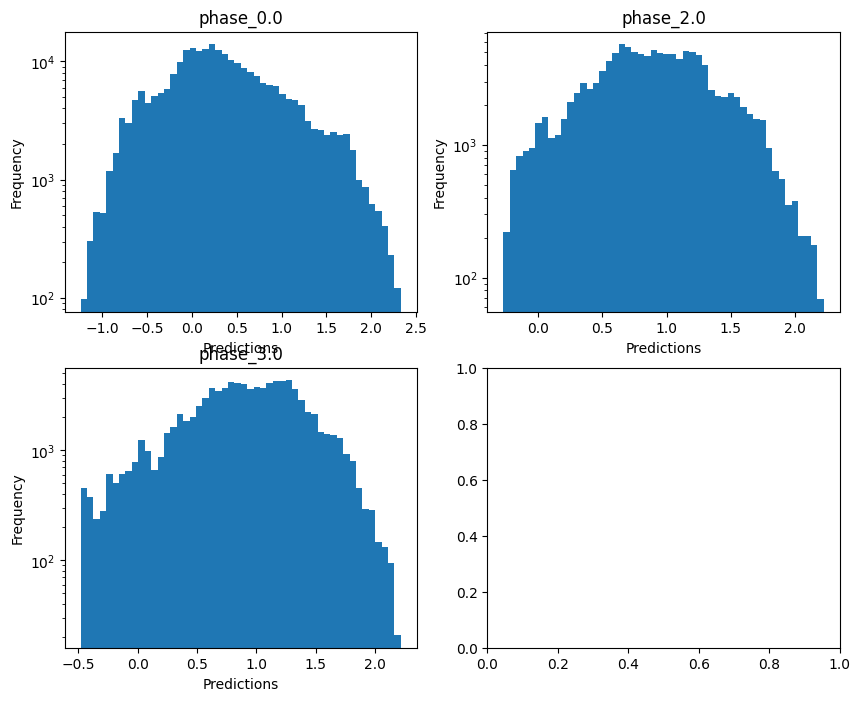

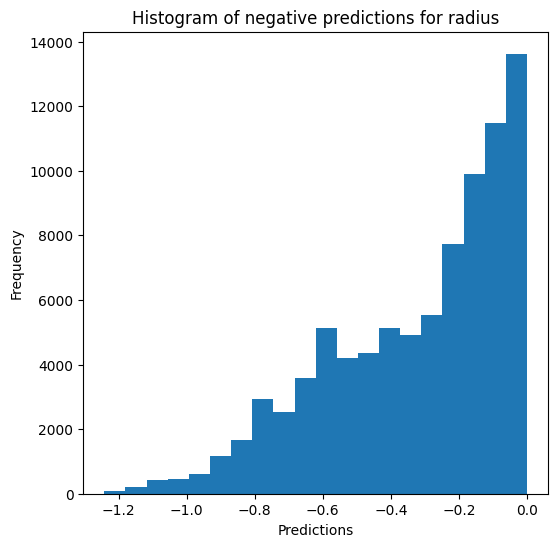

Saving results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=False, use_preds=True, save=True, show=True, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400) #, override=False, use_preds=True)